<a href="https://colab.research.google.com/github/NellyDyulgerova/Customer-Satisfaction-Olist/blob/main/Team_3_Technical_submission_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Uploading data and preprocessing

## Importing libraries and the joined SQL data from gdrive

In [ ]:
#importing standard packages
import pandas as pd
import sqlite3
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
!pip install ydata_profiling
from ydata_profiling import ProfileReport
from google.colab import drive
drive.mount('/content/gdrive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 13.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=bb71f59435e2c6b7a7738f09c344dcae040f27b96569ebbd74418a57b48dbac0
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
Mounted at /content/gdrive


In [ ]:
#Lablel Encoder
from sklearn import preprocessing
import sklearn.preprocessing as preprocessing
label_encoder=preprocessing.LabelEncoder()

In [ ]:
# import of libraries for regressions
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [ ]:
#reading data from google drive
df = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/SQLite/Database for load in Python new.csv')

In [ ]:
#df.to_excel("df.xlsx")

In [ ]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,review_creation_date,review_answer_timestamp,seller_zip_code_prefix,seller_city,seller_state,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name_english_new
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,2017-10-11 00:00:00,2017-10-12 03:43:48,9350.0,maua,SP,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1.0,595fac2a385ac33a80bd5114aec74eb8,...,2018-08-08 00:00:00,2018-08-08 18:37:50,31570.0,belo horizonte,SP,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1.0,aa4383b373c6aca5d8797843e5594415,...,2018-08-18 00:00:00,2018-08-22 19:07:58,14840.0,guariba,SP,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,2017-12-03 00:00:00,2017-12-05 19:21:58,31842.0,belo horizonte,MG,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,2018-02-17 00:00:00,2018-02-18 13:02:51,8752.0,mogi das cruzes,SP,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,stationery


In [ ]:
df.shape

(113449, 36)

In [ ]:
#analysing na
df.isnull().sum()

order_id                                 0
customer_id                              0
order_status                             0
order_purchase_timestamp                 0
order_approved_at                      147
order_delivered_carrier_date          1366
order_delivered_customer_date         2633
order_estimated_delivery_date            0
order_item_id                          173
product_id                             173
seller_id                              173
shipping_limit_date                    173
price                                  173
freight_value                          173
product_category_name_new                0
product_name_lenght                   1784
product_description_lenght            1784
product_photos_qty                    1784
product_weight_g                       191
product_length_cm                      191
product_height_cm                      191
product_width_cm                       191
review_id                              947
review_scor

## Creating new data points

### Data timestamp points

In [ ]:
#converting dates from SQL to datetime and creating new data points
df['order_delay']= (pd.to_datetime(df['order_delivered_customer_date'])- pd.to_datetime(df['order_estimated_delivery_date'])).dt.days
df['order_approval_time']= (pd.to_datetime(df['order_approved_at'])- pd.to_datetime(df['order_purchase_timestamp'])).dt.days
df['order_approval_time_sec']= (pd.to_datetime(df['order_approved_at'])- pd.to_datetime(df['order_purchase_timestamp'])).dt.total_seconds()
df['to_carrier_delivery_time']= (pd.to_datetime(df['order_delivered_carrier_date'])- pd.to_datetime(df['order_approved_at'])).dt.days
df['carrier_customer_delivery_time']= (pd.to_datetime(df['order_delivered_customer_date'])- pd.to_datetime(df['order_delivered_carrier_date'])).dt.days
df['total_delivery']= (pd.to_datetime(df['order_delivered_customer_date'])- pd.to_datetime(df['order_purchase_timestamp'])).dt.days
df['total_time_from_approval_to_delivery']= (pd.to_datetime(df['order_delivered_customer_date'])- pd.to_datetime(df['order_approved_at'])).dt.days
df.head(10)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_city,customer_state,product_category_name_english_new,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.0,87285b34884572647811a353c7ac498a,...,sao paulo,SP,housewares,-8.0,0.0,642.0,2.0,6.0,8.0,8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1.0,595fac2a385ac33a80bd5114aec74eb8,...,barreiras,BA,perfumery,-6.0,1.0,110570.0,0.0,12.0,13.0,12.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1.0,aa4383b373c6aca5d8797843e5594415,...,vianopolis,GO,auto,-18.0,0.0,994.0,0.0,9.0,9.0,9.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1.0,d0b61bfb1de832b15ba9d266ca96e5b0,...,sao goncalo do amarante,RN,pet_shop,-13.0,0.0,1073.0,3.0,9.0,13.0,13.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1.0,65266b2da20d04dbe00c5c2d3bb7859e,...,santo andre,SP,stationery,-10.0,0.0,3710.0,0.0,1.0,2.0,2.0
5,a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01 00:00:00,1.0,060cb19345d90064d1015407193c233d,...,congonhinhas,PR,auto,-6.0,0.0,788.0,1.0,14.0,16.0,16.0
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00,1.0,a1804276d9941ac0733cfd409f5206eb,...,santa rosa,RS,other,NaN,2.0,176589.0,NaN,NaN,NaN,NaN
7,6514b8ad8028c9f2cc2374ded245783f,9bdf08b4b3b52b5526ff42d37d47f222,delivered,2017-05-16 13:10:30,2017-05-16 13:22:11,2017-05-22 10:07:46,2017-05-26 12:55:51,2017-06-07 00:00:00,1.0,4520766ec412348b8d4caa5e8a18c464,...,nilopolis,RJ,auto,-12.0,0.0,701.0,5.0,4.0,9.0,9.0
8,76c6e866289321a7c93b82b54852dc33,f54a9f0e6b351c431402b8461ea51999,delivered,2017-01-23 18:29:09,2017-01-25 02:50:47,2017-01-26 14:16:31,2017-02-02 14:08:10,2017-03-06 00:00:00,1.0,ac1789e492dcd698c5c10b97a671243a,...,faxinalzinho,RS,furniture_decor,-32.0,1.0,116498.0,1.0,6.0,9.0,8.0
9,e69bfb5eb88e0ed6a785585b27e16dbf,31ad1d1b63eb9962463f764d4e6e0c9d,delivered,2017-07-29 11:55:02,2017-07-29 12:05:32,2017-08-10 19:45:24,2017-08-16 17:14:30,2017-08-23 00:00:00,1.0,9a78fb9862b10749a117f7fc3c31f051,...,sorocaba,SP,office_furniture,-7.0,0.0,630.0,12.0,5.0,18.0,18.0


In [ ]:
#dropping duplicates based on review_id
df_no_duplicate_reviews=df.sort_values('review_answer_timestamp').drop_duplicates(subset=['order_id', 'order_item_id'], keep='last')
df_no_duplicate_reviews.shape

(112784, 43)

In [ ]:
df_no_duplicate_reviews

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_city,customer_state,product_category_name_english_new,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery
35041,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,sao joaquim da barra,SP,health_beauty,36.0,0.0,0.0,53.0,1.0,54.0,54.0
35042,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,sao joaquim da barra,SP,health_beauty,36.0,0.0,0.0,53.0,1.0,54.0,54.0
35043,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,sao joaquim da barra,SP,health_beauty,36.0,0.0,0.0,53.0,1.0,54.0,54.0
61172,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,paracuru,CE,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN
31325,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,santo antonio de padua,RJ,baby,-44.0,1.0,140038.0,4.0,3.0,8.0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112677,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,santos,SP,furniture_living_room,-13.0,0.0,668.0,2.0,5.0,8.0,8.0
112941,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,sao paulo,SP,consoles_games,5.0,2.0,208202.0,0.0,20.0,23.0,21.0
112942,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,sao paulo,SP,consoles_games,5.0,2.0,208202.0,0.0,20.0,23.0,21.0
113096,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,conselheiro pena,MG,electronics,-14.0,0.0,619.0,0.0,8.0,9.0,9.0


### Order size

In [ ]:
#creating new dataframe for to calculate the order size for each order
order_size=df_no_duplicate_reviews.groupby('order_id')['order_item_id'].max().reset_index()
order_size['order_size']=order_size['order_item_id']
order_size=order_size[['order_id','order_size']]
order_size

,order_id,order_size
0,00010242fe8c5a6d1ba2dd792cb16214,1.0
1,00018f77f2f0320c557190d7a144bdd3,1.0
2,000229ec398224ef6ca0657da4fc703e,1.0
3,00024acbcdf0a6daa1e931b038114c75,1.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1.0
...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,1.0
98799,fffcd46ef2263f404302a634eb57f7eb,1.0
98800,fffce4705a9662cd70adb13d4a31832d,1.0
98801,fffe18544ffabc95dfada21779c9644f,1.0


In [ ]:
#joining the order size with the main dataframe
df_no_duplicate_reviews_merged = pd.merge(
    left=df_no_duplicate_reviews,
    right=order_size,
    left_on='order_id',
    right_on='order_id',
    indicator=True
)

In [ ]:
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,product_category_name_english_new,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery,order_size,_merge
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,health_beauty,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,health_beauty,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,health_beauty,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both
3,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,both
4,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,baby,-44.0,1.0,140038.0,4.0,3.0,8.0,7.0,1.0,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,furniture_living_room,-13.0,0.0,668.0,2.0,5.0,8.0,8.0,1.0,both
112780,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,consoles_games,5.0,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,both
112781,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,consoles_games,5.0,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,both
112782,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,electronics,-14.0,0.0,619.0,0.0,8.0,9.0,9.0,1.0,both


### Same state

In [ ]:
#creating data column which checks whether the customer and seller are in the same state (1), otherwise 0
df_no_duplicate_reviews_merged['same_state']=(df_no_duplicate_reviews_merged['seller_state']==df_no_duplicate_reviews_merged['customer_state']).astype('int')
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery,order_size,_merge,same_state
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both,0
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both,0
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both,0
3,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,both,0
4,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,-44.0,1.0,140038.0,4.0,3.0,8.0,7.0,1.0,both,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,-13.0,0.0,668.0,2.0,5.0,8.0,8.0,1.0,both,1
112780,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,5.0,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,both,0
112781,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,5.0,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,both,0
112782,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,-14.0,0.0,619.0,0.0,8.0,9.0,9.0,1.0,both,0


### Payment value

In [ ]:
#creating column which sums the total payment value that customers pay (price plus freight)
df_no_duplicate_reviews_merged['payment_value']=df_no_duplicate_reviews_merged['freight_value']+df_no_duplicate_reviews_merged['price']
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery,order_size,_merge,same_state,payment_value
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both,0,47.82
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both,0,47.82
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,0.0,0.0,53.0,1.0,54.0,54.0,3.0,both,0,47.82
3,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,both,0,NaN
4,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,1.0,140038.0,4.0,3.0,8.0,7.0,1.0,both,1,50.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,0.0,668.0,2.0,5.0,8.0,8.0,1.0,both,1,91.96
112780,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,both,0,69.15
112781,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,both,0,69.15
112782,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,0.0,619.0,0.0,8.0,9.0,9.0,1.0,both,0,166.81


In [ ]:
#dropping the "-_merge" column so that other tables can be merged
df_no_duplicate_reviews_merged = df_no_duplicate_reviews_merged.drop('_merge', axis=1)
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery,order_size,same_state,payment_value
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,0,47.82
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,0,47.82
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,36.0,0.0,0.0,53.0,1.0,54.0,54.0,3.0,0,47.82
3,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
4,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,-44.0,1.0,140038.0,4.0,3.0,8.0,7.0,1.0,1,50.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,-13.0,0.0,668.0,2.0,5.0,8.0,8.0,1.0,1,91.96
112780,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,5.0,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,0,69.15
112781,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,5.0,2.0,208202.0,0.0,20.0,23.0,21.0,2.0,0,69.15
112782,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,-14.0,0.0,619.0,0.0,8.0,9.0,9.0,1.0,0,166.81


### Seller categories

In [ ]:
#creating two columns which will help calculating the period for which the seller is on the platform
df_no_duplicate_reviews_merged['order_purchase_timestamp_min']=pd.to_datetime(df_no_duplicate_reviews_merged['order_purchase_timestamp'])
df_no_duplicate_reviews_merged['order_purchase_timestamp_max']=df_no_duplicate_reviews_merged['order_purchase_timestamp_min']

In [ ]:
#creating seller dataframe which aggregates by seller_id -> mean review score, how many orders, mean size of the order items, min and max order purchase timestamp (in the next step will be converted into days), mean delay, and total payment value
seller=df_no_duplicate_reviews_merged.groupby('seller_id').agg({'review_score':'mean','order_id':'count','order_size':'mean','order_purchase_timestamp':'min','order_purchase_timestamp_max':'max','total_delivery':'mean','payment_value':'mean'}).reset_index()
seller.head()

,seller_id,review_score,order_id,order_size,order_purchase_timestamp,order_purchase_timestamp_max,total_delivery,payment_value
0,0015a82c2db000af6aaaf3ae2ecb0532,3.666667,3,1.000000,2017-09-26 22:17:05,2017-10-18 08:16:34,10.333333,916.020000
1,001cca7ae9ae17fb1caed9dfb1094831,3.902542,239,1.439331,2017-02-04 19:06:04,2018-07-12 21:38:26,12.628205,141.983975
2,001e6ad469a905060d959994f1b41e4f,1.000000,1,1.000000,2018-08-07 22:50:37,2018-08-07 22:50:37,NaN,267.940000
3,002100f778ceb8431b7a1020ff7ab48f,3.981818,55,1.181818,2017-09-14 01:00:31,2018-04-12 12:58:23,15.777778,36.875636
4,003554e2dce176b5555353e4f3555ac8,5.000000,1,1.000000,2017-12-15 06:52:25,2017-12-15 06:52:25,4.000000,139.380000


In [ ]:
#calculating how many months the seller is selling on the platform
seller['time_as_seller']=(pd.to_datetime(seller['order_purchase_timestamp_max'])-pd.to_datetime(seller['order_purchase_timestamp'])).dt.days/30
seller.head()

,seller_id,review_score,order_id,order_size,order_purchase_timestamp,order_purchase_timestamp_max,total_delivery,payment_value,time_as_seller
0,0015a82c2db000af6aaaf3ae2ecb0532,3.666667,3,1.000000,2017-09-26 22:17:05,2017-10-18 08:16:34,10.333333,916.020000,0.700000
1,001cca7ae9ae17fb1caed9dfb1094831,3.902542,239,1.439331,2017-02-04 19:06:04,2018-07-12 21:38:26,12.628205,141.983975,17.433333
2,001e6ad469a905060d959994f1b41e4f,1.000000,1,1.000000,2018-08-07 22:50:37,2018-08-07 22:50:37,NaN,267.940000,0.000000
3,002100f778ceb8431b7a1020ff7ab48f,3.981818,55,1.181818,2017-09-14 01:00:31,2018-04-12 12:58:23,15.777778,36.875636,7.000000
4,003554e2dce176b5555353e4f3555ac8,5.000000,1,1.000000,2017-12-15 06:52:25,2017-12-15 06:52:25,4.000000,139.380000,0.000000


In [ ]:
##creating dataframe for top and bottom 20 sellers
group_seller=seller.groupby('seller_id').agg({'review_score':'mean','order_id':'count','order_size':'mean','time_as_seller':'mean','total_delivery':'mean','payment_value':'mean'}).sort_values(by='review_score').reset_index()
group_seller=group_seller.dropna()
group_seller

,seller_id,review_score,order_id,order_size,time_as_seller,total_delivery,payment_value
3,913fd0ebba70bb919f7254a02239173c,1.0,1,1.0,0.000000,13.0,179.120
5,df683dfda87bf71ac3fc63063fba369d,1.0,1,1.0,0.000000,189.0,55.950
7,9523fb39dd240aa958e040f8183d64f3,1.0,1,1.0,0.000000,21.0,168.290
8,dc120d932ddf9d4dfb6fd68beefda622,1.0,1,2.0,0.000000,14.0,144.440
12,da2782c804606d2a5d8e1760dbb3e7ec,1.0,1,1.0,0.000000,32.0,103.370
...,...,...,...,...,...,...,...
3082,a3b42d266fa8afc874b909422ce88582,5.0,1,6.0,0.000000,3.0,153.540
3083,a3fa18b3f688ec0fca3eb8bfcbd2d5b3,5.0,1,2.0,0.000000,14.0,42.130
3084,1cd9e0cc1839d55516843def5600816d,5.0,1,1.0,2.066667,7.4,185.344
3085,a1040efe9ff4a6f93c28b0499eada8f5,5.0,1,1.0,0.000000,17.0,1693.310


In [ ]:
top_20_sellers=group_seller.tail(20)
top_20_sellers

,seller_id,review_score,order_id,order_size,time_as_seller,total_delivery,payment_value
3067,9fe7c6641c79970ab48185498f547c09,5.0,1,1.000000,0.000000,17.000000,164.710000
3068,a08692680c77d30a0b4280da5df01c5a,5.0,1,3.235294,9.766667,10.764706,156.524118
3069,e560e4022d8f7aebf155db95946c5c0f,5.0,1,1.000000,0.966667,9.500000,435.105000
3070,a45314082d50d578a4721c9787ce09ab,5.0,1,1.000000,0.500000,5.000000,226.960000
3071,e5545d4d4473876ea78c5bcebca365c3,5.0,1,1.000000,0.000000,5.000000,57.470000
3072,a11a0e0ca67423425691db355cff69b0,5.0,1,1.000000,0.333333,5.000000,238.490000
3073,1d953075c2f0dd990bacf27b83b330f1,5.0,1,1.000000,0.000000,7.000000,78.320000
3074,a20d8058c866dbaeca014d2cd20ac62e,5.0,1,1.000000,4.866667,23.000000,619.450000
3075,08d1c9478fb0d7d7fcac9c0da4e82fc7,5.0,1,1.000000,0.000000,10.000000,605.570000
3076,a213f1bd6458f4a158f3746cb2514559,5.0,1,1.000000,0.000000,8.000000,55.950000


In [ ]:
top_20_sellers.describe()

,review_score,order_id,order_size,time_as_seller,total_delivery,payment_value
count,20.0,20.0,20.000000,20.000000,20.000000,20.000000
mean,5.0,1.0,1.511765,0.991667,10.983235,260.289906
std,0.0,0.0,1.208707,2.367565,5.637094,379.400343
min,5.0,1.0,1.000000,0.000000,3.000000,35.010000
25%,5.0,1.0,1.000000,0.000000,7.000000,57.090000
50%,5.0,1.0,1.000000,0.000000,9.750000,145.315000
75%,5.0,1.0,1.250000,0.616667,14.750000,229.842500
max,5.0,1.0,6.000000,9.766667,23.000000,1693.310000


In [ ]:
bottom_20_sellers=group_seller.head(20)
bottom_20_sellers

,seller_id,review_score,order_id,order_size,time_as_seller,total_delivery,payment_value
3,913fd0ebba70bb919f7254a02239173c,1.0,1,1.00,0.000000,13.000,179.120000
5,df683dfda87bf71ac3fc63063fba369d,1.0,1,1.00,0.000000,189.000,55.950000
7,9523fb39dd240aa958e040f8183d64f3,1.0,1,1.00,0.000000,21.000,168.290000
8,dc120d932ddf9d4dfb6fd68beefda622,1.0,1,2.00,0.000000,14.000,144.440000
12,da2782c804606d2a5d8e1760dbb3e7ec,1.0,1,1.00,0.000000,32.000,103.370000
13,96f7c797de9ca20efbe14545bed63eec,1.0,1,3.00,0.000000,1.000,58.990000
15,984c273121e743dd14767befe6cb17f5,1.0,1,1.00,0.000000,33.000,280.910000
17,9bf11dfc0bec77e5a23028043c3c5a8f,1.0,1,1.00,0.000000,31.000,132.060000
19,9599519be538b98748162a2b48248960,1.0,1,3.00,0.000000,22.000,210.020000
20,244b04680fdbded0acf5aebd9c92b44a,1.0,1,1.00,3.533333,37.500,1205.503333


In [ ]:
bottom_20_sellers.describe()

,review_score,order_id,order_size,time_as_seller,total_delivery,payment_value
count,20.0,20.0,20.00000,20.000000,20.000000,20.000000
mean,1.0,1.0,1.73750,0.650000,36.418750,218.641812
std,0.0,0.0,1.41764,2.002936,41.668023,324.243593
min,1.0,1.0,1.00000,0.000000,1.000000,15.900000
25%,1.0,1.0,1.00000,0.000000,12.250000,62.830000
50%,1.0,1.0,1.00000,0.000000,31.500000,132.960000
75%,1.0,1.0,2.00000,0.000000,39.718750,170.997500
max,1.0,1.0,6.00000,8.433333,189.000000,1205.503333


In [ ]:
seller.to_excel('time_on_the_platform.xlsx')

In [ ]:
#Ranking based on the selected 5 features
bin_labels_5 = ['1', '2', '3','4','5']

seller['order_amount_score'] = pd.qcut(seller['order_id'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
seller['order_amount_score'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
bin_labels_5 = ['1', '2', '3','4','5']

seller['revenue_score'] = pd.qcut(seller['payment_value'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
seller['revenue_score'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
bin_labels_5 = ['5', '4', '3','2','1']

seller['delivery_score'] = pd.qcut(seller['total_delivery'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
seller['delivery_score'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
bin_labels_5 = ['1', '2', '3','4','5']

seller['time_as_seller_score'] = pd.qcut(seller['time_as_seller'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
seller['time_as_seller_score'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
#dropping nas
seller=seller.dropna()

In [ ]:
#setting the seller_id as index so that the mean of the axis can be calculated by taking only the columns with the rankings
seller=seller[['seller_id','order_amount_score','revenue_score','delivery_score','time_as_seller_score']]
seller=seller.set_index('seller_id')
seller

,order_amount_score,revenue_score,delivery_score,time_as_seller_score
seller_id,,,,
0015a82c2db000af6aaaf3ae2ecb0532,2,5,3,2
001cca7ae9ae17fb1caed9dfb1094831,5,4,2,5
002100f778ceb8431b7a1020ff7ab48f,5,1,1,4
003554e2dce176b5555353e4f3555ac8,1,3,5,1
004c9cd9d87a3c30c522c48c4fc07416,5,3,2,5
...,...,...,...,...
ffc470761de7d0232558ba5e786e57b7,4,2,4,4
ffdd9f82b9a447f6f8d4b91554cc7dd3,4,4,3,5
ffeee66ac5d5a62fe688b9d26f83f534,4,4,1,4


In [ ]:
#calculating the mean score per seller
seller['seller_total_score']=seller.mean(axis=1)
seller

,order_amount_score,revenue_score,delivery_score,time_as_seller_score,seller_total_score
seller_id,,,,,
0015a82c2db000af6aaaf3ae2ecb0532,2,5,3,2,3.00
001cca7ae9ae17fb1caed9dfb1094831,5,4,2,5,4.00
002100f778ceb8431b7a1020ff7ab48f,5,1,1,4,2.75
003554e2dce176b5555353e4f3555ac8,1,3,5,1,2.50
004c9cd9d87a3c30c522c48c4fc07416,5,3,2,5,3.75
...,...,...,...,...,...
ffc470761de7d0232558ba5e786e57b7,4,2,4,4,3.50
ffdd9f82b9a447f6f8d4b91554cc7dd3,4,4,3,5,4.00
ffeee66ac5d5a62fe688b9d26f83f534,4,4,1,4,3.25


In [ ]:
#categorising sellers into 5 ranks
seller['seller_cat_type'] = pd.cut(seller['seller_total_score'], bins=[0.9, 2, 3, 3.5, 4, 5], labels=['A. Basic', 'B. Standard', 'C. Above Standard', 'D. Premium','E. Top Rated'])
seller

,order_amount_score,revenue_score,delivery_score,time_as_seller_score,seller_total_score,seller_cat_type
seller_id,,,,,,
0015a82c2db000af6aaaf3ae2ecb0532,2,5,3,2,3.00,B. Standard
001cca7ae9ae17fb1caed9dfb1094831,5,4,2,5,4.00,D. Premium
002100f778ceb8431b7a1020ff7ab48f,5,1,1,4,2.75,B. Standard
003554e2dce176b5555353e4f3555ac8,1,3,5,1,2.50,B. Standard
004c9cd9d87a3c30c522c48c4fc07416,5,3,2,5,3.75,D. Premium
...,...,...,...,...,...,...
ffc470761de7d0232558ba5e786e57b7,4,2,4,4,3.50,C. Above Standard
ffdd9f82b9a447f6f8d4b91554cc7dd3,4,4,3,5,4.00,D. Premium
ffeee66ac5d5a62fe688b9d26f83f534,4,4,1,4,3.25,C. Above Standard


In [ ]:
#creating dataset to be merged with the main dataframe
seller_merge=seller
seller_merge

,order_amount_score,revenue_score,delivery_score,time_as_seller_score,seller_total_score,seller_cat_type
seller_id,,,,,,
0015a82c2db000af6aaaf3ae2ecb0532,2,5,3,2,3.00,B. Standard
001cca7ae9ae17fb1caed9dfb1094831,5,4,2,5,4.00,D. Premium
002100f778ceb8431b7a1020ff7ab48f,5,1,1,4,2.75,B. Standard
003554e2dce176b5555353e4f3555ac8,1,3,5,1,2.50,B. Standard
004c9cd9d87a3c30c522c48c4fc07416,5,3,2,5,3.75,D. Premium
...,...,...,...,...,...,...
ffc470761de7d0232558ba5e786e57b7,4,2,4,4,3.50,C. Above Standard
ffdd9f82b9a447f6f8d4b91554cc7dd3,4,4,3,5,4.00,D. Premium
ffeee66ac5d5a62fe688b9d26f83f534,4,4,1,4,3.25,C. Above Standard


In [ ]:
seller_merge.to_excel('seller_merge.xlsx')

In [ ]:
#merging with the top seller ranking dataframe created in the "Top sellers" section using left join since there are 172 orders where sellers don't have rankings due to missing features
df_no_duplicate_reviews_merged = pd.merge(
    left=df_no_duplicate_reviews_merged,
    right=seller_merge,
    left_on='seller_id',
    right_on='seller_id',
    how='left',
    indicator=True
)

In [ ]:
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,payment_value,order_purchase_timestamp_min,order_purchase_timestamp_max,order_amount_score,revenue_score,delivery_score,time_as_seller_score,seller_total_score,seller_cat_type,_merge
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,47.82,2016-09-15 12:16:38,2016-09-15 12:16:38,4,2,1,2,2.25,B. Standard,both
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,47.82,2016-09-15 12:16:38,2016-09-15 12:16:38,4,2,1,2,2.25,B. Standard,both
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,47.82,2016-09-15 12:16:38,2016-09-15 12:16:38,4,2,1,2,2.25,B. Standard,both
3,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,NaN,2016-10-22 08:25:27,2016-10-22 08:25:27,NaN,NaN,NaN,NaN,NaN,NaN,left_only
4,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,50.86,2016-10-06 20:06:26,2016-10-06 20:06:26,1,1,4,1,1.75,A. Basic,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,91.96,2017-08-28 15:14:21,2017-08-28 15:14:21,4,3,1,4,3.00,B. Standard,both
112780,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,69.15,2018-03-10 18:18:20,2018-03-10 18:18:20,3,3,1,2,2.25,B. Standard,both
112781,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,69.15,2018-03-10 18:18:20,2018-03-10 18:18:20,3,3,1,2,2.25,B. Standard,both
112782,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,166.81,2017-07-17 01:19:50,2017-07-17 01:19:50,5,2,3,5,3.75,D. Premium,both


In [ ]:
#dropping the "-_merge" column so that other table can be merged
df_no_duplicate_reviews_merged = df_no_duplicate_reviews_merged.drop('_merge', axis=1)

### Cleaning product category

In [ ]:
#cleaning data miscrepancies in the product category name English
df_no_duplicate_reviews_merged['product_category_name_english_clean']=df_no_duplicate_reviews_merged['product_category_name_english_new'].replace(['home_confort'],'home_comfort')
df_no_duplicate_reviews_merged['product_category_name_english_clean']=df_no_duplicate_reviews_merged['product_category_name_english_clean'].replace(['home_comfort_2'],'home_comfort')
df_no_duplicate_reviews_merged['product_category_name_english_clean']=df_no_duplicate_reviews_merged['product_category_name_english_clean'].replace(['home_appliances_2'],'home_appliances')
df_no_duplicate_reviews_merged['product_category_name_english_clean']=df_no_duplicate_reviews_merged['product_category_name_english_clean'].replace(['fashio_female_clothing'],'fashion_female_clothing')
df_no_duplicate_reviews_merged['product_category_name_english_clean']=df_no_duplicate_reviews_merged['product_category_name_english_clean'].replace(['costruction_tools_tools'],'construction_tools')
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,payment_value,order_purchase_timestamp_min,order_purchase_timestamp_max,order_amount_score,revenue_score,delivery_score,time_as_seller_score,seller_total_score,seller_cat_type,product_category_name_english_clean
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,47.82,2016-09-15 12:16:38,2016-09-15 12:16:38,4,2,1,2,2.25,B. Standard,health_beauty
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,47.82,2016-09-15 12:16:38,2016-09-15 12:16:38,4,2,1,2,2.25,B. Standard,health_beauty
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,47.82,2016-09-15 12:16:38,2016-09-15 12:16:38,4,2,1,2,2.25,B. Standard,health_beauty
3,e5215415bb6f76fe3b7cb68103a0d1c0,b6f6cbfc126f1ae6723fe2f9b3751208,canceled,2016-10-22 08:25:27,NaN,NaN,NaN,2016-10-24 00:00:00,NaN,NaN,...,NaN,2016-10-22 08:25:27,2016-10-22 08:25:27,NaN,NaN,NaN,NaN,NaN,NaN,other
4,e2144124f98f3bf46939bc5183104041,bd0342f59a3b8ddc416bd048b2b5d0fb,delivered,2016-10-06 20:06:26,2016-10-08 11:00:24,2016-10-12 11:00:25,2016-10-15 11:00:25,2016-11-28 00:00:00,1.0,8d3995daf4103cf13ff5400bf66c1587,...,50.86,2016-10-06 20:06:26,2016-10-06 20:06:26,1,1,4,1,1.75,A. Basic,baby
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,906a6b0a96d89ee226e4977e99b80b9e,274a720e69d300bc7696c8570f8978fe,delivered,2017-08-28 15:14:21,2017-08-28 15:25:29,2017-08-31 15:25:01,2017-09-05 19:47:44,2017-09-18 00:00:00,1.0,8466762a9393a2b2b1de73f3cf6081a3,...,91.96,2017-08-28 15:14:21,2017-08-28 15:14:21,4,3,1,4,3.00,B. Standard,furniture_living_room
112780,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,1.0,4deb009c36a910076a023947a7929201,...,69.15,2018-03-10 18:18:20,2018-03-10 18:18:20,3,3,1,2,2.25,B. Standard,consoles_games
112781,5333db16fe357175d39c82840dd3269d,7e008e5ec21e044fe30c34ec4e9d0747,delivered,2018-03-10 18:18:20,2018-03-13 04:08:22,2018-03-13 17:58:52,2018-04-03 15:32:52,2018-03-29 00:00:00,2.0,4deb009c36a910076a023947a7929201,...,69.15,2018-03-10 18:18:20,2018-03-10 18:18:20,3,3,1,2,2.25,B. Standard,consoles_games
112782,2f2df159f26ddb73d55ee72372200d3e,86a7245fffe6a418ca1658a13ecc4531,delivered,2017-07-17 01:19:50,2017-07-17 01:30:09,2017-07-17 22:14:50,2017-07-26 09:44:00,2017-08-09 00:00:00,1.0,4052517cac9e78357d895976124f6972,...,166.81,2017-07-17 01:19:50,2017-07-17 01:19:50,5,2,3,5,3.75,D. Premium,electronics


In [ ]:
#filling 0 for those product characteristics where there are no values
df_no_duplicate_reviews_merged['product_photos_qty_2']=df_no_duplicate_reviews_merged['product_photos_qty'].fillna(0)
df_no_duplicate_reviews_merged['product_description_lenght_2']=df_no_duplicate_reviews_merged['product_description_lenght'].fillna(0)
df_no_duplicate_reviews_merged['product_weight_g']=df_no_duplicate_reviews_merged['product_weight_g'].fillna(0)

### Product category

In [ ]:
#creating dataframe for the features that will be ranked
product_category=df_no_duplicate_reviews_merged.groupby('product_category_name_english_clean').agg({'review_score':'mean','order_id':'count','product_description_lenght_2':'mean','product_photos_qty_2':'mean','payment_value':'mean'}).reset_index()
product_category

,product_category_name_english_clean,review_score,order_id,product_description_lenght_2,product_photos_qty_2,payment_value
0,agro_industry_and_commerce,4.000000,212,865.518868,2.349057,369.689009
1,air_conditioning,3.969178,297,1050.919192,2.356902,207.993906
2,art,3.937198,209,953.913876,1.889952,135.156986
3,arts_and_craftmanship,4.125000,24,792.208333,3.708333,91.005833
4,audio,3.833333,364,782.939560,1.870879,154.942143
...,...,...,...,...,...,...
65,stationery,4.196078,2517,405.096941,2.890743,110.346329
66,tablets_printing_image,4.123457,83,535.975904,1.867470,105.477229
67,telephony,3.945898,4543,759.923179,2.903588,86.893304
68,toys,4.159520,4115,659.649332,2.785176,136.344279


In [ ]:
#Ranking based on the selected 5 features
bin_labels_5 = ['1', '2', '3','4','5']

product_category['product_score_count'] = pd.qcut(product_category['order_id'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
product_category['product_score_count'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
bin_labels_5 = ['1', '2', '3','4','5']

product_category['product_score_desc'] = pd.qcut(product_category['product_description_lenght_2'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
product_category['product_score_desc'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
bin_labels_5 = ['1', '2', '3','4','5']

product_category['product_score_photos'] = pd.qcut(product_category['product_photos_qty_2'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
product_category['product_score_photos'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
bin_labels_5 = ['1', '2', '3','4','5']

product_category['product_score_revenue'] = pd.qcut(product_category['payment_value'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
product_category['product_score_revenue'].replace(['1', '2', '3','4','5'],
                        [1,2,3,4,5], inplace=True)

In [ ]:
product_category=product_category.dropna()
product_category

,product_category_name_english_clean,review_score,order_id,product_description_lenght_2,product_photos_qty_2,payment_value,product_score_count,product_score_desc,product_score_photos,product_score_revenue
0,agro_industry_and_commerce,4.000000,212,865.518868,2.349057,369.689009,2,3,3,5
1,air_conditioning,3.969178,297,1050.919192,2.356902,207.993906,3,4,3,5
2,art,3.937198,209,953.913876,1.889952,135.156986,2,4,2,3
3,arts_and_craftmanship,4.125000,24,792.208333,3.708333,91.005833,1,3,5,2
4,audio,3.833333,364,782.939560,1.870879,154.942143,3,3,2,3
...,...,...,...,...,...,...,...,...,...,...
65,stationery,4.196078,2517,405.096941,2.890743,110.346329,4,1,5,2
66,tablets_printing_image,4.123457,83,535.975904,1.867470,105.477229,2,2,2,2
67,telephony,3.945898,4543,759.923179,2.903588,86.893304,5,3,5,1
68,toys,4.159520,4115,659.649332,2.785176,136.344279,5,2,5,3


In [ ]:
#creating dataframe for top and bottom 10 product cat
group_product_cat=product_category.groupby('product_category_name_english_clean').agg({'review_score':'mean','order_id':'count','product_photos_qty_2':'mean','product_description_lenght_2':'mean','payment_value':'mean'}).sort_values(by='review_score').reset_index()
group_product_cat

,product_category_name_english_clean,review_score,order_id,product_photos_qty_2,product_description_lenght_2,payment_value
0,security_and_services,2.500000,1,2.500000,483.500000,162.255000
1,diapers_and_hygiene,3.256410,1,1.743590,467.230769,54.904359
2,office_furniture,3.491950,1,1.215849,1156.361916,202.562182
3,fashion_male_clothing,3.641221,1,1.780303,586.893939,98.107803
4,fixed_telephony,3.681992,1,2.905303,978.094697,243.260644
...,...,...,...,...,...,...
65,flowers,4.419355,1,1.121212,422.696970,48.451818
66,construction_tools,4.444444,1,2.728155,701.941748,174.118155
67,books_general_interest,4.445255,1,1.802536,1084.119565,101.444620
68,fashion_childrens_clothes,4.500000,1,2.625000,302.125000,83.170000


In [ ]:
top_10_product_cat=group_product_cat.tail(10)
top_10_product_cat

,product_category_name_english_clean,review_score,order_id,product_photos_qty_2,product_description_lenght_2,payment_value
60,small_appliances_home_oven_and_coffee,4.302632,1,4.197368,1368.105263,660.441711
61,food_drink,4.310469,1,1.964029,1192.528777,70.818237
62,luggage_accessories,4.315257,1,2.313187,577.163004,156.479130
63,books_technical,4.363636,1,1.074906,1323.310861,87.562247
64,books_imported,4.400000,1,1.733333,647.950000,90.161667
65,flowers,4.419355,1,1.121212,422.696970,48.451818
66,construction_tools,4.444444,1,2.728155,701.941748,174.118155
67,books_general_interest,4.445255,1,1.802536,1084.119565,101.444620
68,fashion_childrens_clothes,4.500000,1,2.625000,302.125000,83.170000
69,cds_dvds_musicals,4.642857,1,2.000000,117.000000,68.213571


In [ ]:
top_10_product_cat.describe()

,review_score,order_id,product_photos_qty_2,product_description_lenght_2,payment_value
count,10.000000,10.0,10.000000,10.000000,10.000000
mean,4.414391,1.0,2.155973,773.694119,154.086116
std,0.103980,0.0,0.903299,442.668382,182.141953
min,4.302632,1.0,1.074906,117.000000,48.451818
25%,4.327352,1.0,1.750634,461.313478,73.906178
50%,4.409677,1.0,1.982014,674.945874,88.861957
75%,4.445053,1.0,2.547047,1165.426474,142.720502
max,4.642857,1.0,4.197368,1368.105263,660.441711


In [ ]:
bottom_10_product_cat=group_product_cat.head(10)
bottom_10_product_cat

,product_category_name_english_clean,review_score,order_id,product_photos_qty_2,product_description_lenght_2,payment_value
0,security_and_services,2.500000,1,2.500000,483.500000,162.255000
1,diapers_and_hygiene,3.256410,1,1.743590,467.230769,54.904359
2,office_furniture,3.491950,1,1.215849,1156.361916,202.562182
3,fashion_male_clothing,3.641221,1,1.780303,586.893939,98.107803
4,fixed_telephony,3.681992,1,2.905303,978.094697,243.260644
5,other,3.695897,1,0.038376,10.237486,131.363702
6,fashion_female_clothing,3.750000,1,3.229167,610.000000,71.362292
7,party_supplies,3.767442,1,2.279070,385.697674,123.561628
8,furniture_mattress_and_upholstery,3.815789,1,1.368421,918.210526,157.856316
9,home_comfort,3.819172,1,1.540948,271.594828,147.077263


In [ ]:
bottom_10_product_cat.describe()

,review_score,order_id,product_photos_qty_2,product_description_lenght_2,payment_value
count,10.000000,10.0,10.000000,10.000000,10.000000
mean,3.541987,1.0,1.860103,586.782184,139.231119
std,0.403984,0.0,0.921899,347.222626,57.239517
min,2.500000,1.0,0.038376,10.237486,54.904359
25%,3.529268,1.0,1.411553,406.080948,104.471259
50%,3.688944,1.0,1.761946,535.196970,139.220483
75%,3.763081,1.0,2.444767,841.157895,161.155329
max,3.819172,1.0,3.229167,1156.361916,243.260644


In [ ]:
#the formula for calculating mean of the rankings that we chose is not working with 4 columns(not clear reason why when it works for sellers) and we created a dummy column for review with 0 so that the rankings remaing the same
product_category['review_score']=product_category['review_score']=0
product_category

,product_category_name_english_clean,review_score,order_id,product_description_lenght_2,product_photos_qty_2,payment_value,product_score_count,product_score_desc,product_score_photos,product_score_revenue
0,agro_industry_and_commerce,0,212,865.518868,2.349057,369.689009,2,3,3,5
1,air_conditioning,0,297,1050.919192,2.356902,207.993906,3,4,3,5
2,art,0,209,953.913876,1.889952,135.156986,2,4,2,3
3,arts_and_craftmanship,0,24,792.208333,3.708333,91.005833,1,3,5,2
4,audio,0,364,782.939560,1.870879,154.942143,3,3,2,3
...,...,...,...,...,...,...,...,...,...,...
65,stationery,0,2517,405.096941,2.890743,110.346329,4,1,5,2
66,tablets_printing_image,0,83,535.975904,1.867470,105.477229,2,2,2,2
67,telephony,0,4543,759.923179,2.903588,86.893304,5,3,5,1
68,toys,0,4115,659.649332,2.785176,136.344279,5,2,5,3


In [ ]:
#setting the product category name as index so that the mean of the axis can be calculated by taking only the columns with the rankings
product_category=product_category[['product_category_name_english_clean','review_score','product_score_count','product_score_desc','product_score_photos','product_score_revenue']]
product_category=product_category.set_index('product_category_name_english_clean')
product_category

,review_score,product_score_count,product_score_desc,product_score_photos,product_score_revenue
product_category_name_english_clean,,,,,
agro_industry_and_commerce,0,2,3,3,5
air_conditioning,0,3,4,3,5
art,0,2,4,2,3
arts_and_craftmanship,0,1,3,5,2
audio,0,3,3,2,3
...,...,...,...,...,...
stationery,0,4,1,5,2
tablets_printing_image,0,2,2,2,2
telephony,0,5,3,5,1


In [ ]:
#calculating the mean score per product category
product_category['product_category_total_score']=product_category.mean(axis=1)
product_category

,review_score,product_score_count,product_score_desc,product_score_photos,product_score_revenue,product_category_total_score
product_category_name_english_clean,,,,,,
agro_industry_and_commerce,0,2,3,3,5,2.6
air_conditioning,0,3,4,3,5,3.0
art,0,2,4,2,3,2.2
arts_and_craftmanship,0,1,3,5,2,2.2
audio,0,3,3,2,3,2.2
...,...,...,...,...,...,...
stationery,0,4,1,5,2,2.4
tablets_printing_image,0,2,2,2,2,1.6
telephony,0,5,3,5,1,2.8


In [ ]:
#categorising product categories into 5 ranks
product_category['product_cat_type'] = pd.cut(product_category['product_category_total_score'], bins=[0.7,1.4,2,2.5,3,3.7], labels=['A. Basic', 'B. Standard', 'C. Above Standard', 'D. Premium','E. Top Rated'])
product_category

,review_score,product_score_count,product_score_desc,product_score_photos,product_score_revenue,product_category_total_score,product_cat_type
product_category_name_english_clean,,,,,,,
agro_industry_and_commerce,0,2,3,3,5,2.6,D. Premium
air_conditioning,0,3,4,3,5,3.0,D. Premium
art,0,2,4,2,3,2.2,C. Above Standard
arts_and_craftmanship,0,1,3,5,2,2.2,C. Above Standard
audio,0,3,3,2,3,2.2,C. Above Standard
...,...,...,...,...,...,...,...
stationery,0,4,1,5,2,2.4,C. Above Standard
tablets_printing_image,0,2,2,2,2,1.6,B. Standard
telephony,0,5,3,5,1,2.8,D. Premium


In [ ]:
product_category.to_excel('product.xlsx')

In [ ]:
#creating dataset to be merged with the main dataframe without the dummy column for review
product_category_merge=product_category[['product_category_total_score','product_cat_type','product_score_photos','product_score_revenue','product_score_count','product_score_desc']]
product_category_merge

,product_category_total_score,product_cat_type,product_score_photos,product_score_revenue,product_score_count,product_score_desc
product_category_name_english_clean,,,,,,
agro_industry_and_commerce,2.6,D. Premium,3,5,2,3
air_conditioning,3.0,D. Premium,3,5,3,4
art,2.2,C. Above Standard,2,3,2,4
arts_and_craftmanship,2.2,C. Above Standard,5,2,1,3
audio,2.2,C. Above Standard,2,3,3,3
...,...,...,...,...,...,...
stationery,2.4,C. Above Standard,5,2,4,1
tablets_printing_image,1.6,B. Standard,2,2,2,2
telephony,2.8,D. Premium,5,1,5,3


In [ ]:
#merging with the product category ranking dataframe
df_no_duplicate_reviews_merged = pd.merge(
    left=df_no_duplicate_reviews_merged,
    right=product_category_merge,
    left_on='product_category_name_english_clean',
    right_on='product_category_name_english_clean',
    indicator=True
)

In [ ]:
df_no_duplicate_reviews_merged

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,product_category_name_english_clean,product_photos_qty_2,product_description_lenght_2,product_category_total_score,product_cat_type,product_score_photos,product_score_revenue,product_score_count,product_score_desc,_merge
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,health_beauty,1.0,1036.0,3.0,D. Premium,2,3,5,5,both
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,health_beauty,1.0,1036.0,3.0,D. Premium,2,3,5,5,both
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,health_beauty,1.0,1036.0,3.0,D. Premium,2,3,5,5,both
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,delivered,2016-10-07 14:40:45,2016-10-07 14:52:25,2016-10-15 12:33:31,2016-10-18 01:37:54,2016-12-05 00:00:00,1.0,d5f4f441812a9a67cf8fa6d6019192c8,...,health_beauty,1.0,1540.0,3.0,D. Premium,2,3,5,5,both
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,delivered,2016-10-05 20:36:39,2016-10-06 16:02:59,2016-10-10 16:03:01,2016-10-16 17:51:52,2016-11-29 00:00:00,1.0,2636a9812d151c718b53387171ce08be,...,health_beauty,1.0,2088.0,3.0,D. Premium,2,3,5,5,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,delivered,2018-06-11 10:16:35,2018-06-12 08:41:58,2018-06-14 12:39:00,2018-06-18 18:37:45,2018-07-05 00:00:00,1.0,065554bfe0244b9f5f6414f332106a21,...,flowers,1.0,145.0,0.8,A. Basic,1,1,1,1,both
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,delivered,2018-07-18 20:57:45,2018-07-18 21:05:19,2018-07-19 10:22:00,2018-07-26 12:08:52,2018-08-03 00:00:00,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,...,flowers,1.0,305.0,0.8,A. Basic,1,1,1,1,both
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,delivered,2018-07-19 01:00:07,2018-07-20 05:03:25,2018-07-24 06:53:00,2018-07-31 17:13:38,2018-08-10 00:00:00,1.0,e0714d4d2e52b1fbc8e851dac210333a,...,flowers,3.0,1650.0,0.8,A. Basic,1,1,1,1,both
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,delivered,2018-01-12 19:43:25,2018-01-12 19:52:28,2018-01-16 22:21:35,2018-01-28 13:16:42,2018-02-07 00:00:00,1.0,065554bfe0244b9f5f6414f332106a21,...,flowers,1.0,145.0,0.8,A. Basic,1,1,1,1,both


## Dataset for statistics

In [ ]:
#creating database which gives the factors which will be analysed grouped by order_id
stats=df_no_duplicate_reviews_merged.groupby('order_id')[['total_time_from_approval_to_delivery','total_delivery','review_score','order_delay','order_approval_time','order_approval_time_sec','to_carrier_delivery_time','carrier_customer_delivery_time','order_size','product_weight_g','product_length_cm','product_width_cm','product_description_lenght_2','product_photos_qty_2','freight_value','seller_total_score','product_category_total_score','same_state','payment_value','price']].mean()
stats

,total_time_from_approval_to_delivery,total_delivery,review_score,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,order_size,product_weight_g,product_length_cm,product_width_cm,product_description_lenght_2,product_photos_qty_2,freight_value,seller_total_score,product_category_total_score,same_state,payment_value,price
order_id,,,,,,,,,,,,,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,7.0,7.0,5.0,-9.0,0.0,2793.0,6.0,1.0,1.0,650.0,28.0,14.0,598.0,4.0,13.29,3.75,3.4,0.0,72.19,58.90
00018f77f2f0320c557190d7a144bdd3,16.0,16.0,4.0,-3.0,0.0,727.0,8.0,8.0,1.0,30000.0,50.0,40.0,239.0,2.0,19.93,3.50,3.0,1.0,259.83,239.90
000229ec398224ef6ca0657da4fc703e,7.0,7.0,5.0,-14.0,0.0,899.0,1.0,6.0,1.0,3050.0,33.0,33.0,695.0,2.0,17.87,4.00,2.8,1.0,216.87,199.00
00024acbcdf0a6daa1e931b038114c75,6.0,6.0,4.0,-6.0,0.0,583.0,2.0,4.0,1.0,200.0,16.0,15.0,480.0,1.0,12.79,3.25,2.4,1.0,25.78,12.99
00042b26cf59d7ce69dfabb4e55b4fd9,25.0,25.0,5.0,-16.0,0.0,742.0,11.0,13.0,1.0,3750.0,35.0,30.0,409.0,1.0,18.14,3.50,2.8,0.0,218.04,199.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,15.0,17.0,5.0,-8.0,1.0,137635.0,0.0,15.0,1.0,10150.0,89.0,40.0,1002.0,3.0,43.41,4.25,2.4,0.0,343.40,299.99
fffcd46ef2263f404302a634eb57f7eb,6.0,9.0,5.0,-9.0,2.0,237902.0,0.0,6.0,1.0,8950.0,45.0,38.0,232.0,1.0,36.53,3.50,2.4,0.0,386.53,350.00
fffce4705a9662cd70adb13d4a31832d,3.0,4.0,5.0,-13.0,1.0,86789.0,1.0,1.0,1.0,967.0,21.0,19.0,869.0,1.0,16.95,4.50,3.0,0.0,116.85,99.90


In [ ]:
#creating binominal column for satistied/unsatisfied which will be used in the logistics regressions
stats['satisfied']=0
stats.loc[stats['review_score']>=4,'satisfied']=1
stats.head()

,total_time_from_approval_to_delivery,total_delivery,review_score,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,order_size,product_weight_g,...,product_width_cm,product_description_lenght_2,product_photos_qty_2,freight_value,seller_total_score,product_category_total_score,same_state,payment_value,price,satisfied
order_id,,,,,,,,,,,,,,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,7.0,7.0,5.0,-9.0,0.0,2793.0,6.0,1.0,1.0,650.0,...,14.0,598.0,4.0,13.29,3.75,3.4,0.0,72.19,58.90,1
00018f77f2f0320c557190d7a144bdd3,16.0,16.0,4.0,-3.0,0.0,727.0,8.0,8.0,1.0,30000.0,...,40.0,239.0,2.0,19.93,3.50,3.0,1.0,259.83,239.90,1
000229ec398224ef6ca0657da4fc703e,7.0,7.0,5.0,-14.0,0.0,899.0,1.0,6.0,1.0,3050.0,...,33.0,695.0,2.0,17.87,4.00,2.8,1.0,216.87,199.00,1
00024acbcdf0a6daa1e931b038114c75,6.0,6.0,4.0,-6.0,0.0,583.0,2.0,4.0,1.0,200.0,...,15.0,480.0,1.0,12.79,3.25,2.4,1.0,25.78,12.99,1
00042b26cf59d7ce69dfabb4e55b4fd9,25.0,25.0,5.0,-16.0,0.0,742.0,11.0,13.0,1.0,3750.0,...,30.0,409.0,1.0,18.14,3.50,2.8,0.0,218.04,199.90,1


# Total delivery time

## Analysing by grouping and binning

In [ ]:
#There is connection betweeen review score and total delivery time:
# - review score decreases with the increase of mean delivery time;
# - after 12 days total time for delivery the review score starts dropping below 4;
stats_total_delivery=stats.groupby('review_score')['total_delivery'].agg(['mean','count','median','std','min','max']).reset_index()
stats_total_delivery

,review_score,mean,count,median,std,min,max
0,1.0,20.859694,9351,16.0,16.074339,0.0,195.0
1,2.0,16.177397,2920,13.0,12.463308,1.0,208.0
2,3.0,13.790019,7915,12.0,9.952408,0.0,188.0
3,4.0,11.841771,18884,10.0,8.297164,0.0,194.0
4,5.0,10.215231,56739,9.0,6.821528,0.0,187.0


In [ ]:
#analysing based on delivery days
total_time=df.groupby('total_delivery')['review_score'].describe()
total_time

,count,mean,std,min,25%,50%,75%,max
total_delivery,,,,,,,,
0.0,18.0,3.333333,1.814970,1.0,1.0,4.0,5.0,5.0
1.0,1828.0,4.429431,1.112672,1.0,4.0,5.0,5.0,5.0
2.0,3668.0,4.404308,1.097809,1.0,4.0,5.0,5.0,5.0
3.0,4423.0,4.372598,1.148018,1.0,4.0,5.0,5.0,5.0
4.0,5604.0,4.342077,1.148701,1.0,4.0,5.0,5.0,5.0
...,...,...,...,...,...,...,...,...
191.0,1.0,1.000000,NaN,1.0,1.0,1.0,1.0,1.0
194.0,3.0,3.000000,1.732051,1.0,2.5,4.0,4.0,4.0
195.0,1.0,1.000000,NaN,1.0,1.0,1.0,1.0,1.0


<Axes: xlabel='total_delivery', ylabel='Density'>

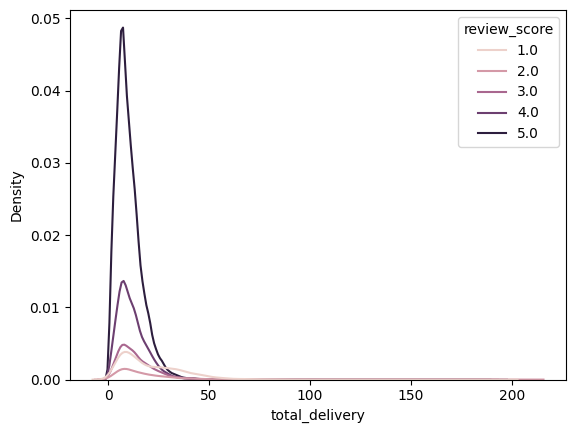

In [ ]:
#creating KDE plot
stats['total_delivery'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='total_delivery', hue='review_score')

In [ ]:
#analysing by creating bins
days_range_total_delivery=stats.groupby(pd.cut(stats['total_delivery'], np.arange(0,210, 20)))['review_score'].agg(['mean','count']).reset_index()
days_range_total_delivery

,total_delivery,mean,count
0,"(0, 20]",4.308558,83485
1,"(20, 40]",3.308572,10756
2,"(40, 60]",1.740250,1282
3,"(60, 80]",1.943182,176
4,"(80, 100]",2.135135,37
5,"(100, 120]",2.631579,19
6,"(120, 140]",2.916667,12
7,"(140, 160]",3.500000,6
8,"(160, 180]",3.200000,10
9,"(180, 200]",2.750000,12


In [ ]:
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200]
group = ['0-10','10-20','20-30', '30-40', '40-50','50-60', '60-70', '70-80', '80-90', '90-100', '> 100']
stats['delivery_range'] = pd.cut(stats['total_delivery'], bins=bins, labels=group, right=False).cat.add_categories('missing').fillna('missing')
stats.groupby('delivery_range')['review_score'].mean().reset_index()

,delivery_range,review_score
0,0-10,4.386930
1,10-20,4.219430
2,20-30,3.684606
3,30-40,2.502193
4,40-50,1.833969
5,50-60,1.649718
6,60-70,1.908333
7,70-80,1.914286
8,80-90,1.892857
9,90-100,2.750000


Text(0.5, 1.0, 'Review Score by Delivery Range')

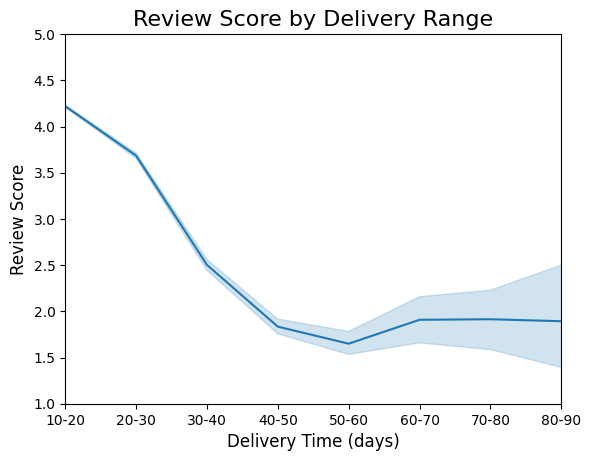

In [ ]:
ax = sns.lineplot(data=stats, x='delivery_range', y='review_score')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.ylim(1, 5)
plt.xlim(1,8)
ax.grid(False)
plt.xlabel("Delivery Time (days)", fontsize=12)
plt.ylabel("Review Score", fontsize=12)
plt.title("Review Score by Delivery Range", fontsize=16)

## Linear regression

Text(0.5, 0, 'Median days total delivery')

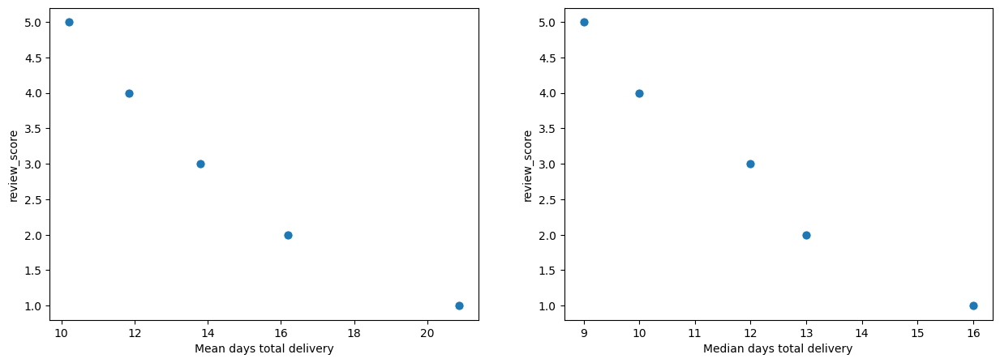

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_total_delivery, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean days total delivery")

sns.scatterplot(data=stats_total_delivery, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median days total delivery")

In [ ]:
# independent variable
X = stats_total_delivery['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_total_delivery['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
print(f"Intercept of linear regression: {reg.intercept_}")
print(f"Coefficients of linear regression: {reg.coef_}")

Intercept of linear regression: 8.400925322443554
Coefficients of linear regression: [-0.37051458]


In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean days purchase to delivery', ylabel='review_score'>

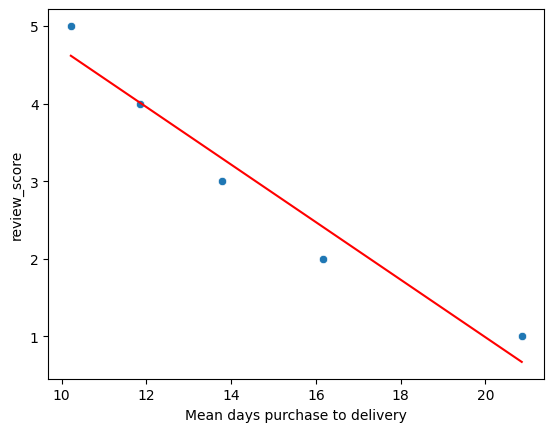

In [ ]:
sns.scatterplot(data=stats_total_delivery, x='mean', y='review_score')
plt.xlabel("Mean days purchase to delivery")

sns.lineplot(data=stats_total_delivery,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_total_delivery['mean'].values.reshape(-1, 1)
y = stats_total_delivery['review_score']

In [ ]:
X_with_constant = sm.add_constant(X)

In [ ]:
reg_sm = sm.OLS(y, X_with_constant).fit()

In [ ]:
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     56.32
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00490
Time:                        19:04:49   Log-Likelihood:                -1.3667
No. Observations:                   5   AIC:                             6.733
Df Residuals:                       3   BIC:                             5.952
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.4009      0.743     11.311      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regresion

<Axes: xlabel='total_delivery_log', ylabel='Probability'>

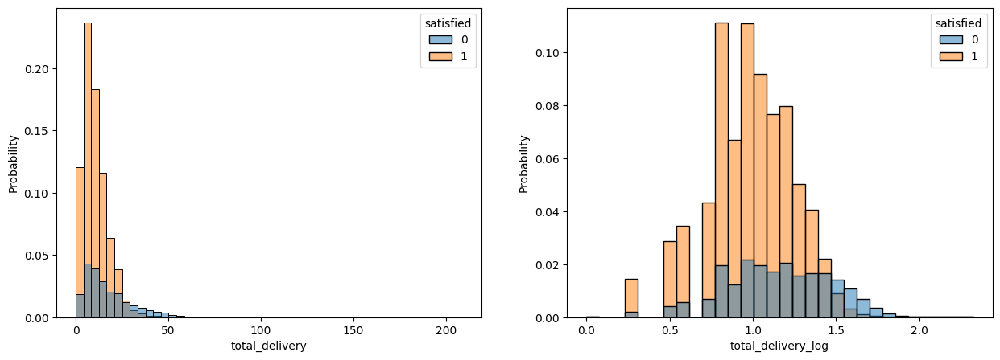

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='total_delivery',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['total_delivery_log'] = np.log10(stats['total_delivery']+1)

sns.histplot(data=stats,
             x='total_delivery_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['total_delivery_log'].isna()

X = stats.loc[no_nans_mask]['total_delivery'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

In [ ]:
print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [2.27073445]
Coefficients logistics regression: [[-0.07404999]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

In [ ]:
satisfied_probability_predicted

array([[0.14774669, 0.85225331],
       [0.25238459, 0.74761541],
       [0.14774669, 0.85225331],
       ...,
       [0.12190267, 0.87809733],
       [0.10004862, 0.89995138],
       [0.13005365, 0.86994635]])

In [ ]:
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

In [ ]:
probs_1

array([0.85225331, 0.74761541, 0.85225331, ..., 0.87809733, 0.89995138,
       0.86994635])

In [ ]:
satisfied_predicted = logistics_reg.predict(X)

In [ ]:
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='total_delivery', ylabel='satisfied'>

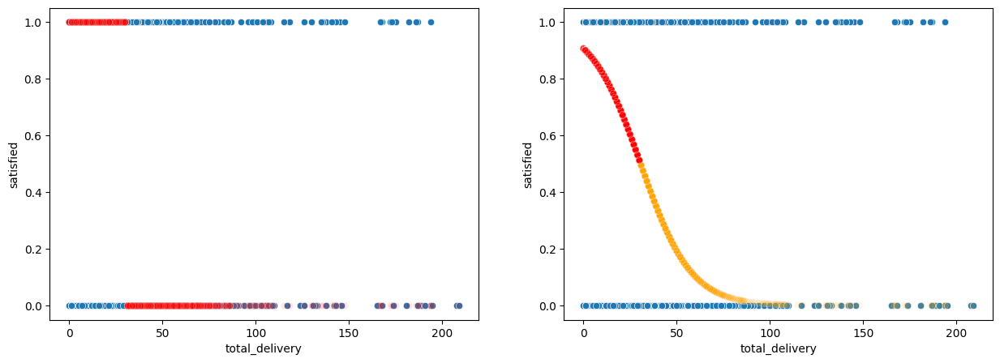

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='total_delivery',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='total_delivery',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='total_delivery',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='total_delivery',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.8065419107355761

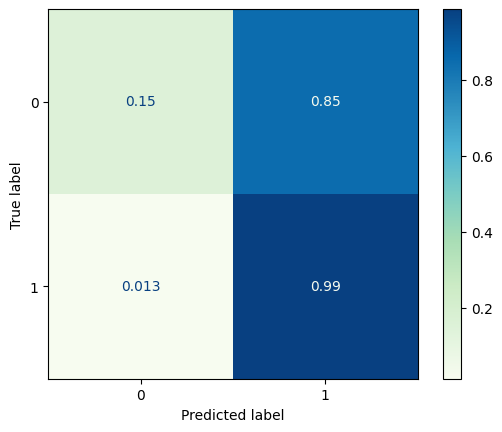

In [ ]:
cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['total_delivery'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()


Optimization terminated successfully.
         Current function value: 0.481330
         Iterations 6


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                96455
Model:                          Logit   Df Residuals:                    96453
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:                 0.07750
Time:                        19:05:28   Log-Likelihood:                -46427.
converged:                       True   LL-Null:                       -50327.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.2707      0.015    150.412      0.000       2.241       2.300
x1            -0.0741      0.001    -81.292      0.000      -0.076      -0.072


# Approval time

## Analysing by grouping and binning

In [ ]:
#There is connection betweeen review score and approval time:
# - review score decreases with the increase of mean approval time;
# - when approval time is 1 and higher the review score starts dropping below 4;

df_no_duplicate_reviews_merged.groupby('review_score')['order_approval_time'].describe()

,count,mean,std,min,25%,50%,75%,max
review_score,,,,,,,,
1.0,14150.0,0.322049,1.288083,0.0,0.0,0.0,0.0,60.0
2.0,3846.0,0.302392,0.843443,0.0,0.0,0.0,0.0,23.0
3.0,9374.0,0.287924,0.817099,0.0,0.0,0.0,0.0,30.0
4.0,21187.0,0.271865,0.727345,0.0,0.0,0.0,0.0,16.0
5.0,63139.0,0.259950,0.700394,0.0,0.0,0.0,0.0,12.0


In [ ]:
#analysing based on delivery days
approval_time=df_no_duplicate_reviews_merged.groupby('order_approval_time')['review_score'].describe()
approval_time

,count,mean,std,min,25%,50%,75%,max
order_approval_time,,,,,,,,
0.0,91610.0,4.046163,1.379334,1.0,4.00,5.0,5.00,5.0
1.0,14223.0,3.971806,1.425398,1.0,3.00,5.0,5.00,5.0
2.0,3292.0,3.968104,1.424239,1.0,3.00,5.0,5.00,5.0
3.0,1694.0,3.984061,1.397950,1.0,3.00,5.0,5.00,5.0
4.0,466.0,3.912017,1.449800,1.0,3.00,5.0,5.00,5.0
5.0,284.0,4.204225,1.235738,1.0,4.00,5.0,5.00,5.0
6.0,35.0,3.857143,1.593052,1.0,3.50,5.0,5.00,5.0
7.0,19.0,3.000000,1.972027,1.0,1.00,4.0,5.00,5.0
8.0,14.0,3.071429,1.817195,1.0,1.00,3.5,5.00,5.0


<Axes: xlabel='order_approval_time', ylabel='Density'>

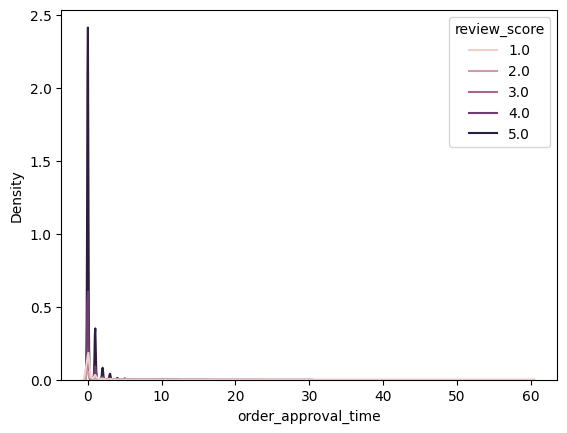

In [ ]:
#creating KDE plot
stats['order_approval_time'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='order_approval_time', hue='review_score')

## Linear regression

In [ ]:
stats_approval=stats.groupby('review_score')['order_approval_time_sec'].agg(['mean','count','median','std','min','max']).reset_index()
stats_approval

,review_score,mean,count,median,std,min,max
0,1.0,40656.744115,10833,1295.0,107259.828348,0.0,5223119.0
1,2.0,40130.686523,3072,1256.5,84746.059120,0.0,2001205.0
2,3.0,38790.640550,8079,1250.0,81616.157011,0.0,2669197.0
3,4.0,37349.820028,19003,1214.0,74115.037922,0.0,1455224.0
4,5.0,36117.478558,56921,1230.0,71007.650487,0.0,1078264.0


Text(0.5, 0, 'Median days approval time')

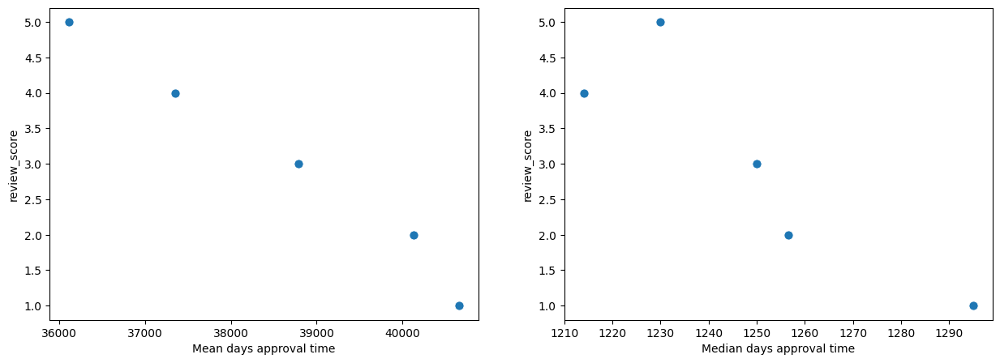

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_approval, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean days approval time")

sns.scatterplot(data=stats_approval, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median days approval time")

<Axes: xlabel='Mean days approval time', ylabel='review_score'>

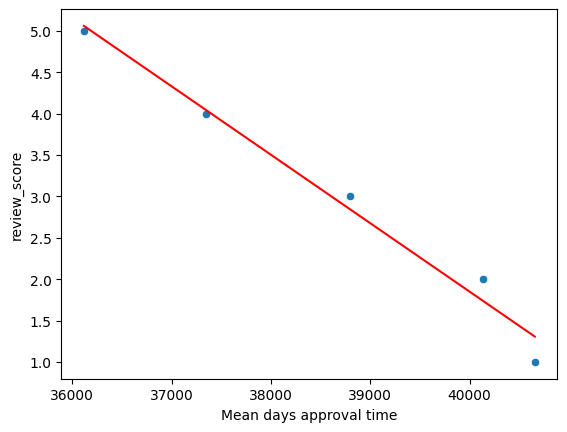

In [ ]:
# independent variable
X = stats_approval['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_approval['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_approval, x='mean', y='review_score')
plt.xlabel("Mean days approval time")

sns.lineplot(data=stats_approval,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_approval['mean'].values.reshape(-1, 1)
y = stats_approval['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.981
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     156.0
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00111
Time:                        19:08:08   Log-Likelihood:                 1.0983
No. Observations:                   5   AIC:                             1.803
Df Residuals:                       3   BIC:                             1.022
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         34.9414      2.560     13.650      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regresion

<Axes: xlabel='order_approval_time_sec_log', ylabel='Probability'>

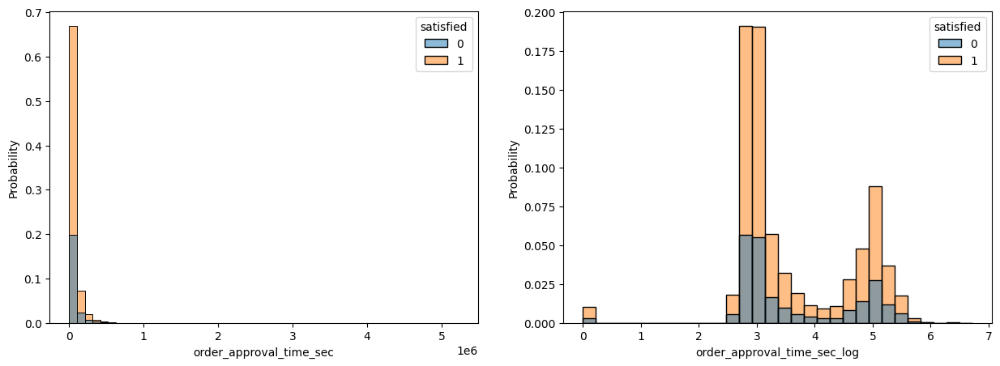

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='order_approval_time_sec',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['order_approval_time_sec_log'] = np.log10(stats['order_approval_time_sec']+1)

sns.histplot(data=stats,
             x='order_approval_time_sec_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['order_approval_time_sec_log'].isna()

X = stats.loc[no_nans_mask]['order_approval_time_sec'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [1.22586873]
Coefficients logistics regression: [[-5.24988019e-07]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='order_approval_time_sec', ylabel='satisfied'>

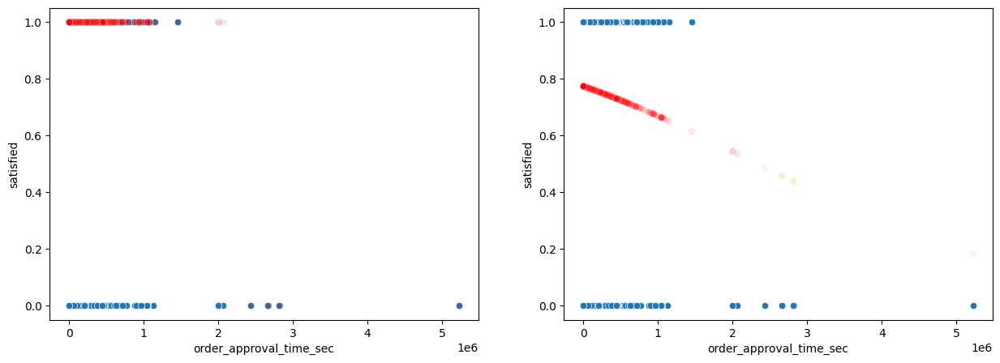

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_approval_time_sec',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_approval_time_sec',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_approval_time_sec',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_approval_time_sec',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7696362143588392

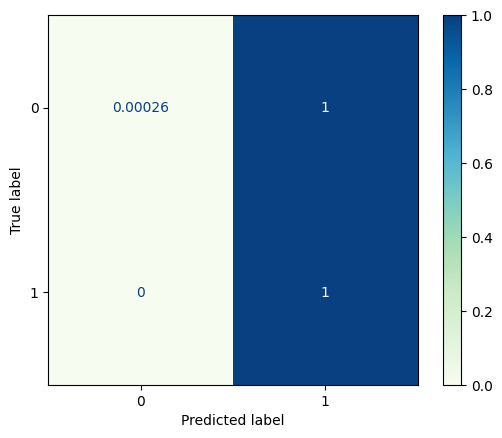

In [ ]:
cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['order_approval_time_sec'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.539630
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                98657
Model:                          Logit   Df Residuals:                    98655
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0002941
Time:                        19:08:41   Log-Likelihood:                -53238.
converged:                       True   LL-Null:                       -53254.
Covariance Type:            nonrobust   LLR p-value:                 2.188e-08
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2259      0.008    146.213      0.000       1.209       1.242
x1          -5.25e-07   9.35e-08     -5.617      0.000   -7.08e-07   -3.42e-07


# Time from approval to carrier

## Analysing by grouping and binning

In [ ]:
#There is connection betweeen review score and delivery time between approval and carrier:
# - review score decreases with the increase of mean time;
# - after ~5 days total time for delivery the review score starts dropping below 4;

df_no_duplicate_reviews_merged.groupby('review_score')['to_carrier_delivery_time'].describe()

,count,mean,std,min,25%,50%,75%,max
review_score,,,,,,,,
1.0,13215.0,3.628301,5.716091,-10.0,1.0,2.0,4.0,101.0
2.0,3755.0,2.980559,4.218512,-5.0,0.0,2.0,4.0,47.0
3.0,9316.0,2.680228,3.717571,-9.0,0.0,2.0,4.0,45.0
4.0,21151.0,2.320363,3.367774,-9.0,0.0,1.0,3.0,125.0
5.0,63068.0,1.991406,2.871416,-172.0,0.0,1.0,3.0,55.0


In [ ]:
carrier_time=df_no_duplicate_reviews_merged.groupby('to_carrier_delivery_time')['review_score'].describe()
carrier_time

,count,mean,std,min,25%,50%,75%,max
to_carrier_delivery_time,,,,,,,,
-172.0,1.0,5.000000,NaN,5.0,5.00,5.0,5.0,5.0
-10.0,11.0,3.909091,1.868397,1.0,3.00,5.0,5.0,5.0
-9.0,4.0,4.250000,0.957427,3.0,3.75,4.5,5.0,5.0
-8.0,1.0,3.000000,NaN,3.0,3.00,3.0,3.0,3.0
-7.0,8.0,3.875000,1.356203,1.0,3.75,4.0,5.0,5.0
...,...,...,...,...,...,...,...,...
62.0,1.0,1.000000,NaN,1.0,1.00,1.0,1.0,1.0
64.0,2.0,1.000000,0.000000,1.0,1.00,1.0,1.0,1.0
101.0,1.0,1.000000,NaN,1.0,1.00,1.0,1.0,1.0


In [ ]:
carrier_time.to_excel("carrier_time.xlsx")

<Axes: xlabel='to_carrier_delivery_time', ylabel='Density'>

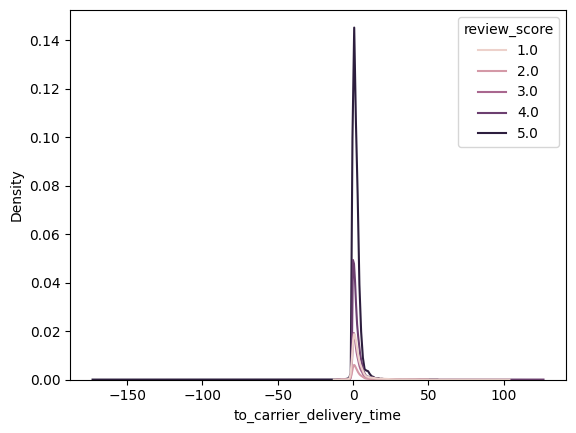

In [ ]:
#creating KDE plot
stats['to_carrier_delivery_time'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='to_carrier_delivery_time', hue='review_score')


In [ ]:
#analysing by creating bins
stats.groupby(pd.cut(stats['to_carrier_delivery_time'], np.arange(0,210, 5)))['review_score'].agg(['mean','count']).reset_index()


,to_carrier_delivery_time,mean,count
0,"(0, 5]",4.141478,58016
1,"(5, 10]",3.838574,6870
2,"(10, 15]",3.529162,1646
3,"(15, 20]",3.067545,607
4,"(20, 25]",2.660000,250
5,"(25, 30]",2.485437,103
6,"(30, 35]",2.042857,70
7,"(35, 40]",2.142857,49
8,"(40, 45]",2.480000,25
9,"(45, 50]",1.400000,10


## Linear regression

In [ ]:
stats_carrier_time=stats.groupby('review_score')['to_carrier_delivery_time'].agg(['mean','count','median','std','min','max']).reset_index()
stats_carrier_time

,review_score,mean,count,median,std,min,max
0,1.0,3.710655,10033,2.0,5.873950,-10.0,101.0
1,2.0,3.044955,3003,2.0,4.367790,-5.0,47.0
2,3.0,2.645615,8028,2.0,3.693920,-9.0,45.0
3,4.0,2.287898,18972,1.0,3.357053,-9.0,125.0
4,5.0,1.958955,56864,1.0,2.841770,-172.0,55.0


Text(0.5, 0, 'Median days carrier time')

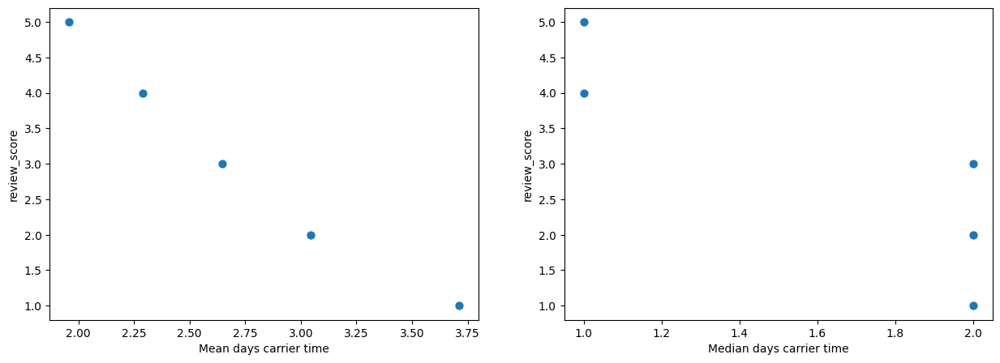

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_carrier_time, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean days carrier time")

sns.scatterplot(data=stats_carrier_time, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median days carrier time")

<Axes: xlabel='Mean days carrier time', ylabel='review_score'>

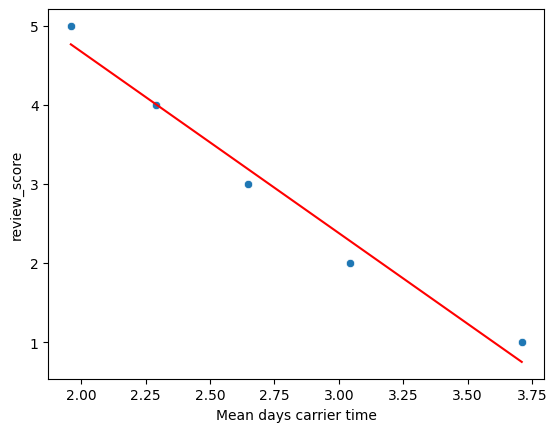

In [ ]:
# independent variable
X = stats_carrier_time['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_carrier_time['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_carrier_time, x='mean', y='review_score')
plt.xlabel("Mean days carrier time")

sns.lineplot(data=stats_carrier_time,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_carrier_time['mean'].values.reshape(-1, 1)
y = stats_carrier_time['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     127.2
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00150
Time:                        19:10:58   Log-Likelihood:                0.59825
No. Observations:                   5   AIC:                             2.803
Df Residuals:                       3   BIC:                             2.022
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          9.2592      0.569     16.282      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regresion

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='to_carrier_delivery_time_log', ylabel='Probability'>

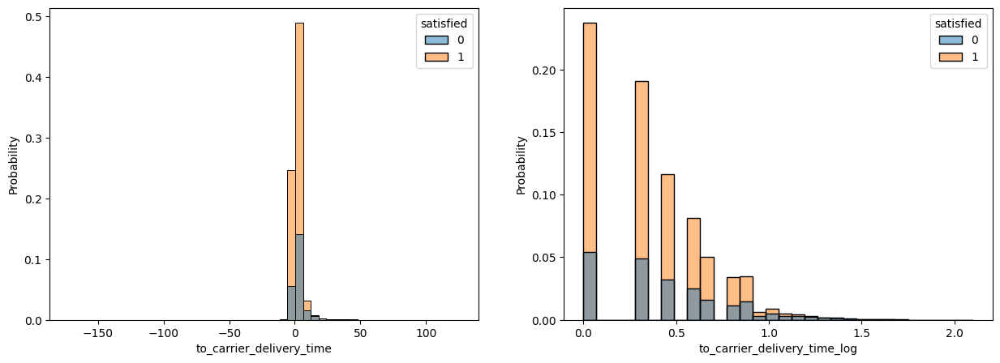

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='to_carrier_delivery_time',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['to_carrier_delivery_time_log'] = np.log10(stats['to_carrier_delivery_time']+1)

sns.histplot(data=stats,
             x='to_carrier_delivery_time_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['to_carrier_delivery_time_log'].isna()

X = stats.loc[no_nans_mask]['to_carrier_delivery_time'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [1.45521246]
Coefficients logistics regression: [[-0.08295445]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='to_carrier_delivery_time', ylabel='satisfied'>

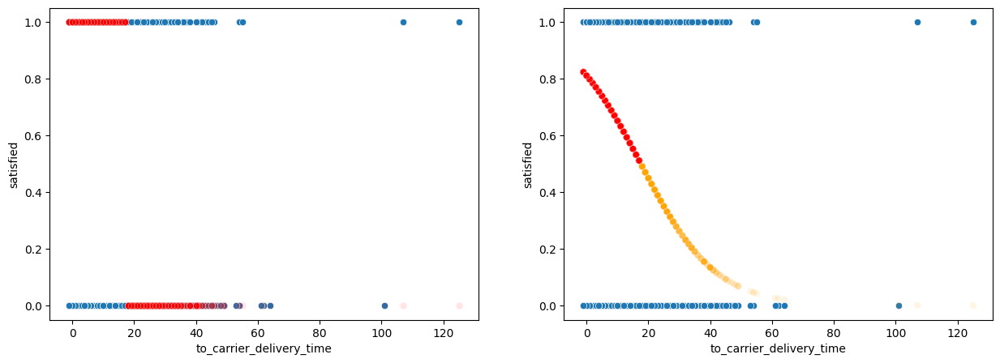

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='to_carrier_delivery_time',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='to_carrier_delivery_time',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='to_carrier_delivery_time',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='to_carrier_delivery_time',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7788686157677545

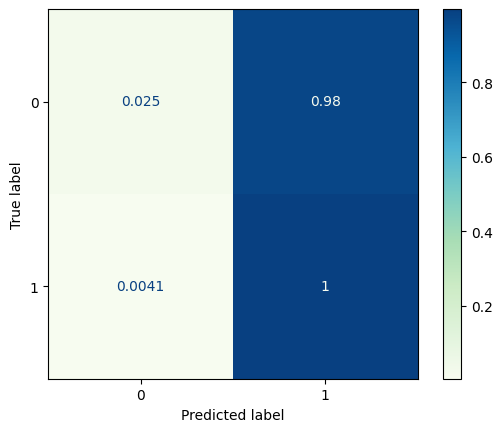

In [ ]:
cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['to_carrier_delivery_time'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.522968
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                97173
Model:                          Logit   Df Residuals:                    97171
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:                 0.01580
Time:                        19:12:21   Log-Likelihood:                -50818.
converged:                       True   LL-Null:                       -51634.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.4552      0.010    151.780      0.000       1.436       1.474
x1            -0.0830      0.002    -39.236      0.000      -0.087      -0.079


# Time from carrier to customer

## Analysing by grouping and binning

In [ ]:
#analysing based on delivery time between carrier and customer
#There is connection betweeen review score and the delivery time:
# - review score decreases with the increase of mean delivery time;
# - after 20 days total time for delivery the review score starts dropping below 4;

df_no_duplicate_reviews_merged.groupby('review_score')['carrier_customer_delivery_time'].describe()

,count,mean,std,min,25%,50%,75%,max
review_score,,,,,,,,
1.0,12487.0,14.483863,14.268850,-2.0,5.0,9.0,21.0,194.0
2.0,3668.0,11.343511,11.300579,-7.0,4.0,8.0,15.0,205.0
3.0,9194.0,9.944529,8.970368,-3.0,4.0,7.0,13.0,187.0
4.0,21060.0,8.491026,7.568888,-17.0,4.0,7.0,12.0,190.0
5.0,62937.0,7.283315,6.198387,-8.0,3.0,6.0,10.0,182.0


In [ ]:
customer_time=df_no_duplicate_reviews_merged.groupby('carrier_customer_delivery_time')['review_score'].describe()
customer_time

,count,mean,std,min,25%,50%,75%,max
carrier_customer_delivery_time,,,,,,,,
-17.0,2.0,4.0,0.000000,4.0,4.0,4.0,4.0,4.0
-8.0,4.0,4.5,0.577350,4.0,4.0,4.5,5.0,5.0
-7.0,3.0,2.0,0.000000,2.0,2.0,2.0,2.0,2.0
-6.0,4.0,3.5,1.732051,2.0,2.0,3.5,5.0,5.0
-5.0,2.0,4.0,0.000000,4.0,4.0,4.0,4.0,4.0
...,...,...,...,...,...,...,...,...
188.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
190.0,1.0,4.0,NaN,4.0,4.0,4.0,4.0,4.0
194.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0


<Axes: xlabel='carrier_customer_delivery_time', ylabel='Density'>

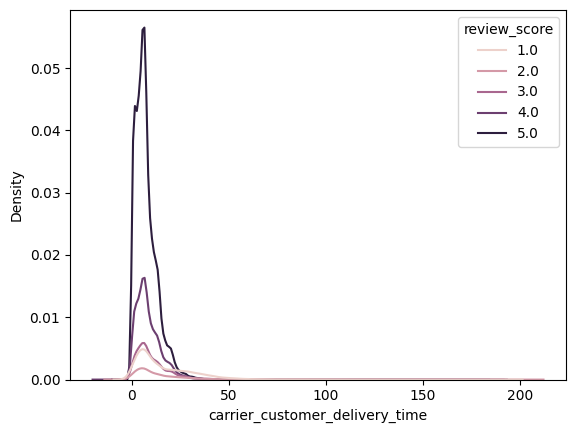

In [ ]:
#creating KDE plot
stats['carrier_customer_delivery_time'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='carrier_customer_delivery_time', hue='review_score')

In [ ]:
#analysing by creating bins
stats.groupby(pd.cut(stats['carrier_customer_delivery_time'], np.arange(0,210, 10)))['review_score'].agg(['mean','count']).reset_index()

,carrier_customer_delivery_time,mean,count
0,"(0, 10]",4.315582,65647
1,"(10, 20]",4.091708,20380
2,"(20, 30]",3.174347,4709
3,"(30, 40]",2.093103,1450
4,"(40, 50]",1.624769,541
5,"(50, 60]",1.600000,185
6,"(60, 70]",1.955556,90
7,"(70, 80]",1.852941,34
8,"(80, 90]",2.583333,12
9,"(90, 100]",2.500000,14


## Linear regression

In [ ]:
stats_customer_time=stats.groupby('review_score')['carrier_customer_delivery_time'].agg(['mean','count','median','std','min','max']).reset_index()
stats_customer_time

,review_score,mean,count,median,std,min,max
0,1.0,16.121484,9351,11.0,15.275124,-2.0,194.0
1,2.0,12.133219,2920,8.0,11.694395,-7.0,205.0
2,3.0,10.209602,7915,8.0,9.242604,-3.0,187.0
3,4.0,8.629263,18884,7.0,7.630665,-17.0,190.0
4,5.0,7.355364,56739,6.0,6.184065,-8.0,182.0


Text(0.5, 0, 'Median days carrier-customer')

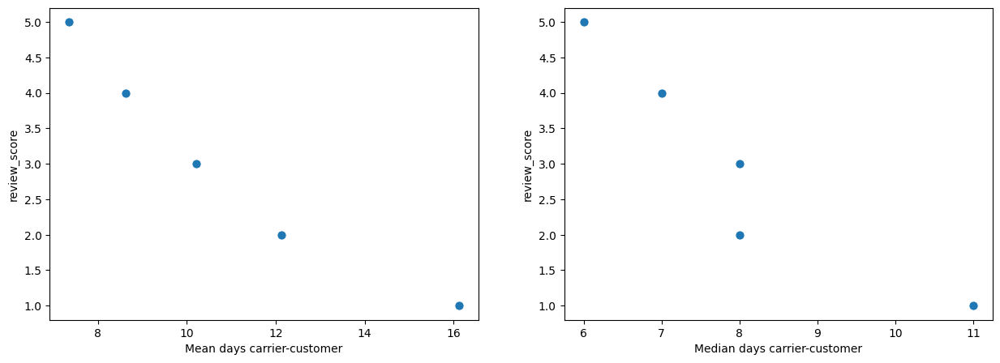

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_customer_time, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean days carrier-customer")

sns.scatterplot(data=stats_customer_time, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median days carrier-customer")

<Axes: xlabel='Mean days carrier-customer', ylabel='review_score'>

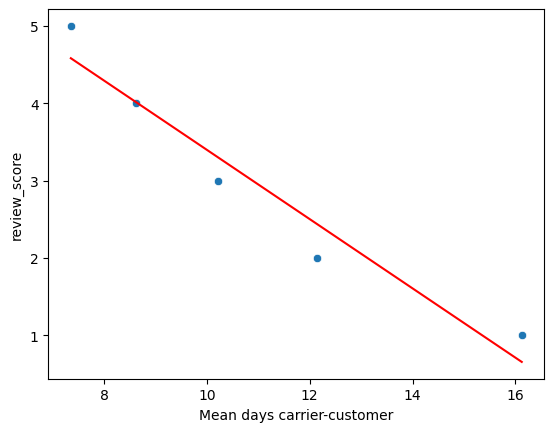

In [ ]:
# independent variable
X = stats_customer_time['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_customer_time['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_customer_time, x='mean', y='review_score')
plt.xlabel("Mean days carrier-customer")

sns.lineplot(data=stats_customer_time,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_customer_time['mean'].values.reshape(-1, 1)
y = stats_customer_time['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     48.64
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00605
Time:                        19:22:35   Log-Likelihood:                -1.7134
No. Observations:                   5   AIC:                             7.427
Df Residuals:                       3   BIC:                             6.646
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.8760      0.726     10.844      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regresion

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='carrier_customer_delivery_time_log', ylabel='Probability'>

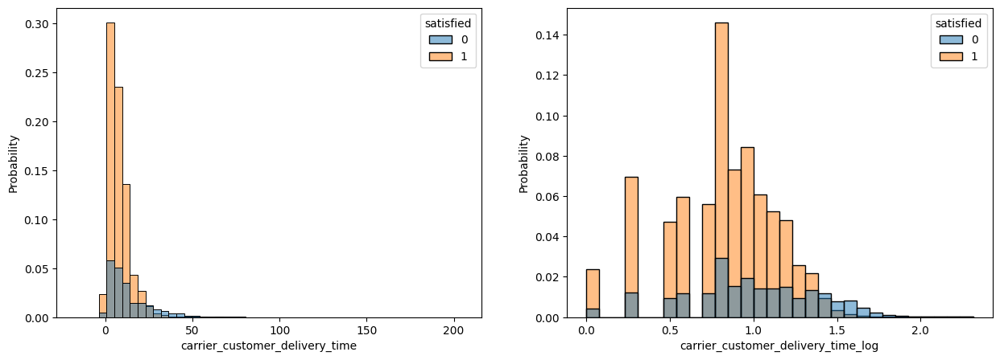

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='carrier_customer_delivery_time',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['carrier_customer_delivery_time_log'] = np.log10(stats['carrier_customer_delivery_time']+1)

sns.histplot(data=stats,
             x='carrier_customer_delivery_time_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['carrier_customer_delivery_time_log'].isna()

X = stats.loc[no_nans_mask]['carrier_customer_delivery_time'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [1.99461447]
Coefficients logistics regression: [[-0.07195991]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='carrier_customer_delivery_time', ylabel='satisfied'>

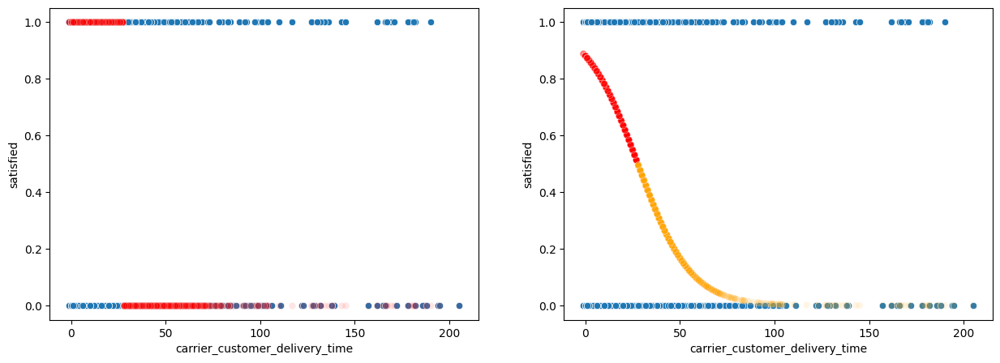

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='carrier_customer_delivery_time',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='carrier_customer_delivery_time',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='carrier_customer_delivery_time',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='carrier_customer_delivery_time',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.803585686288742

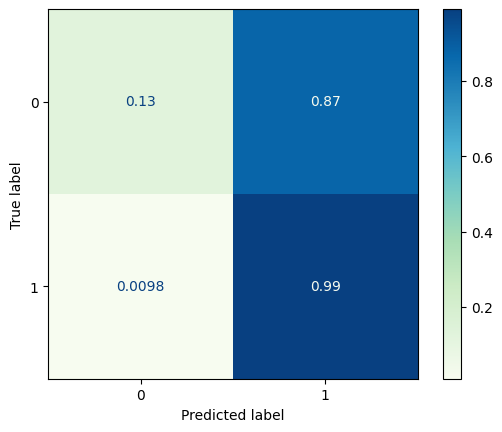

In [ ]:
cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['carrier_customer_delivery_time'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.489435
         Iterations 6


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                96439
Model:                          Logit   Df Residuals:                    96437
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:                 0.06183
Time:                        19:23:01   Log-Likelihood:                -47201.
converged:                       True   LL-Null:                       -50312.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.9946      0.013    153.540      0.000       1.969       2.020
x1            -0.0720      0.001    -73.179      0.000      -0.074      -0.070


# Order delay

## Analysing by grouping and binning

<Axes: xlabel='order_delay', ylabel='Density'>

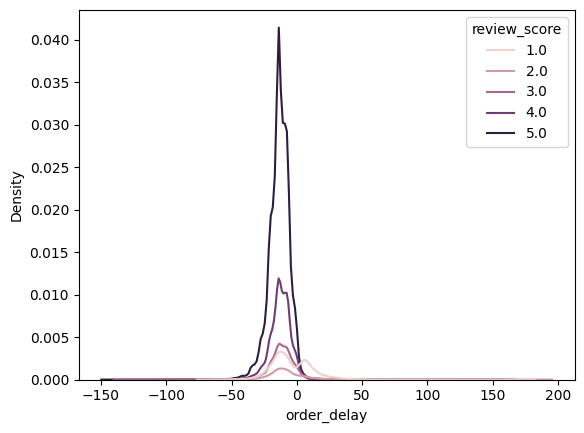

In [ ]:
#There is connection betweeen review score and delay:
# - review score decreases with the increase of delay time;
# - when there is an actual delay the review score starts dropping below 4;

stats['order_delay'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='order_delay', hue='review_score')

In [ ]:
stats['late']=(stats['order_delay']>0).astype('int')

<Axes: xlabel='late', ylabel='Density'>

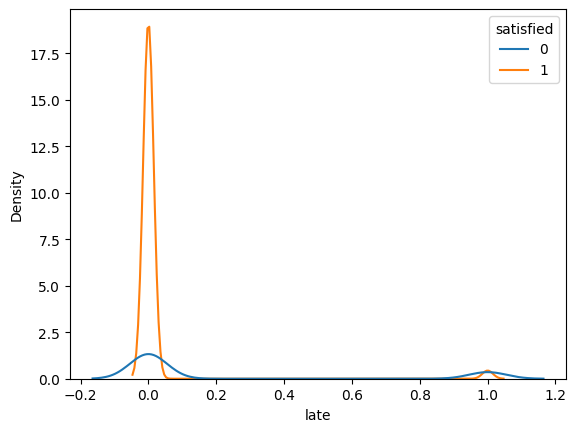

In [ ]:
sns.kdeplot(data=stats, x='late', hue='satisfied')

In [ ]:
#analysing by creating bins
stats.groupby(pd.cut(stats['order_delay'], np.arange(-90,200, 10)))['review_score'].agg(['mean','count']).reset_index()

,order_delay,mean,count
0,"(-90, -80]",5.000000,2
1,"(-80, -70]",4.818182,11
2,"(-70, -60]",4.388889,18
3,"(-60, -50]",4.287356,87
4,"(-50, -40]",4.229122,467
5,"(-40, -30]",4.258491,2120
6,"(-30, -20]",4.311730,13640
7,"(-20, -10]",4.330920,45159
8,"(-10, 0]",4.217443,27920
9,"(0, 10]",2.530884,4355


In [ ]:
#analysing based on days delay and how many scores
satisfied_delay=df_no_duplicate_reviews_merged.groupby(['order_delay','review_score']).size()
satisfied_delay

order_delay  review_score
-147.0       5.0             2
-140.0       5.0             1
-135.0       3.0             1
-124.0       5.0             2
-109.0       5.0             1
                            ..
 165.0       1.0             1
 166.0       1.0             1
 167.0       1.0             1
 175.0       1.0             1
 188.0       2.0             1
Length: 598, dtype: int64

In [ ]:
stats.groupby('review_score')['order_delay'].mean()

review_score
1.0    -4.031227
2.0    -8.620205
3.0   -10.762224
4.0   -12.383340
5.0   -13.383334
Name: order_delay, dtype: float64

In [ ]:
#creating dataframe for actual delays
unsatisfied_delay=df_no_duplicate_reviews_merged.groupby('order_delay')[['review_score']].mean()
unsatisfied_2=df.query('order_delay>0')
unsatisfied_2

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_city,customer_state,product_category_name_english_new,order_delay,order_approval_time,order_approval_time_sec,to_carrier_delivery_time,carrier_customer_delivery_time,total_delivery,total_time_from_approval_to_delivery
21,203096f03d82e0dffbc41ebc2e2bcfb7,d2b091571da224a1b36412c18bc3bbfe,delivered,2017-09-18 14:31:30,2017-09-19 04:04:09,2017-10-06 17:50:03,2017-10-09 22:23:46,2017-09-28 00:00:00,1.0,5ac9d9e379c606e36a8094a6046f75dc,...,sao paulo,SP,health_beauty,11.0,0.0,48759.0,17.0,3.0,21.0,20.0
26,fbf9ac61453ac646ce8ad9783d7d0af6,3a874b4d4c4b6543206ff5d89287f0c3,delivered,2018-02-20 23:46:53,2018-02-22 02:30:46,2018-02-26 22:25:22,2018-03-21 22:03:54,2018-03-12 00:00:00,1.0,7b717060aa783eb7f23a747a3a733dd7,...,rio de janeiro,RJ,cool_stuff,9.0,1.0,96233.0,4.0,22.0,28.0,27.0
43,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21 00:00:00,1.0,be021417a6acb56b9b50d3fd2714baa8,...,presidente venceslau,SP,housewares,7.0,0.0,10401.0,18.0,14.0,33.0,33.0
60,66e4624ae69e7dc89bd50222b59f581f,684fa6da5134b9e4dab731e00011712d,delivered,2018-03-09 14:50:15,2018-03-09 15:40:39,2018-03-15 00:31:19,2018-04-03 13:28:46,2018-04-02 00:00:00,1.0,b37b72d5a56f887725c2862184b8cab8,...,aracaju,SE,telephony,1.0,0.0,3024.0,5.0,19.0,24.0,24.0
61,66e4624ae69e7dc89bd50222b59f581f,684fa6da5134b9e4dab731e00011712d,delivered,2018-03-09 14:50:15,2018-03-09 15:40:39,2018-03-15 00:31:19,2018-04-03 13:28:46,2018-04-02 00:00:00,2.0,b37b72d5a56f887725c2862184b8cab8,...,aracaju,SE,telephony,1.0,0.0,3024.0,5.0,19.0,24.0,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113402,b3112ca67f3afd4e20cf2ee91fc4f804,6f83c71b6c044fb156d697d4130fe9b5,delivered,2018-08-02 22:46:54,2018-08-02 23:04:06,2018-08-15 17:42:00,2018-08-21 00:03:26,2018-08-16 00:00:00,2.0,4f18ca9862f511ecba98258b2194d061,...,maua,SP,furniture_bedroom,5.0,0.0,1032.0,12.0,5.0,18.0,18.0
113403,0fa1fab1d7c1211c824596ed5e111e3c,7f3bd6c94d2daf7b6462d1a894a775b4,delivered,2018-03-13 21:48:57,2018-03-13 22:40:28,2018-03-14 19:27:23,2018-04-05 19:59:49,2018-04-02 00:00:00,1.0,149de4383ccb1829ea75380fc5f0b5fa,...,sao paulo,SP,health_beauty,3.0,0.0,3091.0,0.0,22.0,22.0,22.0
113429,38e9133ce29f6bbe35aed9c3863dce01,ad312389a098ceff46ce92c4595c06d0,delivered,2017-10-12 20:54:11,2017-10-14 03:28:24,2017-10-17 17:04:42,2017-11-21 17:06:59,2017-10-31 00:00:00,1.0,014a8a503291921f7b004a5215bb3c36,...,araraquara,SP,baby,21.0,1.0,110053.0,3.0,35.0,39.0,38.0
113431,d692ef54145c9cb3322ec2e5508aa3f4,82ddfcf9438b0cd1117b55ac33184df8,delivered,2018-03-21 19:47:18,2018-03-21 20:05:26,2018-03-22 21:11:58,2018-04-11 00:48:31,2018-04-09 00:00:00,1.0,58efb9b638561ce132216a9a612513e2,...,valinhos,SP,furniture_living_room,2.0,0.0,1088.0,1.0,19.0,20.0,20.0


In [ ]:
#grouping data points based on order id for the actual late delays
stats_for_delay=unsatisfied_2.groupby('order_id')[['total_time_from_approval_to_delivery','total_delivery','review_score','order_delay','order_approval_time','to_carrier_delivery_time','carrier_customer_delivery_time']].mean()
stats_for_delay

,total_time_from_approval_to_delivery,total_delivery,review_score,order_delay,order_approval_time,to_carrier_delivery_time,carrier_customer_delivery_time
order_id,,,,,,,
000e906b789b55f64edcb1f84030f90d,17.0,17.0,3.0,2.0,0.0,1.0,16.0
0017afd5076e074a48f1f1a4c7bac9c5,46.0,46.0,1.0,4.0,0.0,10.0,35.0
001c85b5f68d2be0cb0797afc9e8ce9a,27.0,27.0,2.0,8.0,0.0,2.0,25.0
001d8f0e34a38c37f7dba2a37d4eba8b,11.0,11.0,1.0,2.0,0.0,9.0,1.0
0030d783f979fbc5981e75613b057344,42.0,42.0,1.0,22.0,0.0,20.0,21.0
...,...,...,...,...,...,...,...
ffdd178654127ccf34a439e8704fecd9,30.0,30.0,1.0,3.0,0.0,1.0,29.0
ffecd5a79a0084f6a592288c67e3c298,29.0,29.0,2.0,7.0,0.0,1.0,28.0
ffefb169ddf34cecc0622a6d3cc387f8,16.0,16.0,1.0,5.0,0.0,0.0,16.0


## Linear regression total delay

In [ ]:
stats_all_delay=stats.groupby('review_score')['order_delay'].agg(['mean','count','median','std','min','max']).reset_index()
stats_all_delay

,review_score,mean,count,median,std,min,max
0,1.0,-4.031227,9351,-7.0,16.037993,-69.0,175.0
1,2.0,-8.620205,2920,-10.0,12.637403,-56.0,188.0
2,3.0,-10.762224,7915,-11.0,10.381432,-135.0,162.0
3,4.0,-12.383340,18884,-12.0,9.057309,-75.0,161.0
4,5.0,-13.383334,56739,-13.0,8.153927,-147.0,155.0


Text(0.5, 0, 'Median days delay')

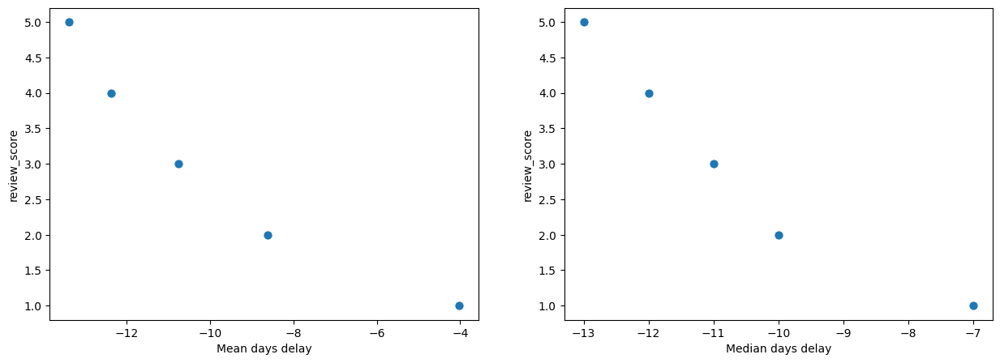

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_all_delay, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean days delay")

sns.scatterplot(data=stats_all_delay, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median days delay")

<Axes: xlabel='Mean days total delay', ylabel='review_score'>

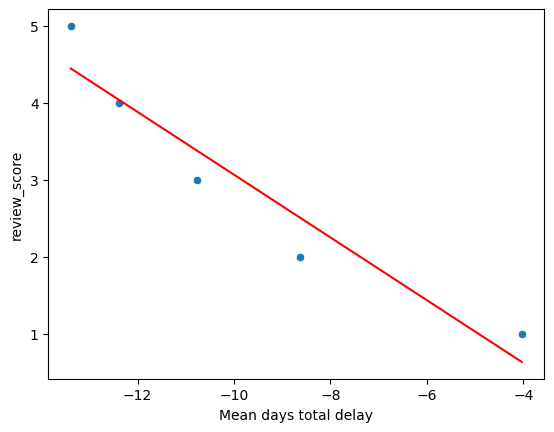

In [ ]:
# independent variable
X = stats_all_delay['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_all_delay['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_all_delay, x='mean', y='review_score')
plt.xlabel("Mean days total delay")

sns.lineplot(data=stats_all_delay,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_all_delay['mean'].values.reshape(-1, 1)
y = stats_all_delay['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     32.74
Date:                Sun, 07 Jul 2024   Prob (F-statistic):             0.0106
Time:                        19:27:28   Log-Likelihood:                -2.6336
No. Observations:                   5   AIC:                             9.267
Df Residuals:                       3   BIC:                             8.486
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.0104      0.740     -1.366      0.2

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Linear regression only actual delays

In [ ]:
stats_delay=stats_for_delay.groupby('review_score')['order_delay'].agg(['mean','count','median','std','min','max']).reset_index()
stats_delay

,review_score,mean,count,median,std,min,max
0,1.0,12.354057,3426,8.0,13.020899,1.0,175.0
1,1.5,25.000000,1,25.0,NaN,25.0,25.0
2,2.0,10.159420,552,7.0,12.335596,1.0,188.0
3,2.5,19.600000,5,16.0,12.621410,10.0,41.0
4,3.0,9.013043,690,5.0,13.679351,1.0,162.0
5,3.5,5.000000,1,5.0,NaN,5.0,5.0
6,4.0,8.391705,651,3.0,20.205982,1.0,161.0
7,5.0,6.991461,1054,3.0,15.256805,1.0,155.0


In [ ]:
stats_delay_no_outliers=stats_delay.query('count>10').reset_index()
stats_delay_no_outliers

,index,review_score,mean,count,median,std,min,max
0,0,1.0,12.354057,3426,8.0,13.020899,1.0,175.0
1,2,2.0,10.159420,552,7.0,12.335596,1.0,188.0
2,4,3.0,9.013043,690,5.0,13.679351,1.0,162.0
3,6,4.0,8.391705,651,3.0,20.205982,1.0,161.0
4,7,5.0,6.991461,1054,3.0,15.256805,1.0,155.0


Text(0.5, 0, 'Median days delay')

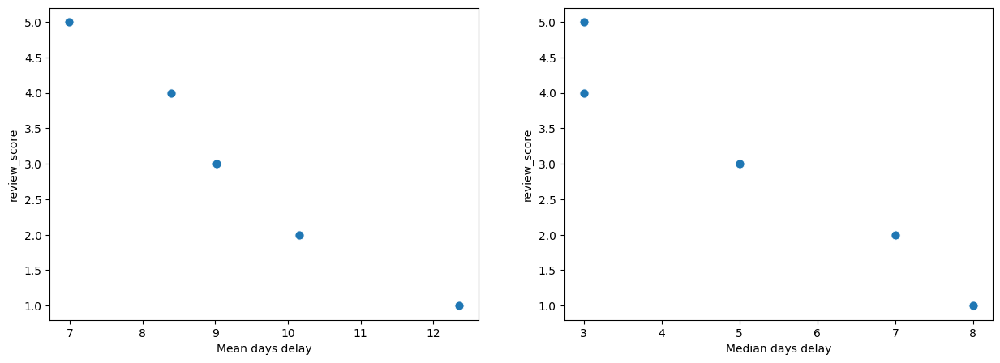

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_delay_no_outliers, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean days delay")

sns.scatterplot(data=stats_delay_no_outliers, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median days delay")

<Axes: xlabel='Mean days actual delay', ylabel='review_score'>

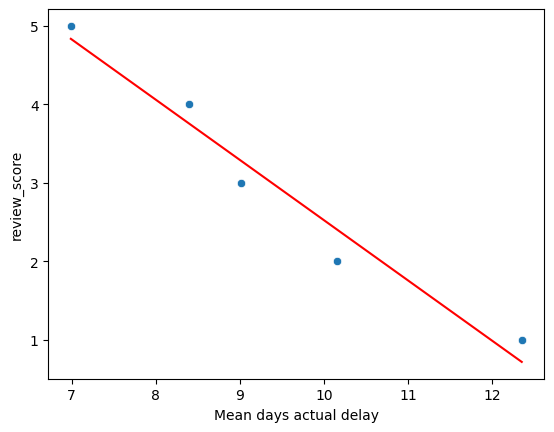

In [ ]:
# independent variable
X = stats_delay_no_outliers['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_delay_no_outliers['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_delay_no_outliers, x='mean', y='review_score')
plt.xlabel("Mean days actual delay")

sns.lineplot(data=stats_delay_no_outliers,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_delay_no_outliers['mean'].values.reshape(-1, 1)
y = stats_delay_no_outliers['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     70.76
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00352
Time:                        19:28:21   Log-Likelihood:               -0.82213
No. Observations:                   5   AIC:                             5.644
Df Residuals:                       3   BIC:                             4.863
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.2044      0.872     11.700      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regression total delay

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='order_delay_log', ylabel='Probability'>

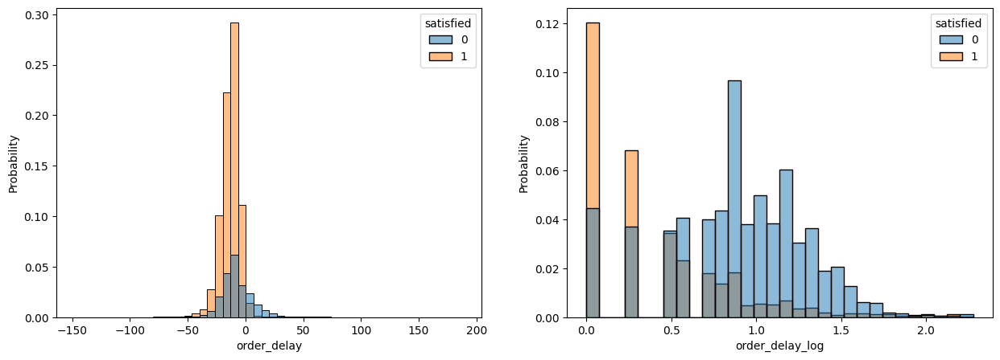

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='order_delay',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['order_delay_log'] = np.log10(stats['order_delay']+1)

sns.histplot(data=stats,
             x='order_delay_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['order_delay_log'].isna()

X = stats.loc[no_nans_mask]['order_delay'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [0.21831293]
Coefficients logistics regression: [[-0.11020029]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='order_delay', ylabel='satisfied'>

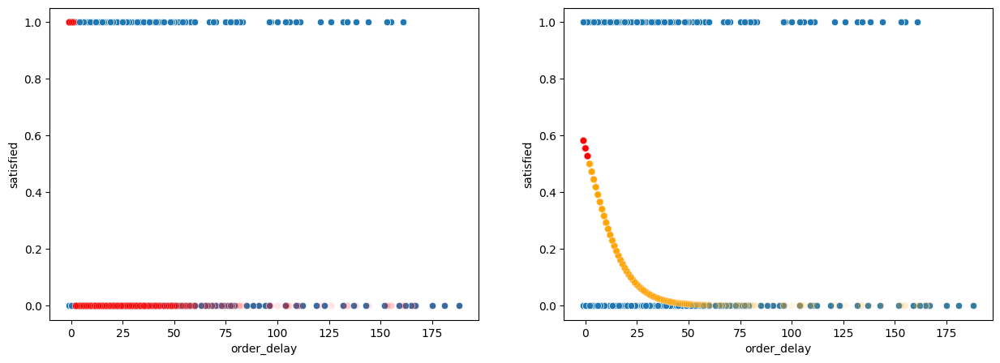

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_delay',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_delay',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_delay',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_delay',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7709701733606116

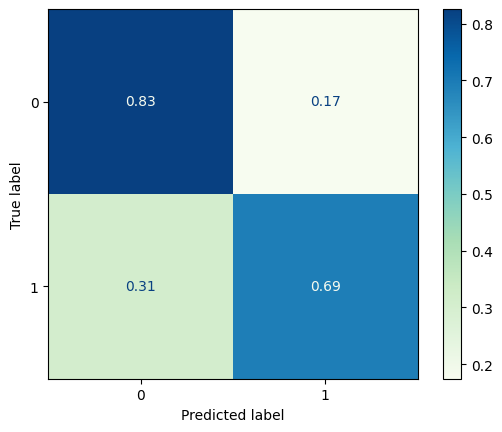

In [ ]:
cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['order_delay'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.609766
         Iterations 7


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                 9287
Model:                          Logit   Df Residuals:                     9285
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:                 0.09808
Time:                        19:28:53   Log-Likelihood:                -5662.9
converged:                       True   LL-Null:                       -6278.7
Covariance Type:            nonrobust   LLR p-value:                7.932e-270
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2183      0.028      7.836      0.000       0.164       0.273
x1            -0.1102      0.004    -27.644      0.000      -0.118      -0.102


## Logistics regresion only actual

In [ ]:
#creating binominal column for satistied/unsatisfied which will be used in the logistics regressions
stats_for_delay['satisfied']=0
stats_for_delay.loc[stats_for_delay['review_score']>=4,'satisfied']=1
stats_for_delay.head()

,total_time_from_approval_to_delivery,total_delivery,review_score,order_delay,order_approval_time,to_carrier_delivery_time,carrier_customer_delivery_time,satisfied
order_id,,,,,,,,
000e906b789b55f64edcb1f84030f90d,17.0,17.0,3.0,2.0,0.0,1.0,16.0,0
0017afd5076e074a48f1f1a4c7bac9c5,46.0,46.0,1.0,4.0,0.0,10.0,35.0,0
001c85b5f68d2be0cb0797afc9e8ce9a,27.0,27.0,2.0,8.0,0.0,2.0,25.0,0
001d8f0e34a38c37f7dba2a37d4eba8b,11.0,11.0,1.0,2.0,0.0,9.0,1.0,0
0030d783f979fbc5981e75613b057344,42.0,42.0,1.0,22.0,0.0,20.0,21.0,0


<Axes: xlabel='order_delay_log', ylabel='Probability'>

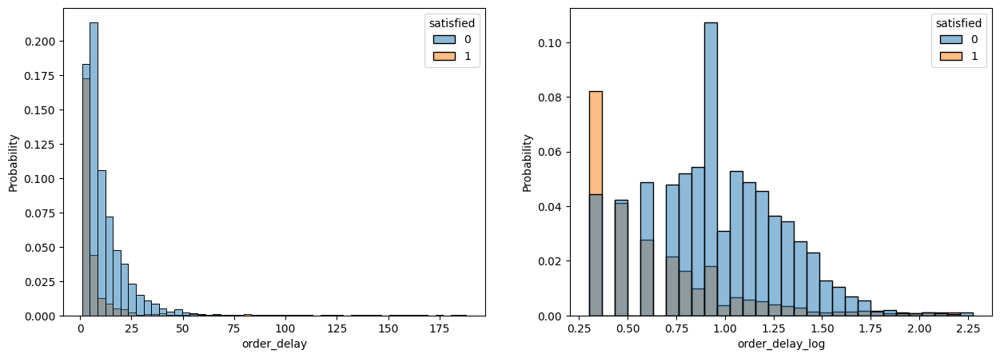

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_for_delay,
             x='order_delay',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_for_delay['order_delay_log'] = np.log10(stats_for_delay['order_delay']+1)

sns.histplot(data=stats_for_delay,
             x='order_delay_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_for_delay['order_delay_log'].isna()

X = stats_for_delay.loc[no_nans_mask]['order_delay'].values.reshape(-1, 1)
y = stats_for_delay.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [-0.70187069]
Coefficients logistics regression: [[-0.03733108]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='order_delay', ylabel='satisfied'>

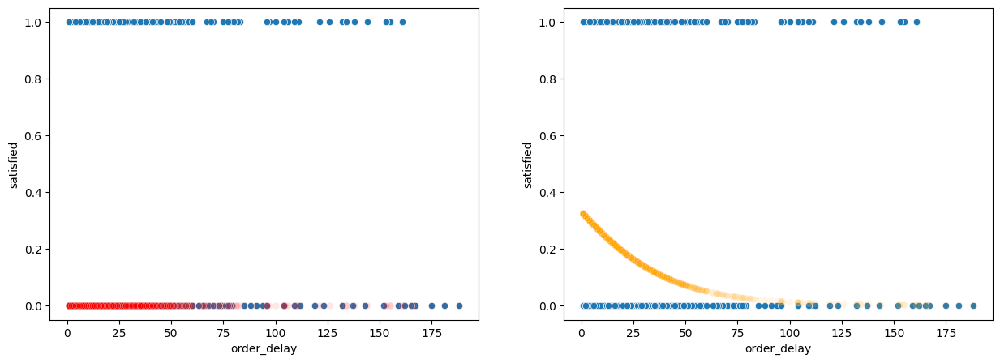

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_for_delay.loc[no_nans_mask],
                x='order_delay',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_for_delay.loc[no_nans_mask],
                x='order_delay',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_for_delay.loc[no_nans_mask],
                x='order_delay',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_for_delay.loc[no_nans_mask],
                x='order_delay',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats_for_delay.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7390172968008571

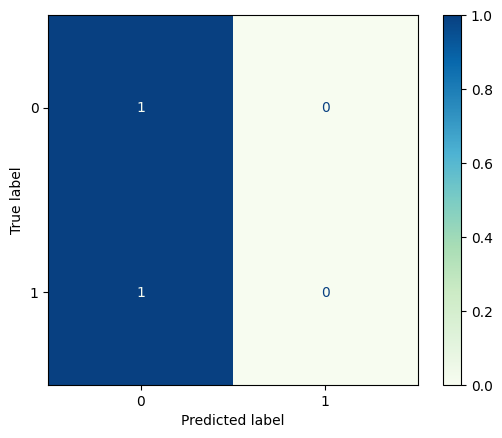

In [ ]:
cm = confusion_matrix(stats_for_delay.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_for_delay.loc[no_nans_mask]['order_delay'].values.reshape(-1, 1)
y = stats_for_delay.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.562231
         Iterations 6


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                 6533
Model:                          Logit   Df Residuals:                     6531
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:                 0.02064
Time:                        19:30:09   Log-Likelihood:                -3673.1
converged:                       True   LL-Null:                       -3750.5
Covariance Type:            nonrobust   LLR p-value:                 1.512e-35
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7019      0.040    -17.381      0.000      -0.781      -0.623
x1            -0.0373      0.004    -10.427      0.000      -0.044      -0.030


# Order size

## Analysing by grouping and binning

In [ ]:
#there is a connection between the order size and the review score based on the different groupings made
#creating dataframe that is only with items which are with more than 1 item
df_more_items=df_no_duplicate_reviews_merged.loc[(df_no_duplicate_reviews_merged['order_size']>1)]
df_more_items

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,order_purchase_timestamp_min,order_purchase_timestamp_max,seller_total_score,seller_cat_type,product_category_name_english_clean,product_photos_qty_2,product_description_lenght_2,product_category_total_score,product_cat_type,_merge
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,2016-09-15 12:16:38,2016-09-15 12:16:38,2.266667,B. Standard,health_beauty,1.0,1036.0,3.828250,D. Premium,both
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,2016-09-15 12:16:38,2016-09-15 12:16:38,2.266667,B. Standard,health_beauty,1.0,1036.0,3.828250,D. Premium,both
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,2016-09-15 12:16:38,2016-09-15 12:16:38,2.266667,B. Standard,health_beauty,1.0,1036.0,3.828250,D. Premium,both
17,51725d3e4bdfc97e28b40543310da8a3,a0f95ab56c6d3a5ba0036b7fdfeda07f,delivered,2016-10-04 15:02:53,2016-10-05 17:06:51,2016-10-09 17:06:52,2016-10-26 13:21:41,2016-11-28 00:00:00,1.0,79938780eb7ffb7289f59a9a283bc06b,...,2016-10-04 15:02:53,2016-10-04 15:02:53,2.266667,B. Standard,health_beauty,1.0,1739.0,3.828250,D. Premium,both
18,51725d3e4bdfc97e28b40543310da8a3,a0f95ab56c6d3a5ba0036b7fdfeda07f,delivered,2016-10-04 15:02:53,2016-10-05 17:06:51,2016-10-09 17:06:52,2016-10-26 13:21:41,2016-11-28 00:00:00,2.0,8f1e43e0e3374ed8c84df748034d6179,...,2016-10-04 15:02:53,2016-10-04 15:02:53,2.266667,B. Standard,health_beauty,1.0,2710.0,3.828250,D. Premium,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112774,9bdf94af058f959fbc09c3ea1eb32465,64ece241ae357ffb4989f7970a6f6adf,delivered,2018-04-19 11:17:55,2018-04-19 11:49:24,2018-04-20 21:56:46,2018-04-21 13:19:13,2018-05-08 00:00:00,1.0,be0e6c61c2bcdd9a4d022ba67fd66189,...,2018-04-19 11:17:55,2018-04-19 11:17:55,3.366667,C. Above Standard,flowers,2.0,186.0,1.683871,A. Basic,both
112778,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,delivered,2018-06-11 10:16:35,2018-06-12 08:41:58,2018-06-14 12:39:00,2018-06-18 18:37:45,2018-07-05 00:00:00,2.0,065554bfe0244b9f5f6414f332106a21,...,2018-06-11 10:16:35,2018-06-11 10:16:35,3.366667,C. Above Standard,flowers,1.0,145.0,1.683871,A. Basic,both
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,delivered,2018-06-11 10:16:35,2018-06-12 08:41:58,2018-06-14 12:39:00,2018-06-18 18:37:45,2018-07-05 00:00:00,1.0,065554bfe0244b9f5f6414f332106a21,...,2018-06-11 10:16:35,2018-06-11 10:16:35,3.366667,C. Above Standard,flowers,1.0,145.0,1.683871,A. Basic,both
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,delivered,2018-01-12 19:43:25,2018-01-12 19:52:28,2018-01-16 22:21:35,2018-01-28 13:16:42,2018-02-07 00:00:00,1.0,065554bfe0244b9f5f6414f332106a21,...,2018-01-12 19:43:25,2018-01-12 19:43:25,3.366667,C. Above Standard,flowers,1.0,145.0,1.683871,A. Basic,both


In [ ]:
#checking if there is connection between order side and delay
df_no_duplicate_reviews_merged.groupby('order_size')['order_delay'].mean()

order_size
1.0    -11.749531
2.0    -12.894872
3.0    -13.281776
4.0    -13.040404
5.0    -14.088083
6.0    -13.863874
7.0    -16.000000
8.0    -11.500000
9.0    -16.333333
10.0   -16.000000
11.0   -11.500000
12.0   -10.000000
13.0    -3.000000
14.0    -8.500000
15.0   -13.500000
20.0   -11.000000
21.0     3.000000
Name: order_delay, dtype: float64

In [ ]:
#analysing by checking what is the review score per order size
df_no_duplicate_reviews_merged.groupby('order_size')['review_score'].agg(['mean','count'])

,mean,count
order_size,,
1.0,4.160111,88195
2.0,3.654162,14874
3.0,3.510000,3900
4.0,3.346076,1988
5.0,3.372549,1020
6.0,3.307292,1152
7.0,2.909091,154
8.0,4.000000,64
9.0,3.000000,27


In [ ]:
df_no_duplicate_reviews_merged.groupby('order_size')['total_delivery'].mean()

order_size
1.0     12.174048
2.0     11.362603
3.0     11.158499
4.0     11.777778
5.0     11.580311
6.0     11.418848
7.0     11.181818
8.0     13.125000
9.0      8.666667
10.0     9.625000
11.0    17.750000
12.0    10.400000
13.0    11.000000
14.0    11.000000
15.0    16.500000
20.0    10.000000
21.0    14.000000
Name: total_delivery, dtype: float64

In [ ]:
#which are the most common words used in the review messages
words=df_more_items['review_comment_message'].str.split().explode().value_counts()
words

review_comment_message
e               5606
o               4452
de              4074
a               3533
que             2718
                ... 
minúsculas         2
bolça              2
microfribra        2
conseguindo.       2
dias.Mesmo         2
Name: count, Length: 10078, dtype: int64

In [ ]:
#searching how many comments contain ceratin words as "only,no,1,2,just,yet,wating,missing"
df_more_items['Words_count']=df_more_items['review_comment_message'].astype(str).str.contains('só|so|Só|somente|um|uma|não|Não|nao|1|2|apenas|ainda|faltando|aguardando')==True
df_more_items

<ipython-input-204-69301b82957c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_more_items['Words_count']=df_more_items['review_comment_message'].astype(str).str.contains('só|so|Só|somente|um|uma|não|Não|nao|1|2|apenas|ainda|faltando|aguardando')==True


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,order_purchase_timestamp_max,seller_total_score,seller_cat_type,product_category_name_english_clean,product_photos_qty_2,product_description_lenght_2,product_category_total_score,product_cat_type,_merge,Words_count
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,1.0,5a6b04657a4c5ee34285d1e4619a96b4,...,2016-09-15 12:16:38,2.266667,B. Standard,health_beauty,1.0,1036.0,3.828250,D. Premium,both,True
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,2.0,5a6b04657a4c5ee34285d1e4619a96b4,...,2016-09-15 12:16:38,2.266667,B. Standard,health_beauty,1.0,1036.0,3.828250,D. Premium,both,True
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,delivered,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-11-07 17:11:53,2016-11-09 07:47:38,2016-10-04 00:00:00,3.0,5a6b04657a4c5ee34285d1e4619a96b4,...,2016-09-15 12:16:38,2.266667,B. Standard,health_beauty,1.0,1036.0,3.828250,D. Premium,both,True
17,51725d3e4bdfc97e28b40543310da8a3,a0f95ab56c6d3a5ba0036b7fdfeda07f,delivered,2016-10-04 15:02:53,2016-10-05 17:06:51,2016-10-09 17:06:52,2016-10-26 13:21:41,2016-11-28 00:00:00,1.0,79938780eb7ffb7289f59a9a283bc06b,...,2016-10-04 15:02:53,2.266667,B. Standard,health_beauty,1.0,1739.0,3.828250,D. Premium,both,True
18,51725d3e4bdfc97e28b40543310da8a3,a0f95ab56c6d3a5ba0036b7fdfeda07f,delivered,2016-10-04 15:02:53,2016-10-05 17:06:51,2016-10-09 17:06:52,2016-10-26 13:21:41,2016-11-28 00:00:00,2.0,8f1e43e0e3374ed8c84df748034d6179,...,2016-10-04 15:02:53,2.266667,B. Standard,health_beauty,1.0,2710.0,3.828250,D. Premium,both,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112774,9bdf94af058f959fbc09c3ea1eb32465,64ece241ae357ffb4989f7970a6f6adf,delivered,2018-04-19 11:17:55,2018-04-19 11:49:24,2018-04-20 21:56:46,2018-04-21 13:19:13,2018-05-08 00:00:00,1.0,be0e6c61c2bcdd9a4d022ba67fd66189,...,2018-04-19 11:17:55,3.366667,C. Above Standard,flowers,2.0,186.0,1.683871,A. Basic,both,True
112778,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,delivered,2018-06-11 10:16:35,2018-06-12 08:41:58,2018-06-14 12:39:00,2018-06-18 18:37:45,2018-07-05 00:00:00,2.0,065554bfe0244b9f5f6414f332106a21,...,2018-06-11 10:16:35,3.366667,C. Above Standard,flowers,1.0,145.0,1.683871,A. Basic,both,False
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,delivered,2018-06-11 10:16:35,2018-06-12 08:41:58,2018-06-14 12:39:00,2018-06-18 18:37:45,2018-07-05 00:00:00,1.0,065554bfe0244b9f5f6414f332106a21,...,2018-06-11 10:16:35,3.366667,C. Above Standard,flowers,1.0,145.0,1.683871,A. Basic,both,False
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,delivered,2018-01-12 19:43:25,2018-01-12 19:52:28,2018-01-16 22:21:35,2018-01-28 13:16:42,2018-02-07 00:00:00,1.0,065554bfe0244b9f5f6414f332106a21,...,2018-01-12 19:43:25,3.366667,C. Above Standard,flowers,1.0,145.0,1.683871,A. Basic,both,False


In [ ]:
#calculating how many comments contain the words selected above
df_more_items.groupby('Words_count').size()

Words_count
False    16500
True      7281
dtype: int64

In [ ]:
#how many of the falses are actually n/a
df_more_items['review_comment_message'].isnull().sum()

11714

## Linear regression

In [ ]:
stats_size_order=stats.groupby('review_score')['order_size'].agg(['mean','count','median','std','min','max']).reset_index()
stats_size_order

,review_score,mean,count,median,std,min,max
0,1.0,1.306732,10814,1.0,0.841206,1.0,21.0
1,2.0,1.252282,3068,1.0,0.664124,1.0,7.0
2,3.0,1.160312,8078,1.0,0.569476,1.0,13.0
3,4.0,1.114935,19002,1.0,0.479844,1.0,12.0
4,5.0,1.109241,56920,1.0,0.449270,1.0,15.0


Text(0.5, 0, 'Size of the order')

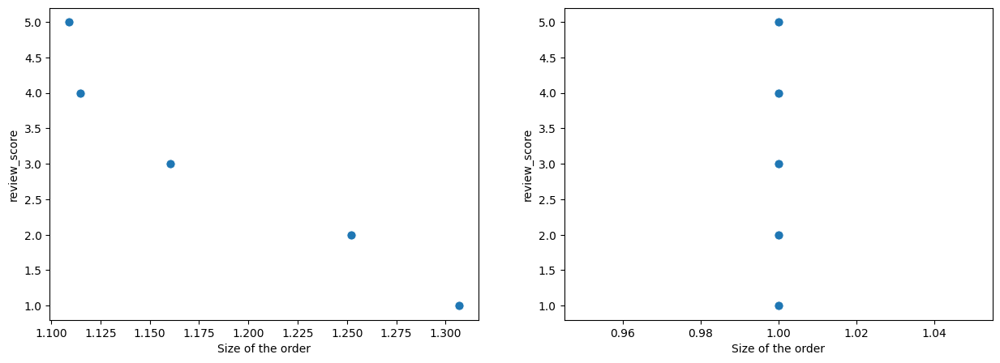

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_size_order, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Size of the order")

sns.scatterplot(data=stats_size_order, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Size of the order")

<Axes: xlabel='Mean order size', ylabel='review_score'>

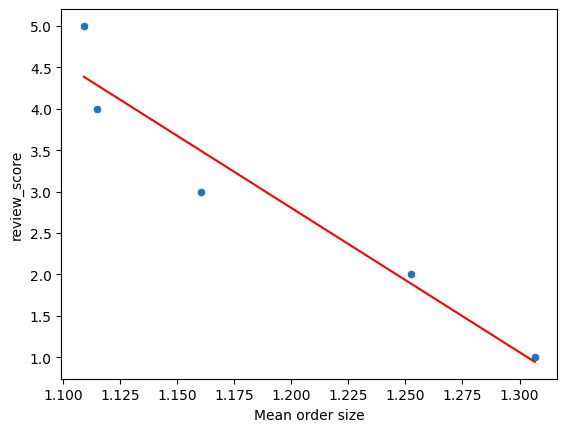

In [ ]:
# independent variable
X = stats_size_order['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_size_order['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_size_order, x='mean', y='review_score')
plt.xlabel("Mean order size")

sns.lineplot(data=stats_size_order,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_size_order['mean'].values.reshape(-1, 1)
y = stats_size_order['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.928
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     38.68
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00838
Time:                        19:36:48   Log-Likelihood:                -2.2489
No. Observations:                   5   AIC:                             8.498
Df Residuals:                       3   BIC:                             7.717
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         23.7231      3.339      7.105      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regresion

<Axes: xlabel='order_size_log', ylabel='Probability'>

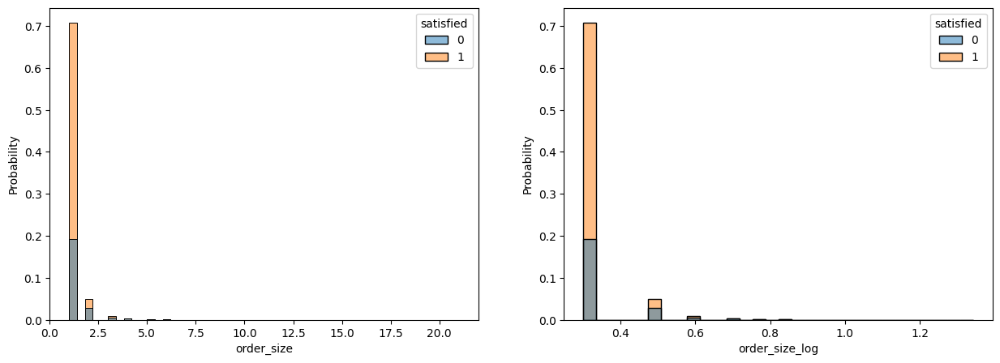

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='order_size',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['order_size_log'] = np.log10(stats['order_size']+1)

sns.histplot(data=stats,
             x='order_size_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['order_size_log'].isna()

X = stats.loc[no_nans_mask]['order_size'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

Intercept logistics regression: [1.67885662]
Coefficients logistics regression: [[-0.40556502]]


True

<Axes: xlabel='order_size', ylabel='satisfied'>

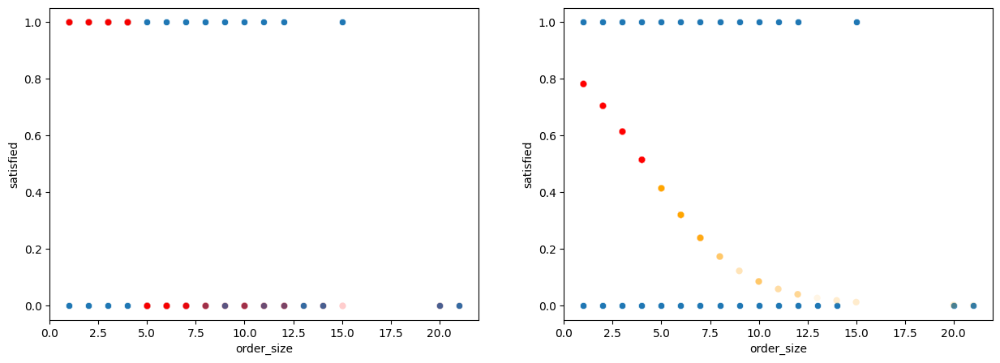

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_size',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_size',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_size',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='order_size',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

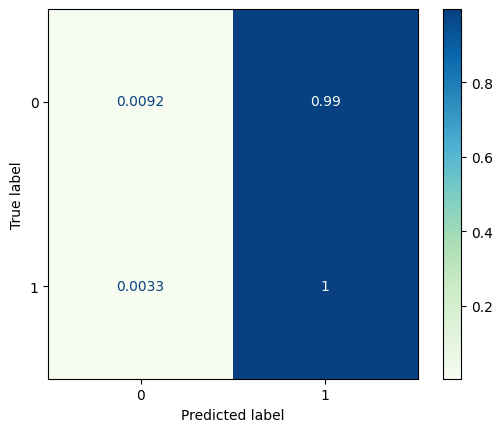

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['order_size'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.534679
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                98631
Model:                          Logit   Df Residuals:                    98629
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:                0.009063
Time:                        19:37:09   Log-Likelihood:                -52736.
converged:                       True   LL-Null:                       -53218.
Covariance Type:            nonrobust   LLR p-value:                8.946e-212
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6789      0.017     96.373      0.000       1.645       1.713
x1            -0.4056      0.

# Product weight

## Analysing by grouping and binning

In [ ]:
product_weight=df_no_duplicate_reviews_merged.groupby('review_score')['product_weight_g'].agg(['mean','count','median','std','min','max']).reset_index()
product_weight

,review_score,mean,count,median,std,min,max
0,1.0,2301.244917,14213,710.0,4181.293124,0.0,40425.0
1,2.0,2271.033929,3861,700.0,3956.338642,0.0,30000.0
2,3.0,2192.678948,9391,700.0,3910.498253,0.0,30000.0
3,4.0,2123.718572,21199,700.0,3719.941263,0.0,30000.0
4,5.0,2002.944011,63173,650.0,3611.885363,0.0,40425.0


In [ ]:
#if product weight is above 7kg, score starts falling below 4 (9% of the population is above 7kg). There might be linkage to delivery time.
#product_weight=df.groupby('product_weight_g')[['review_score']].agg(['mean','count'])
product_weight=df_no_duplicate_reviews_merged.groupby(pd.cut(df_no_duplicate_reviews_merged['product_weight_g'], np.arange(0,30000, 1000))).agg({'review_score':'mean','review_id':'count'})
product_weight

,review_score,review_id
product_weight_g,,
"(0, 1000]",4.050449,67435
"(1000, 2000]",4.021960,19126
"(2000, 3000]",4.045981,6481
"(3000, 4000]",4.034434,2817
"(4000, 5000]",4.082049,2011
"(5000, 6000]",4.046647,2058
"(6000, 7000]",4.112583,2416
"(7000, 8000]",3.965828,1551
"(8000, 9000]",3.935703,1322


<Axes: xlabel='product_weight_g', ylabel='Density'>

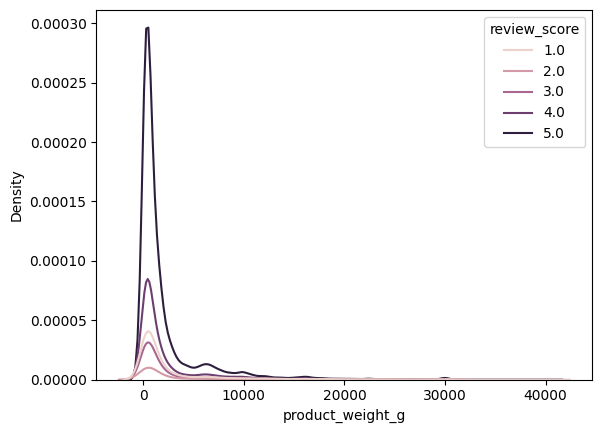

In [ ]:
#creating KDE plot
stats['product_weight_g'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='product_weight_g', hue='review_score')

In [ ]:
#creating dataframe which will be used for regressions based on the product
stats_product=df_no_duplicate_reviews_merged.groupby('product_id')[['product_weight_g','product_length_cm','review_score','product_width_cm','product_description_lenght_2','product_photos_qty_2']].mean()
stats_product

,product_weight_g,product_length_cm,review_score,product_width_cm,product_description_lenght_2,product_photos_qty_2
product_id,,,,,,
00066f42aeeb9f3007548bb9d3f33c38,300.0,20.0,5.0,16.0,596.0,6.0
00088930e925c41fd95ebfe695fd2655,1225.0,55.0,4.0,26.0,752.0,4.0
0009406fd7479715e4bef61dd91f2462,300.0,45.0,1.0,35.0,266.0,2.0
000b8f95fcb9e0096488278317764d19,550.0,19.0,5.0,12.0,364.0,3.0
000d9be29b5207b54e86aa1b1ac54872,250.0,22.0,5.0,15.0,613.0,4.0
...,...,...,...,...,...,...
fff6177642830a9a94a0f2cba5e476d1,1400.0,42.0,4.5,15.0,842.0,1.0
fff81cc3158d2725c0655ab9ba0f712c,58.0,16.0,4.0,11.0,643.0,1.0
fff9553ac224cec9d15d49f5a263411f,150.0,16.0,5.0,11.0,328.0,3.0


In [ ]:
stats_product['satisfied']=0
stats_product.loc[stats_product['review_score']>=4,'satisfied']=1
stats_product.head()

,product_weight_g,product_length_cm,review_score,product_width_cm,product_description_lenght_2,product_photos_qty_2,satisfied
product_id,,,,,,,
00066f42aeeb9f3007548bb9d3f33c38,300.0,20.0,5.0,16.0,596.0,6.0,1
00088930e925c41fd95ebfe695fd2655,1225.0,55.0,4.0,26.0,752.0,4.0,1
0009406fd7479715e4bef61dd91f2462,300.0,45.0,1.0,35.0,266.0,2.0,0
000b8f95fcb9e0096488278317764d19,550.0,19.0,5.0,12.0,364.0,3.0,1
000d9be29b5207b54e86aa1b1ac54872,250.0,22.0,5.0,15.0,613.0,4.0,1


## Analysing based on product_id

### Linear regression

In [ ]:
stats_product_weight=stats_product.groupby('review_score')['product_weight_g'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_weight

,review_score,mean,count,median,std,min,max
0,1.000000,2795.029292,2697,800.0,5193.204927,50.0,30000.0
1,1.117647,200.000000,1,200.0,NaN,200.0,200.0
2,1.166667,1300.000000,1,1300.0,NaN,1300.0,1300.0
3,1.181818,3000.000000,1,3000.0,NaN,3000.0,3000.0
4,1.200000,1675.000000,2,1675.0,813.172798,1100.0,2250.0
...,...,...,...,...,...,...,...
633,4.916667,1750.000000,2,1750.0,2192.031022,200.0,3300.0
634,4.923077,2013.000000,3,563.0,2876.563749,150.0,5326.0
635,4.937500,540.000000,1,540.0,NaN,540.0,540.0
636,4.958333,1200.000000,1,1200.0,NaN,1200.0,1200.0


Text(0.5, 0, 'Mean product weight')

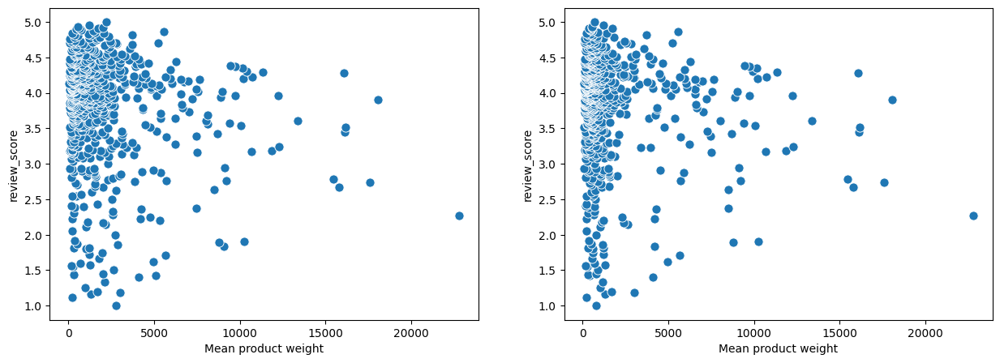

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_weight, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean product weight")

sns.scatterplot(data=stats_product_weight, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Mean product weight")

<Axes: xlabel='Mean product weight', ylabel='review_score'>

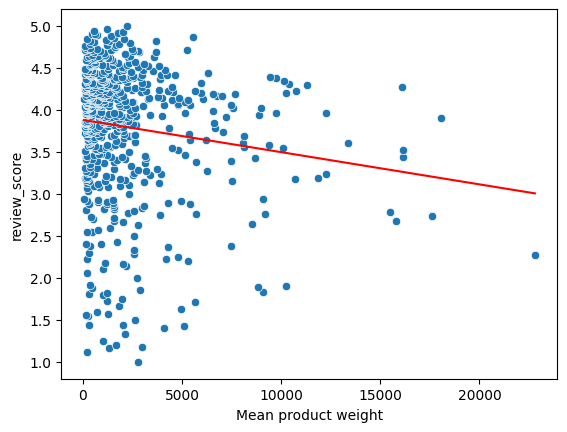

In [ ]:
# independent variable
X = stats_product_weight['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_weight['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_product_weight, x='mean', y='review_score')
plt.xlabel("Mean product weight")

sns.lineplot(data=stats_product_weight,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_weight['mean'].values.reshape(-1, 1)
y = stats_product_weight['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     13.26
Date:                Sun, 07 Jul 2024   Prob (F-statistic):           0.000293
Time:                        19:38:55   Log-Likelihood:                -734.40
No. Observations:                 638   AIC:                             1473.
Df Residuals:                     636   BIC:                             1482.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8806      0.038    102.446      0.0

### Logistics regression

<Axes: xlabel='product_weight_g_log', ylabel='Probability'>

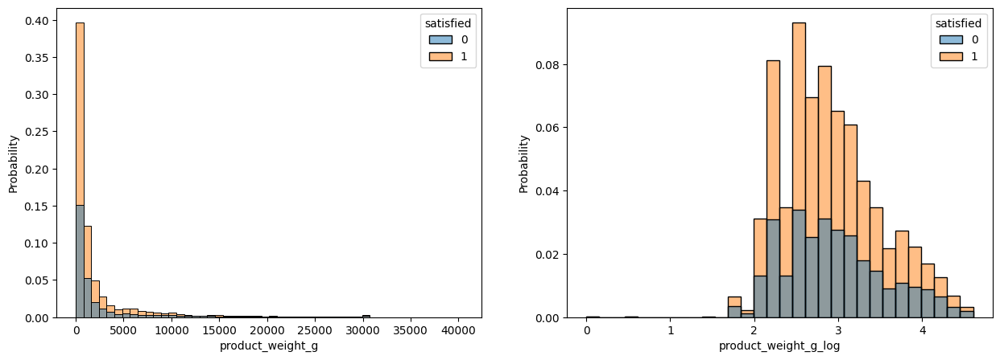

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_product,
             x='product_weight_g',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_product['product_weight_g_log'] = np.log10(stats_product['product_weight_g']+1)

sns.histplot(data=stats_product,
             x='product_weight_g_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_product['product_weight_g_log'].isna()

X = stats_product.loc[no_nans_mask]['product_weight_g'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [0.93959719]
Coefficients logistics regression: [[-1.45152242e-05]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='product_weight_g', ylabel='satisfied'>

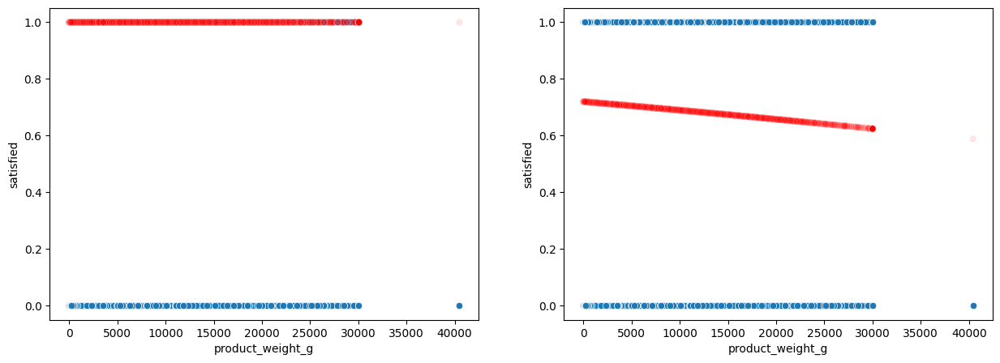

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_weight_g',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_weight_g',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_weight_g',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_weight_g',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats_product.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.712134551747169

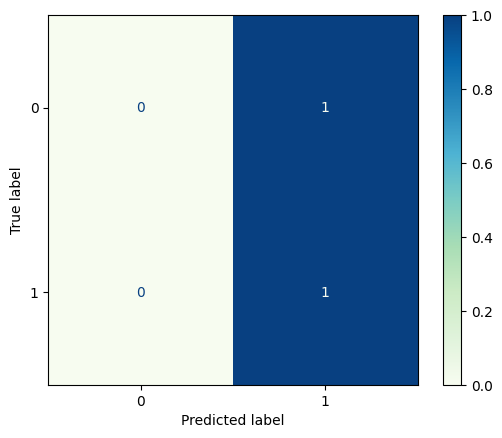

In [ ]:
cm = confusion_matrix(stats_product.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_product.loc[no_nans_mask]['product_weight_g'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.599810
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                32939
Model:                          Logit   Df Residuals:                    32937
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0006981
Time:                        19:39:20   Log-Likelihood:                -19757.
converged:                       True   LL-Null:                       -19771.
Covariance Type:            nonrobust   LLR p-value:                 1.490e-07
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9396      0.014     68.084      0.000       0.913       0.967
x1         -1.452e-05   2.73e-06     -5.317      0.000   -1.99e-05   -9.17e-06


## Analysing based on order_id

### Linear regression

In [ ]:
#regressions based on the order id
stats_product_weight_2=stats.groupby('review_score')['product_weight_g'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_weight_2

,review_score,mean,count,median,std,min,max
0,1.0,2345.359764,10896,700.0,4243.028461,0.0,40425.0
1,2.0,2298.100258,3087,700.0,4040.211266,0.0,30000.0
2,3.0,2173.273868,8096,700.0,3879.563597,0.0,30000.0
3,4.0,2119.819023,19015,700.0,3719.284114,0.0,30000.0
4,5.0,2019.826453,56955,650.0,3623.411630,0.0,40425.0


Text(0.5, 0, 'Median order weight')

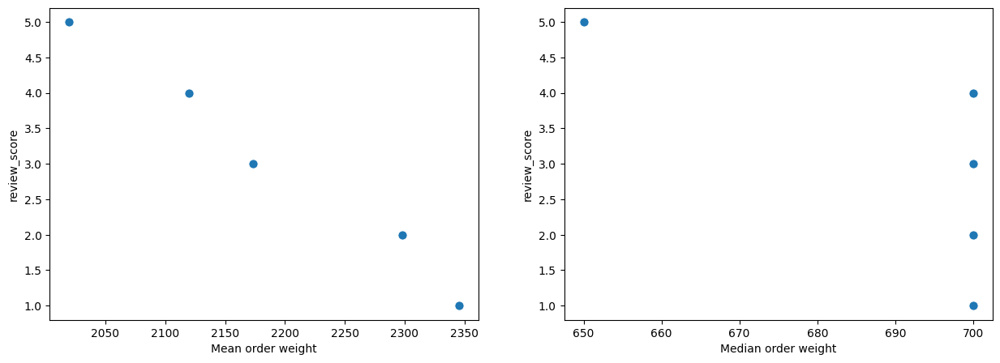

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_weight_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean order weight")

sns.scatterplot(data=stats_product_weight_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median order weight")

In [ ]:
# independent variable
X = stats_product_weight_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_weight_2['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean order weight', ylabel='review_score'>

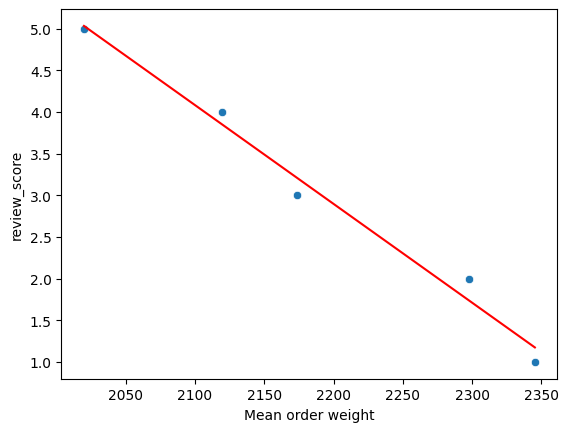

In [ ]:
sns.scatterplot(data=stats_product_weight_2, x='mean', y='review_score')
plt.xlabel("Mean order weight")

sns.lineplot(data=stats_product_weight_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_weight_2['mean'].values.reshape(-1, 1)
y = stats_product_weight_2['review_score']

In [ ]:
X_with_constant = sm.add_constant(X)

In [ ]:
reg_sm = sm.OLS(y, X_with_constant).fit()

In [ ]:
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     172.4
Date:                Sun, 07 Jul 2024   Prob (F-statistic):           0.000954
Time:                        19:40:21   Log-Likelihood:                 1.3443
No. Observations:                   5   AIC:                             1.311
Df Residuals:                       3   BIC:                            0.5303
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         28.9699      1.980     14.628      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


### Logistics regression

<Axes: xlabel='product_weight_g_log', ylabel='Probability'>

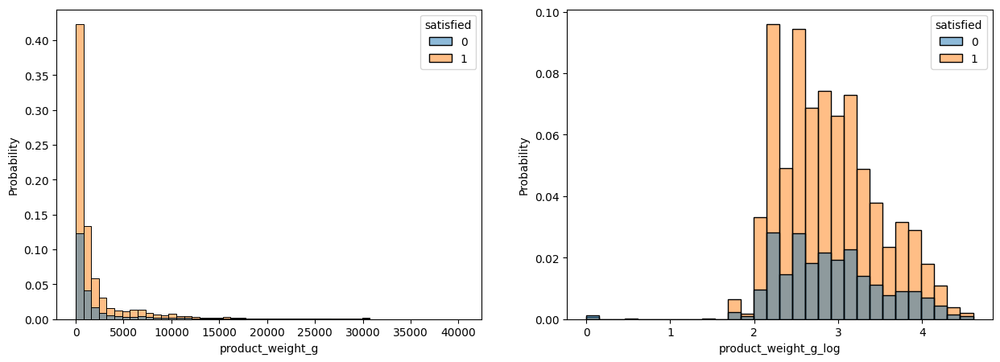

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='product_weight_g',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['product_weight_g_log'] = np.log10(stats['product_weight_g']+1)

sns.histplot(data=stats,
             x='product_weight_g_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['product_weight_g_log'].isna()

X = stats.loc[no_nans_mask]['product_weight_g'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

In [ ]:
print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [1.23621217]
Coefficients logistics regression: [[-1.57918352e-05]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

In [ ]:
satisfied_probability_predicted

array([[0.2268915 , 0.7731085 ],
       [0.31811304, 0.68188696],
       [0.2336084 , 0.7663916 ],
       ...,
       [0.22777081, 0.77222919],
       [0.22537157, 0.77462843],
       [0.22675303, 0.77324697]])

In [ ]:
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

In [ ]:
probs_1

array([0.7731085 , 0.68188696, 0.7663916 , ..., 0.77222919, 0.77462843,
       0.77324697])

In [ ]:
satisfied_predicted = logistics_reg.predict(X)

In [ ]:
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='product_weight_g', ylabel='satisfied'>

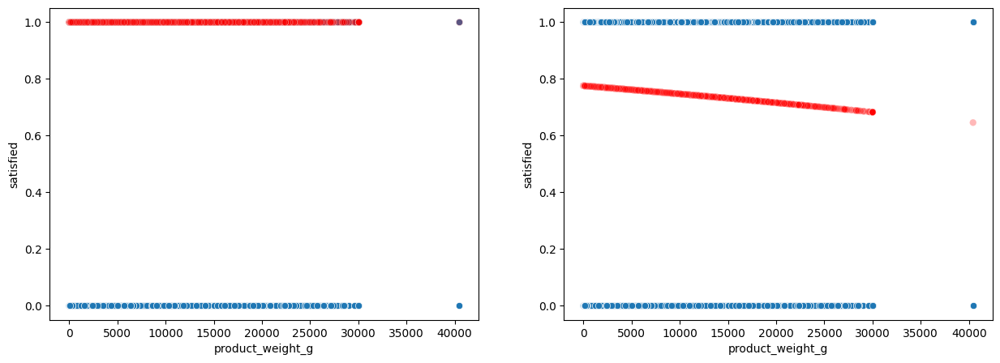

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='product_weight_g',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='product_weight_g',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='product_weight_g',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='product_weight_g',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7689037782253575

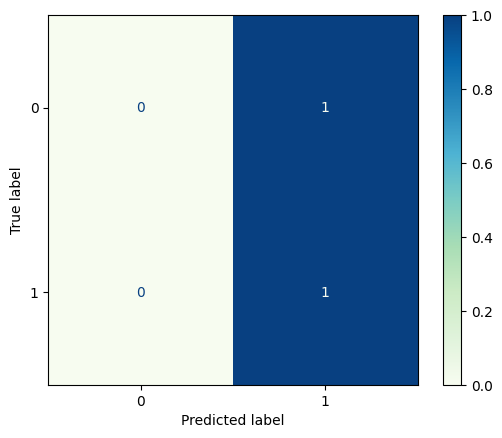

In [ ]:
cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['product_weight_g'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.540262
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                98803
Model:                          Logit   Df Residuals:                    98801
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0006204
Time:                        19:42:27   Log-Likelihood:                -53380.
converged:                       True   LL-Null:                       -53413.
Covariance Type:            nonrobust   LLR p-value:                 3.920e-16
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2362      0.009    142.850      0.000       1.219       1.253
x1         -1.579e-05   1.91e-06     -8.273      0.000   -1.95e-05   -1.21e-05


# Product length

## Analysing by grouping and binning

## Analysing based on product_id

In [ ]:
#analysing based on product length vs review
#not clear connection between the product length and the review score
df_no_duplicate_reviews_merged.groupby('review_score')[['product_length_cm']].describe()

product_length_cm                                                \
                         count       mean        std   min   25%   50%   75%   
review_score                                                                   
1.0                    14129.0  30.530469  16.757039   7.0  18.0  25.0  38.0   
2.0                     3841.0  30.943765  16.430566  11.0  18.0  26.0  40.0   
3.0                     9373.0  30.798144  16.743789   8.0  18.0  25.0  40.0   
4.0                    21185.0  30.449280  16.383676   7.0  18.0  25.0  39.0   
5.0                    63124.0  29.808345  15.799045   7.0  18.0  25.0  37.0   

                     
                max  
review_score         
1.0           105.0  
2.0           105.0  
3.0           105.0  
4.0           105.0  
5.0           105.0

In [ ]:
#analysing by creating bins
product_length=df_no_duplicate_reviews_merged.groupby(pd.cut(df_no_duplicate_reviews_merged['product_length_cm'], np.arange(0,150, 10))).agg({'review_score':'mean','review_id':'count'})
product_length

,review_score,review_id
product_length_cm,,
"(0, 10]",3.630435,46
"(10, 20]",4.037112,44649
"(20, 30]",4.076564,28251
"(30, 40]",4.007294,16451
"(40, 50]",4.038761,11042
"(50, 60]",3.917074,5318
"(60, 70]",4.010460,3155
"(70, 80]",3.947141,927
"(80, 90]",3.914050,605


<Axes: xlabel='product_length_cm', ylabel='Density'>

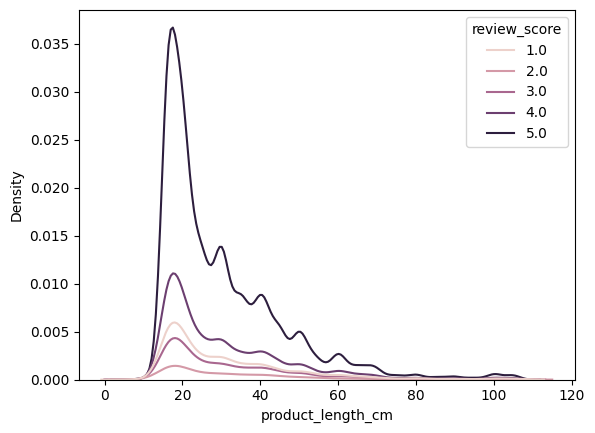

In [ ]:
#creating KDE plot
stats['product_length_cm'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='product_length_cm', hue='review_score')

### Linear regression

In [ ]:
stats_product_length=stats_product.groupby('review_score')['product_length_cm'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_length

,review_score,mean,count,median,std,min,max
0,1.000000,32.410827,2697,26.0,18.458157,12.0,105.0
1,1.117647,16.000000,1,16.0,NaN,16.0,16.0
2,1.166667,17.000000,1,17.0,NaN,17.0,17.0
3,1.181818,35.000000,1,35.0,NaN,35.0,35.0
4,1.200000,43.500000,2,43.5,2.121320,42.0,45.0
...,...,...,...,...,...,...,...
633,4.916667,47.000000,2,47.0,43.840620,16.0,78.0
634,4.923077,35.666667,3,20.0,30.664855,16.0,71.0
635,4.937500,23.000000,1,23.0,NaN,23.0,23.0
636,4.958333,40.000000,1,40.0,NaN,40.0,40.0


Text(0.5, 0, 'Median product length')

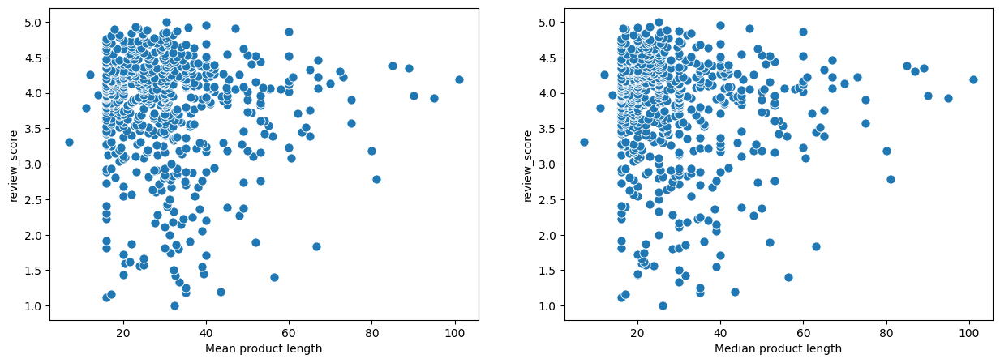

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_length, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean product length")

sns.scatterplot(data=stats_product_length, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median product length")

<Axes: xlabel='Mean product length', ylabel='review_score'>

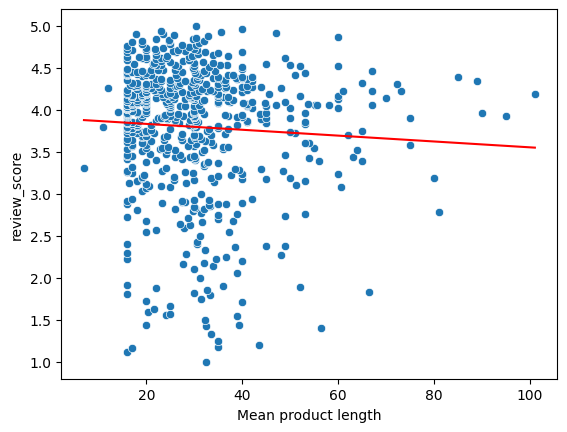

In [ ]:
# independent variable
X = stats_product_length['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_length['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_product_length, x='mean', y='review_score')
plt.xlabel("Mean product length")

sns.lineplot(data=stats_product_length,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_length['mean'].values.reshape(-1, 1)
y = stats_product_length['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     2.326
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.128
Time:                        19:43:43   Log-Likelihood:                -739.82
No. Observations:                 638   AIC:                             1484.
Df Residuals:                     636   BIC:                             1493.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.9033      0.076     51.658      0.0

### Logistics regression

<Axes: xlabel='product_length_cm', ylabel='Probability'>

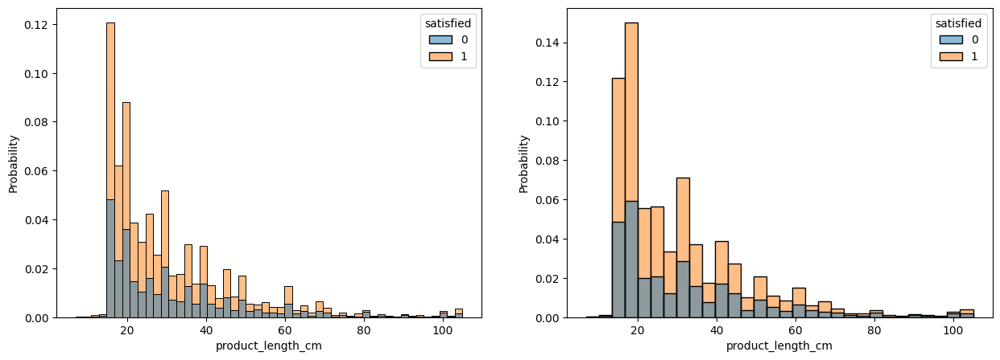

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_product,
             x='product_length_cm',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_product['product_length_cm_log'] = np.log10(stats_product['product_length_cm']+1)

sns.histplot(data=stats_product,
             x='product_length_cm',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_product['product_length_cm_log'].isna()

X = stats_product.loc[no_nans_mask]['product_length_cm'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [1.01008119]
Coefficients logistics regression: [[-0.00336577]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='product_length_cm', ylabel='satisfied'>

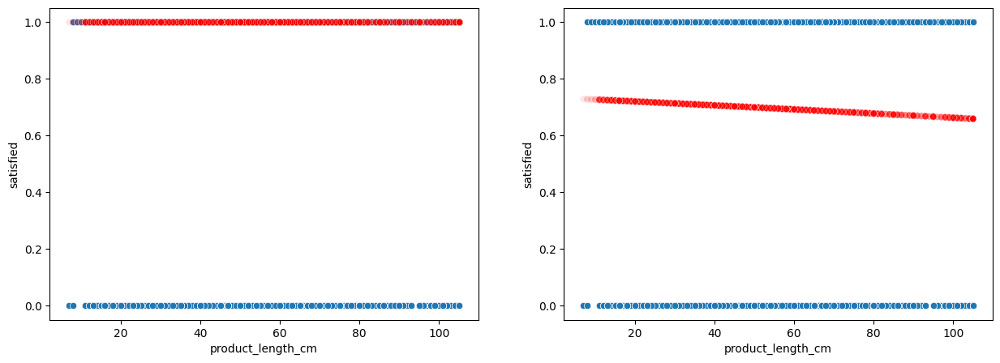

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_length_cm',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_length_cm',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_length_cm',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_length_cm',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats_product.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7121170719859125

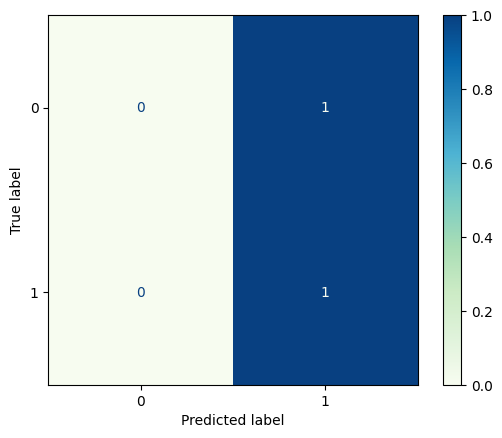

In [ ]:
cm = confusion_matrix(stats_product.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_product.loc[no_nans_mask]['product_length_cm'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.599904
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                32937
Model:                          Logit   Df Residuals:                    32935
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0005682
Time:                        19:44:11   Log-Likelihood:                -19759.
converged:                       True   LL-Null:                       -19770.
Covariance Type:            nonrobust   LLR p-value:                 2.139e-06
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0101      0.025     40.127      0.000       0.961       1.059
x1            -0.0034      0.001     -4.768      0.000      -0.005      -0.002


## Analysing based on order_id

### Linear regression

In [ ]:
#based on order length
stats_product_length_2=stats.groupby('review_score')['product_length_cm'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_length_2

,review_score,mean,count,median,std,min,max
0,1.0,30.542951,10812,25.0,16.735579,7.0,105.0
1,2.0,30.886490,3067,25.0,16.471625,11.0,105.0
2,3.0,30.592474,8078,25.0,16.381268,8.0,105.0
3,4.0,30.381308,19001,25.0,16.341671,7.0,105.0
4,5.0,29.787614,56908,25.0,15.772848,7.0,105.0


Text(0.5, 0, 'Median order length')

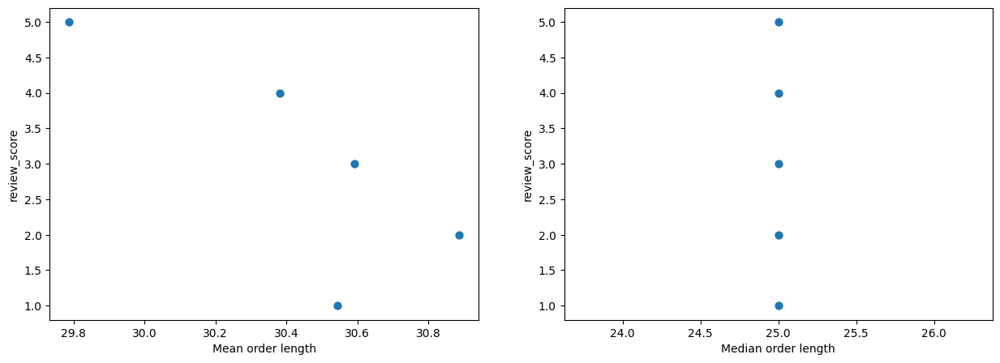

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_length_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean order length")

sns.scatterplot(data=stats_product_length_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median order length")

In [ ]:
# independent variable
X = stats_product_length_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_length_2['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean days approval-delivery', ylabel='review_score'>

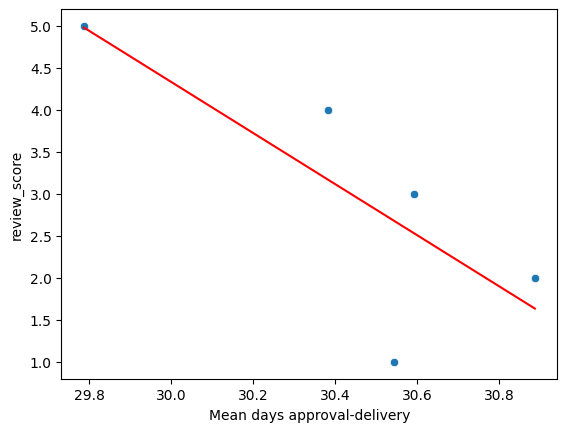

In [ ]:
sns.scatterplot(data=stats_product_length_2, x='mean', y='review_score')
plt.xlabel("Mean days approval-delivery")

sns.lineplot(data=stats_product_length_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_length_2['mean'].values.reshape(-1, 1)
y = stats_product_length_2['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.614
Model:                            OLS   Adj. R-squared:                  0.485
Method:                 Least Squares   F-statistic:                     4.765
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.117
Time:                        21:14:46   Log-Likelihood:                -6.4502
No. Observations:                   5   AIC:                             16.90
Df Residuals:                       3   BIC:                             16.12
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         95.6543     42.451      2.253      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


# Product width

## Analysing by grouping and binning

In [ ]:
#analysing based on product width vs review
#not clear connection between the product width and the review score
df_no_duplicate_reviews_merged.groupby('review_score')[['product_width_cm']].describe()

product_width_cm                                               \
                        count       mean        std  min   25%   50%   75%   
review_score                                                                 
1.0                   14129.0  23.091585  12.082804  8.0  15.0  20.0  30.0   
2.0                    3841.0  23.570945  11.881960  7.0  15.0  20.0  30.0   
3.0                    9373.0  23.374053  11.963107  7.0  15.0  20.0  30.0   
4.0                   21185.0  23.074723  11.692305  7.0  15.0  20.0  30.0   
5.0                   63124.0  22.852006  11.572260  6.0  15.0  20.0  30.0   

                     
                max  
review_score         
1.0           118.0  
2.0           105.0  
3.0           118.0  
4.0           105.0  
5.0           118.0

In [ ]:
#analysing by creating bins
product_width=df_no_duplicate_reviews_merged.groupby(pd.cut(df_no_duplicate_reviews_merged['product_width_cm'], np.arange(5,120, 5))).agg({'review_score':'mean','review_id':'count'})
product_width

,review_score,review_id
product_width_cm,,
"(5, 10]",3.886228,167
"(10, 15]",4.040335,34660
"(15, 20]",4.053655,30342
"(20, 25]",4.037641,10972
"(25, 30]",4.011083,13173
"(30, 35]",4.013856,7578
"(35, 40]",3.997508,7222
"(40, 45]",4.037238,2390
"(45, 50]",4.038983,2360


<Axes: xlabel='product_width_cm', ylabel='Density'>

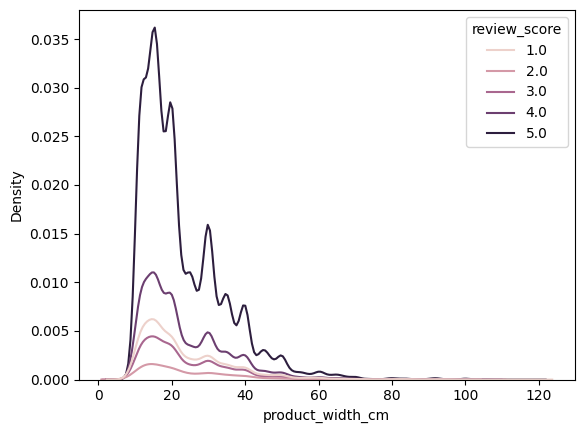

In [ ]:
#creating KDE plot
stats['product_width_cm'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='product_width_cm', hue='review_score')

## Analysing based on product_id

### Linear regression

In [ ]:
stats_product_width=stats_product.groupby('review_score')['product_width_cm'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_width

,review_score,mean,count,median,std,min,max
0,1.000000,24.192807,2697,20.0,12.859947,8.0,98.0
1,1.117647,11.000000,1,11.0,NaN,11.0,11.0
2,1.166667,35.000000,1,35.0,NaN,35.0,35.0
3,1.181818,30.000000,1,30.0,NaN,30.0,30.0
4,1.200000,35.500000,2,35.5,0.707107,35.0,36.0
...,...,...,...,...,...,...,...
633,4.916667,25.000000,2,25.0,18.384776,12.0,38.0
634,4.923077,26.000000,3,14.0,20.784610,14.0,50.0
635,4.937500,19.000000,1,19.0,NaN,19.0,19.0
636,4.958333,30.000000,1,30.0,NaN,30.0,30.0


Text(0.5, 0, 'Median product width')

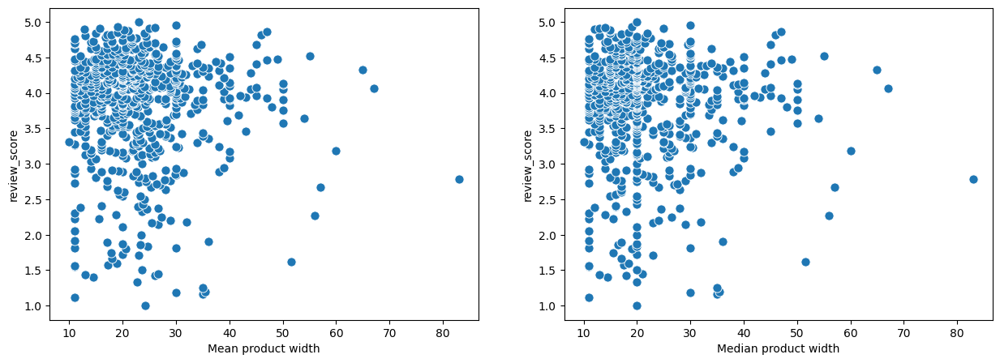

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_width, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean product width")

sns.scatterplot(data=stats_product_width, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median product width")

<Axes: xlabel='Mean product width', ylabel='review_score'>

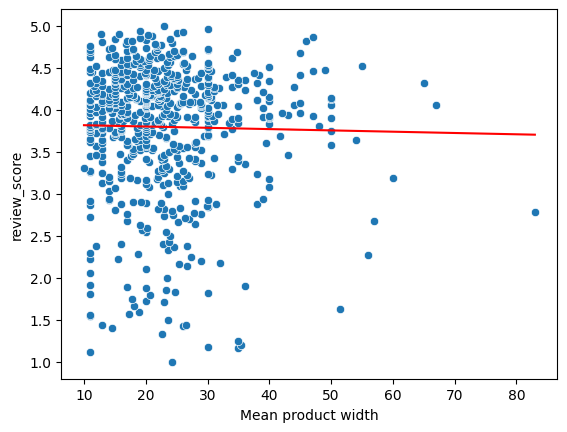

In [ ]:
# independent variable
X = stats_product_width['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_width['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_product_width, x='mean', y='review_score')
plt.xlabel("Mean product width")

sns.lineplot(data=stats_product_width,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_width['mean'].values.reshape(-1, 1)
y = stats_product_width['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.2281
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.633
Time:                        19:45:51   Log-Likelihood:                -740.87
No. Observations:                 638   AIC:                             1486.
Df Residuals:                     636   BIC:                             1495.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8335      0.081     47.616      0.0

### Logistics regression

<Axes: xlabel='product_width_cm_log', ylabel='Probability'>

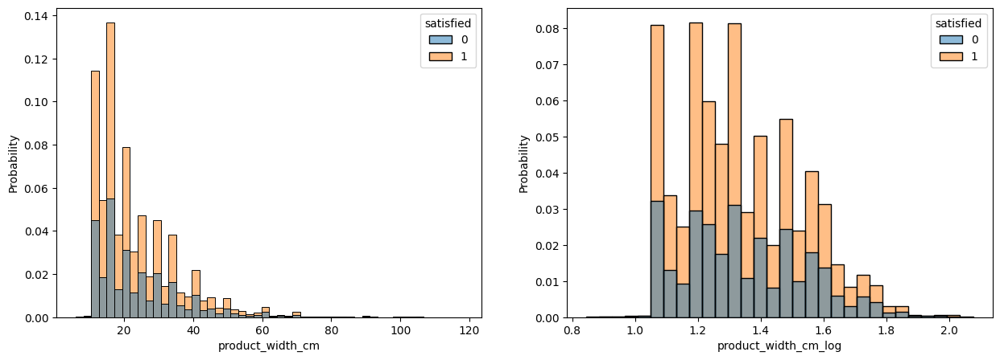

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_product,
             x='product_width_cm',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_product['product_width_cm_log'] = np.log10(stats_product['product_width_cm']+1)

sns.histplot(data=stats_product,
             x='product_width_cm_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_product['product_width_cm_log'].isna()

X = stats_product.loc[no_nans_mask]['product_width_cm'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [1.01008589]
Coefficients logistics regression: [[-0.00447486]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='product_width_cm', ylabel='satisfied'>

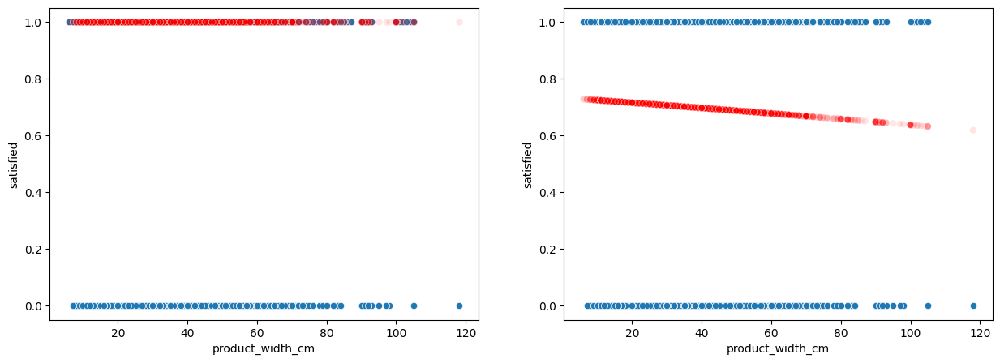

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_width_cm',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_width_cm',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_width_cm',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_width_cm',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats_product.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.7121170719859125

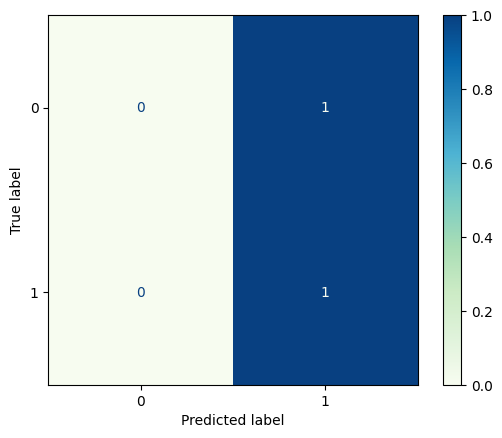

In [ ]:
cm = confusion_matrix(stats_product.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_product.loc[no_nans_mask]['product_width_cm'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.599939
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                32937
Model:                          Logit   Df Residuals:                    32935
Method:                           MLE   Df Model:                            1
Date:                Sun, 30 Jun 2024   Pseudo R-squ.:               0.0005107
Time:                        21:00:03   Log-Likelihood:                -19760.
converged:                       True   LL-Null:                       -19770.
Covariance Type:            nonrobust   LLR p-value:                 6.994e-06
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.0101      0.026     38.501      0.000       0.959       1.062
x1            -0.0045      0.001     -4.518      0.000      -0.006      -0.003


## Analysing based on order_id

### Linear regression

In [ ]:
#based on order width
stats_product_width_2=stats.groupby('review_score')['product_width_cm'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_width_2

,review_score,mean,count,median,std,min,max
0,1.0,23.230230,10812,20.0,12.157691,8.0,118.0
1,2.0,23.541771,3067,20.0,11.978673,8.0,97.0
2,3.0,23.327164,8078,20.0,11.881506,7.0,105.0
3,4.0,23.061116,19001,20.0,11.648457,7.0,105.0
4,5.0,22.887452,56908,20.0,11.586827,6.0,118.0


Text(0.5, 0, 'Median order width')

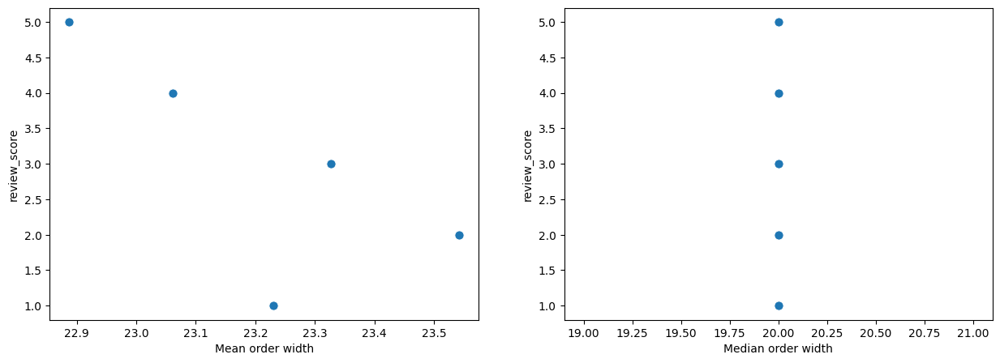

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_width_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean order width")

sns.scatterplot(data=stats_product_width_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median order width")

In [ ]:
# independent variable
X = stats_product_width_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_width_2['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean order width', ylabel='review_score'>

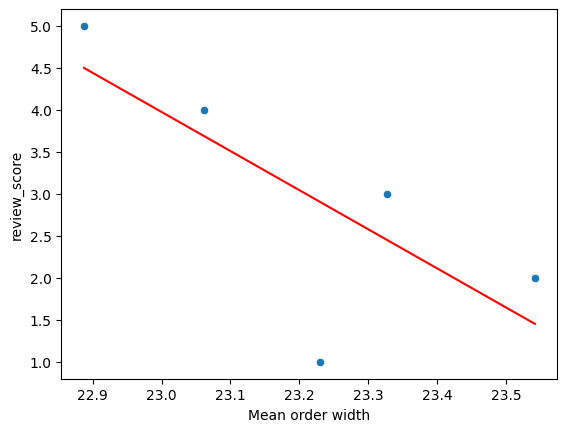

In [ ]:
sns.scatterplot(data=stats_product_width_2, x='mean', y='review_score')
plt.xlabel("Mean order width")

sns.lineplot(data=stats_product_width_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_width_2['mean'].values.reshape(-1, 1)
y = stats_product_width_2['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.543
Model:                            OLS   Adj. R-squared:                  0.391
Method:                 Least Squares   F-statistic:                     3.566
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.155
Time:                        21:15:24   Log-Likelihood:                -6.8692
No. Observations:                   5   AIC:                             17.74
Df Residuals:                       3   BIC:                             16.96
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        111.0911     57.240      1.941      0.1

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


# Product description

## Analysing by grouping and binning

In [ ]:
#analysing based on product description length vs review
#not clear connection between the description and the review score
df_no_duplicate_reviews_merged.groupby('review_score')[['product_description_lenght_2']].describe()

product_description_lenght_2                                      \
                                    count        mean         std  min    25%   
review_score                                                                    
1.0                               14213.0  757.652783  663.860672  0.0  321.0   
2.0                                3861.0  719.486920  606.865658  0.0  321.0   
3.0                                9391.0  761.630284  643.289191  0.0  338.0   
4.0                               21199.0  782.390679  647.482757  0.0  343.0   
5.0                               63173.0  782.514888  658.516981  0.0  342.0   

                                    
                50%    75%     max  
review_score                        
1.0           573.0  955.0  3992.0  
2.0           556.0  933.0  3923.0  
3.0           586.0  956.0  3985.0  
4.0           605.0  995.0  3985.0  
5.0           598.0  982.0  3992.0

In [ ]:
#analysing by creating bins
product_description=df.groupby(pd.cut(df_no_duplicate_reviews_merged['product_description_lenght_2'], np.arange(4,4000, 250))).agg({'review_score':'mean','review_id':'count'})
product_description

,review_score,review_id
product_description_lenght_2,,
"(4, 254]",4.033808,16091
"(254, 504]",4.023950,29144
"(504, 754]",4.025208,22374
"(754, 1004]",4.030204,15859
"(1004, 1254]",4.020880,9004
"(1254, 1504]",4.033795,5267
"(1504, 1754]",4.026037,3303
"(1754, 2004]",4.078210,2570
"(2004, 2254]",3.993370,1810


<Axes: xlabel='product_description_lenght_2', ylabel='Density'>

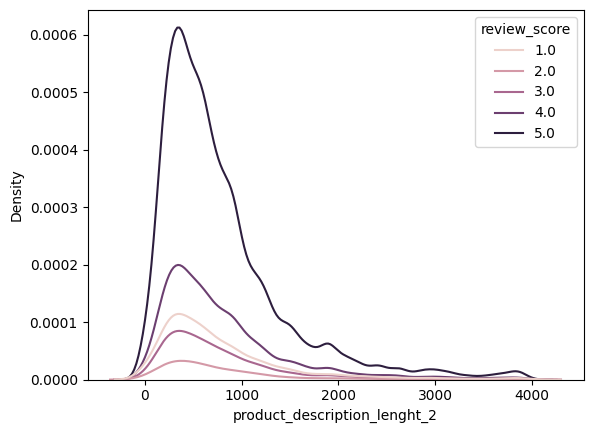

In [ ]:
#creating KDE plot
stats['product_description_lenght_2'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='product_description_lenght_2', hue='review_score')

## Analysing based on product_id

### Linear regression

In [ ]:
stats_product_description = stats_product[stats_product['product_description_lenght_2'].notnull()]
stats_product_description

,product_weight_g,product_length_cm,review_score,product_width_cm,product_description_lenght_2,product_photos_qty_2,satisfied,product_weight_g_log,product_length_cm_log,product_width_cm_log
product_id,,,,,,,,,,
00066f42aeeb9f3007548bb9d3f33c38,300.0,20.0,5.0,16.0,596.0,6.0,1,2.478566,1.322219,1.230449
00088930e925c41fd95ebfe695fd2655,1225.0,55.0,4.0,26.0,752.0,4.0,1,3.088490,1.748188,1.431364
0009406fd7479715e4bef61dd91f2462,300.0,45.0,1.0,35.0,266.0,2.0,0,2.478566,1.662758,1.556303
000b8f95fcb9e0096488278317764d19,550.0,19.0,5.0,12.0,364.0,3.0,1,2.741152,1.301030,1.113943
000d9be29b5207b54e86aa1b1ac54872,250.0,22.0,5.0,15.0,613.0,4.0,1,2.399674,1.361728,1.204120
...,...,...,...,...,...,...,...,...,...,...
fff6177642830a9a94a0f2cba5e476d1,1400.0,42.0,4.5,15.0,842.0,1.0,1,3.146438,1.633468,1.204120
fff81cc3158d2725c0655ab9ba0f712c,58.0,16.0,4.0,11.0,643.0,1.0,1,1.770852,1.230449,1.079181
fff9553ac224cec9d15d49f5a263411f,150.0,16.0,5.0,11.0,328.0,3.0,1,2.178977,1.230449,1.079181


In [ ]:
stats_product_description_2=stats_product_description.groupby('review_score')['product_description_lenght_2'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_description_2

,review_score,mean,count,median,std,min,max
0,1.000000,726.984056,2697,558.0,639.130180,0.0,3950.0
1,1.117647,0.000000,1,0.0,NaN,0.0,0.0
2,1.166667,309.000000,1,309.0,NaN,309.0,309.0
3,1.181818,3896.000000,1,3896.0,NaN,3896.0,3896.0
4,1.200000,414.500000,2,414.5,4.949747,411.0,418.0
...,...,...,...,...,...,...,...
633,4.916667,514.000000,2,514.0,132.936075,420.0,608.0
634,4.923077,913.333333,3,340.0,1065.730892,257.0,2143.0
635,4.937500,805.000000,1,805.0,NaN,805.0,805.0
636,4.958333,468.000000,1,468.0,NaN,468.0,468.0


Text(0.5, 0, 'Median product description')

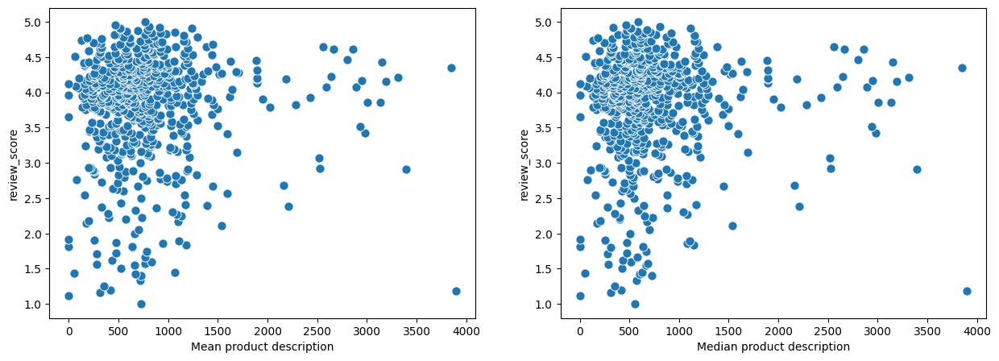

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_description_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean product description")

sns.scatterplot(data=stats_product_description_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median product description")

<Axes: xlabel='Mean product description', ylabel='review_score'>

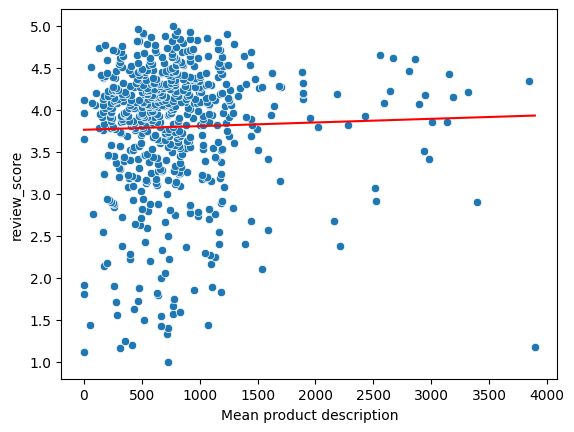

In [ ]:
# independent variable
X = stats_product_description_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_description_2['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=stats_product_description_2, x='mean', y='review_score')
plt.xlabel("Mean product description")

sns.lineplot(data=stats_product_description_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_description_2['mean'].values.reshape(-1, 1)
y = stats_product_description_2['review_score']

X_with_constant = sm.add_constant(X)

reg_sm = sm.OLS(y, X_with_constant).fit()

print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6186
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.432
Time:                        19:48:49   Log-Likelihood:                -740.67
No. Observations:                 638   AIC:                             1485.
Df Residuals:                     636   BIC:                             1494.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.7636      0.053     70.598      0.0

### Logistics regression

<Axes: xlabel='product_description_lenght_2_log', ylabel='Probability'>

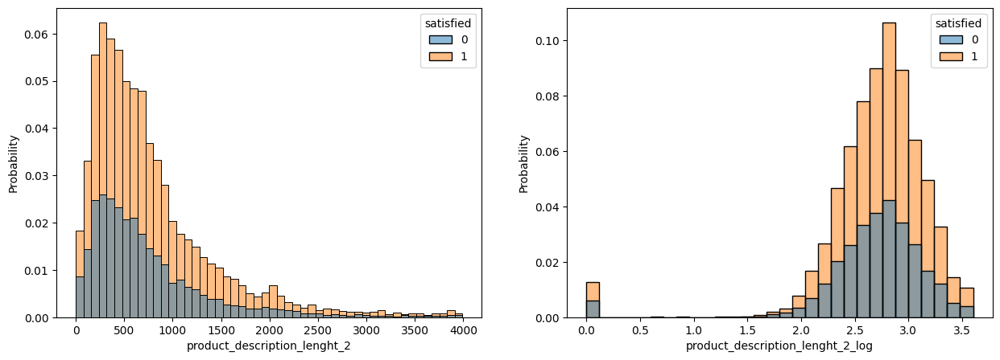

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_product,
             x='product_description_lenght_2',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_product['product_description_lenght_2_log'] = np.log10(stats_product['product_description_lenght_2']+1)

sns.histplot(data=stats_product,
             x='product_description_lenght_2_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_product['product_description_lenght_2_log'].isna()

X = stats_product.loc[no_nans_mask]['product_description_lenght_2'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [0.83792672]
Coefficients logistics regression: [[9.05557153e-05]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)

probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]

satisfied_predicted = logistics_reg.predict(X)

satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted

np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='product_description_lenght_2', ylabel='satisfied'>

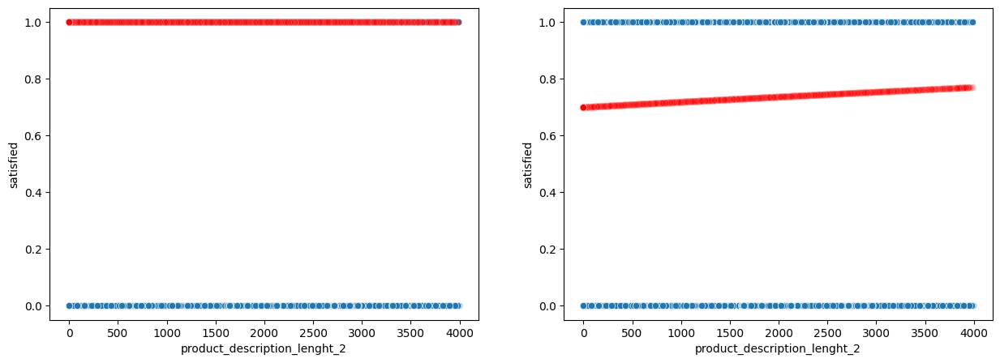

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_description_lenght_2',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_description_lenght_2',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_description_lenght_2',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_product.loc[no_nans_mask],
                x='product_description_lenght_2',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

In [ ]:
accuracy_score(stats_product.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

0.712134551747169

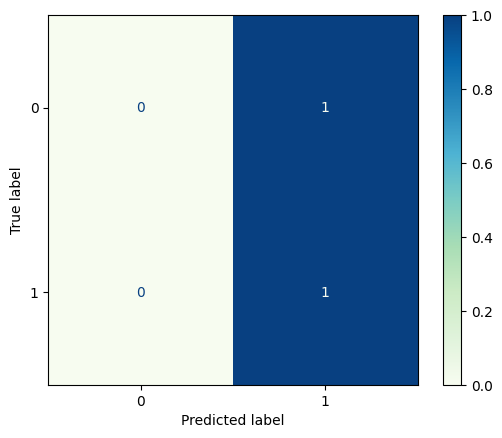

In [ ]:
cm = confusion_matrix(stats_product.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_product.loc[no_nans_mask]['product_description_lenght_2'].values.reshape(-1, 1)
y = stats_product.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.599899
         Iterations 5


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                32939
Model:                          Logit   Df Residuals:                    32937
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0005506
Time:                        19:49:10   Log-Likelihood:                -19760.
converged:                       True   LL-Null:                       -19771.
Covariance Type:            nonrobust   LLR p-value:                 3.073e-06
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8379      0.019     44.230      0.000       0.801       0.875
x1          9.056e-05   1.96e-05      4.624      0.000    5.22e-05       0.000


## Analysing based on order_id

### Linear regression

Text(0.5, 0, 'Median order description')

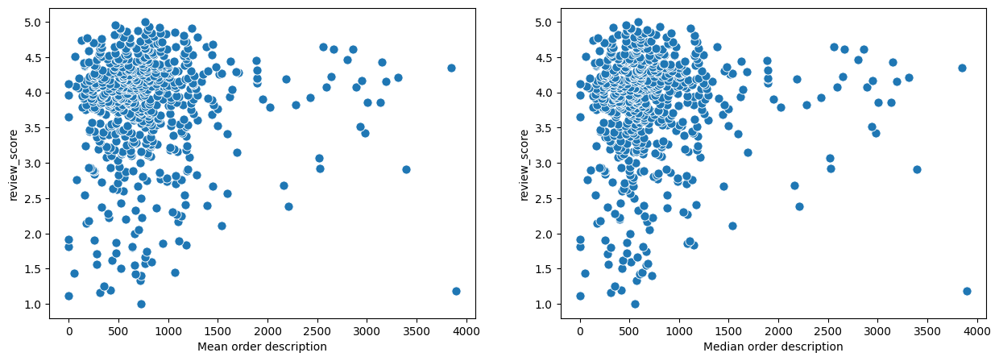

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_description_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean order description")

sns.scatterplot(data=stats_product_description_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median order description")

In [ ]:
# independent variable
X = stats_product_description_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_description_2['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean order description', ylabel='review_score'>

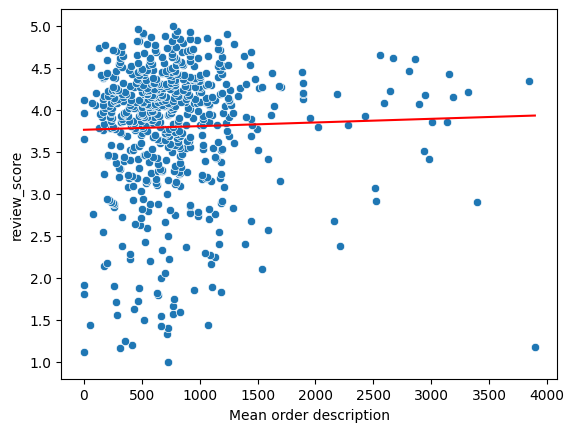

In [ ]:
sns.scatterplot(data=stats_product_description_2, x='mean', y='review_score')
plt.xlabel("Mean order description")

sns.lineplot(data=stats_product_description_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_description_2['mean'].values.reshape(-1, 1)
y = stats_product_description_2['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6186
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.432
Time:                        19:49:28   Log-Likelihood:                -740.67
No. Observations:                 638   AIC:                             1485.
Df Residuals:                     636   BIC:                             1494.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.7636      0.053     70.598      0.0

# Product photos

## Analysing by grouping and binning

In [ ]:
#analysing based on photos vs review
#not clear connection between number of photos and review score
df_no_duplicate_reviews_merged.groupby('review_score')[['product_photos_qty_2']].describe()

product_photos_qty_2                                          \
                            count      mean       std  min  25%  50%  75%   
review_score                                                                
1.0                       14213.0  2.038627  1.677692  0.0  1.0  1.0  3.0   
2.0                        3861.0  2.118104  1.765248  0.0  1.0  1.0  3.0   
3.0                        9391.0  2.203280  1.736072  0.0  1.0  1.0  3.0   
4.0                       21199.0  2.208217  1.733452  0.0  1.0  1.0  3.0   
5.0                       63173.0  2.194450  1.736156  0.0  1.0  1.0  3.0   

                    
               max  
review_score        
1.0           19.0  
2.0           17.0  
3.0           13.0  
4.0           18.0  
5.0           20.0

In [ ]:
#more than 1 photo has higher rating
product_photos=df_no_duplicate_reviews_merged.groupby('product_photos_qty_2')[['review_score']].agg(['mean','count'])
product_photos

review_score       
                             mean  count
product_photos_qty_2                    
0.0                      3.701425   1755
1.0                      3.999117  55514
2.0                      4.058667  21801
3.0                      4.078776  12288
4.0                      4.049802   8353
5.0                      4.156156   5328
6.0                      4.059546   3745
7.0                      4.101740   1494
8.0                      4.138122    724
9.0                      4.055921    304
10.0                     4.008798    341
11.0                     3.859155     71
12.0                     4.075472     53
13.0                     4.500000     30
14.0                     3.666667      6
15.0                     4.500000     12
17.0                     3.363636     11
18.0                     4.750000      4
19.0                     1.000000      2
20.0                     5.000000      1

<Axes: xlabel='product_photos_qty_2', ylabel='Density'>

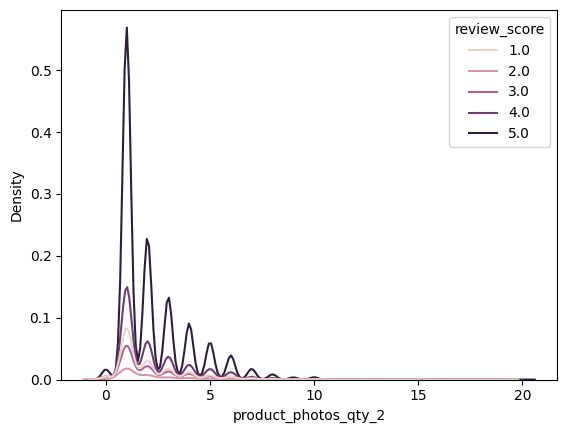

In [ ]:
#creating KDE plot
stats['product_photos_qty_2'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='product_photos_qty_2', hue='review_score')

## Analysing based on order_id

### Linear regression

In [ ]:
stats_product_photos_2=stats.groupby('review_score')['product_photos_qty_2'].agg(['mean','count','median','std','min','max']).reset_index()
stats_product_photos_2

,review_score,mean,count,median,std,min,max
0,1.0,2.100001,10896,1.000000,1.712973,0.0,19.0
1,2.0,2.161532,3087,1.000000,1.757520,0.0,15.0
2,3.0,2.238541,8096,1.666667,1.753923,0.0,13.0
3,4.0,2.243755,19015,2.000000,1.754820,0.0,18.0
4,5.0,2.225657,56955,2.000000,1.752350,0.0,20.0


Text(0.5, 0, 'Median order photos')

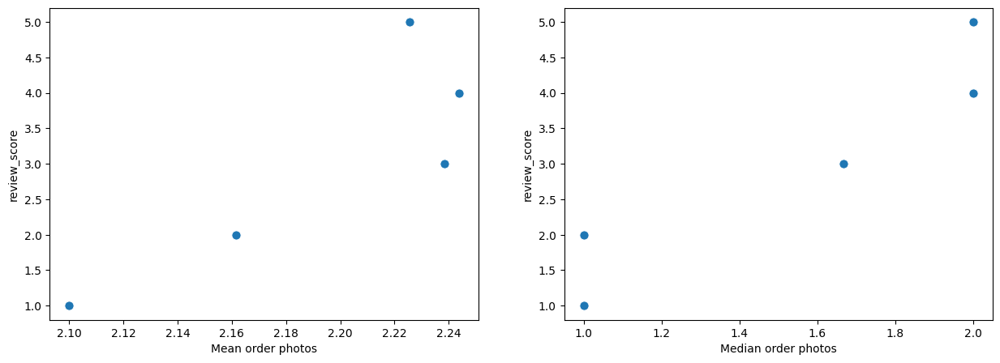

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_product_photos_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean order photos")

sns.scatterplot(data=stats_product_photos_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median order photos")

In [ ]:
# independent variable
X = stats_product_photos_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_product_photos_2['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean order photos', ylabel='review_score'>

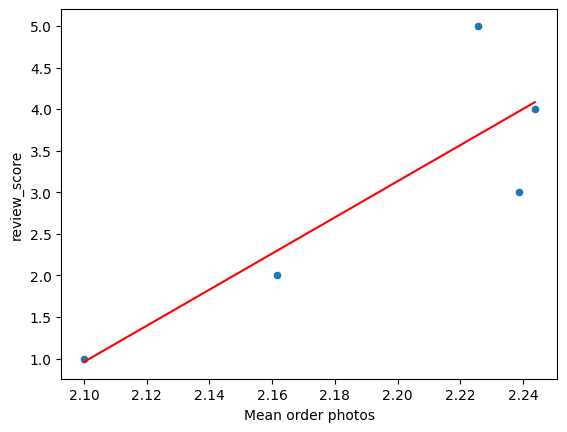

In [ ]:
sns.scatterplot(data=stats_product_photos_2, x='mean', y='review_score')
plt.xlabel("Mean order photos")

sns.lineplot(data=stats_product_photos_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_product_photos_2['mean'].values.reshape(-1, 1)
y = stats_product_photos_2['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.725
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     7.895
Date:                Sun, 07 Jul 2024   Prob (F-statistic):             0.0673
Time:                        19:50:55   Log-Likelihood:                -5.6032
No. Observations:                   5   AIC:                             15.21
Df Residuals:                       3   BIC:                             14.43
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -44.6656     16.969     -2.632      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


# Distance

## Analysing by grouping

In [ ]:
#there is connection between the review score and whether the seller and customers are from the same state
#the connection is most probably due to faster deliveries when seller and customers are from the same state
distance=df_no_duplicate_reviews_merged.groupby('same_state')['review_score'].agg(['mean','count'])
distance

,mean,count
same_state,,
0,3.965903,71384
1,4.144736,40453


In [ ]:
df_no_duplicate_reviews_merged.groupby('same_state')['order_delay'].agg(['mean','count'])

,mean,count
same_state,,
0,-12.912282,70316
1,-10.467546,39857


In [ ]:
df_no_duplicate_reviews_merged.groupby('same_state')['total_delivery'].agg(['mean','count'])

,mean,count
same_state,,
0,14.583736,70316
1,7.460822,39857


# Order status

In [ ]:
df_no_duplicate_reviews_merged.groupby('order_status').agg({'order_id':'count','review_score':'mean'}).reset_index()

,order_status,order_id,review_score
0,approved,3,2.000000
1,canceled,699,1.768778
2,created,5,2.333333
3,delivered,110173,4.081814
4,invoiced,361,1.611268
5,processing,357,1.330484
6,shipped,1186,1.987273


In [ ]:
order_status=df_no_duplicate_reviews_merged.loc[(df_no_duplicate_reviews_merged['order_status']!='delivered')]
order_status_2=order_status.groupby(['order_status','review_score'])['order_id'].count().reset_index()
order_status_2

,order_status,review_score,order_id
0,approved,1.0,2
1,approved,4.0,1
2,canceled,1.0,476
3,canceled,2.0,54
4,canceled,3.0,51
5,canceled,4.0,26
6,canceled,5.0,72
7,created,1.0,2
8,created,5.0,1
9,invoiced,1.0,264


In [ ]:
#review by order status
order_status.groupby('order_status')['review_score'].mean().reset_index()

,order_status,review_score
0,approved,2.000000
1,canceled,1.768778
2,created,2.333333
3,invoiced,1.611268
4,processing,1.330484
5,shipped,1.987273


In [ ]:
#most commont words used for orders which are not delivered
words_orders=order_status['review_comment_message'].str.split().explode().value_counts()
words_orders

review_comment_message
o             1175
não            907
e              774
produto        641
de             615
              ... 
nota!            1
,só              1
avalie           1
parceiras        1
pendentes.       1
Name: count, Length: 4290, dtype: int64

In [ ]:
#searching for most commont words as "delivery','yet','term','more','delivered', 'now', 'order','arrived','contact','money','bought','waiting','same','after','none','to receive','waiting'
#how many review messages contain such words
order_status['Words_count']=order_status['review_comment_message'].astype(str).str.contains('entrega|ainda|prazo|mais|entregue|agora|pedido|chegou|contato|dinheiro|comprei|aguardando|mesmo|depois|nenhuma|receber|esperando')==True
order_status
order_status.groupby('Words_count').size()

<ipython-input-341-bf0d78a6b5c1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  order_status['Words_count']=order_status['review_comment_message'].astype(str).str.contains('entrega|ainda|prazo|mais|entregue|agora|pedido|chegou|contato|dinheiro|comprei|aguardando|mesmo|depois|nenhuma|receber|esperando')==True


Words_count
False    1549
True     1062
dtype: int64

In [ ]:
#how many of the false are actually na
order_status['review_comment_message'].isnull().sum()

1010

In [ ]:
!pip install googletrans==3.1.0a0
from googletrans import Translator
translator = Translator()

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 7.5 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16353 sha256=7db31a5d715c47d791c7ff36a67ff9b2796fdd7100dfc41c64c872104b09ee3c
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling c

In [ ]:
words_orders_t=['entrega','ainda','prazo','mais','entregue', 'agora', 'pedido','chegou','contato','dinheiro','comprei','aguardando','mesmo','depois','nenhuma','receber','esperando']
translations = translator.translate(words_orders_t, dest='en')
for translation in translations:  # print every translation
    print(translation.text)
translation_df = translation.text

delivery
yet
term
more
delivered
now
order
it arrived
contact
money
I bought
waiting
same
after
none
to receive
waiting


In [ ]:
final_words_s = pd.DataFrame({'words':['entrega','ainda','prazo','mais','entregue', 'agora', 'pedido','chegou','contato','dinheiro','comprei','aguardando','mesmo','depois','nenhuma','receber','esperando'],'count':[188,160,143,119,103,101,97,88,74,64,64,59,59,56,52,42,40]})
final_words_s

,words,count
0,entrega,188
1,ainda,160
2,prazo,143
3,mais,119
4,entregue,103
5,agora,101
6,pedido,97
7,chegou,88
8,contato,74
9,dinheiro,64


In [ ]:
final_words_translated = pd.DataFrame({'words':['delivery','yet','term','more','delivered', 'now', 'order','arrived','contact','money','bought','waiting','same','after','none','to receive','waiting'],'count':[188,160,143,119,103,101,97,88,74,64,64,59,59,56,52,42,40]})
final_words_f = final_words_translated.set_index('words')

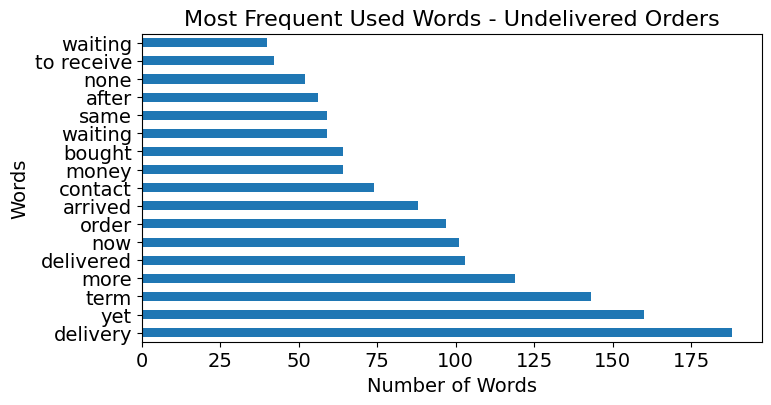

In [ ]:
fig,ax = plt.subplots(figsize = (8,4))

final_words_f.plot.barh(ax = ax, legend = False, width = 0.5)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
ax.grid(False)
plt.xlabel('Number of Words',fontsize=14)
plt.ylabel("Words", fontsize=14)
plt.title("Most Frequent Used Words - Undelivered Orders",fontsize=16)
plt.show()
ax.set_facecolor('white')

# Freight value

<Axes: xlabel='freight_value', ylabel='Density'>

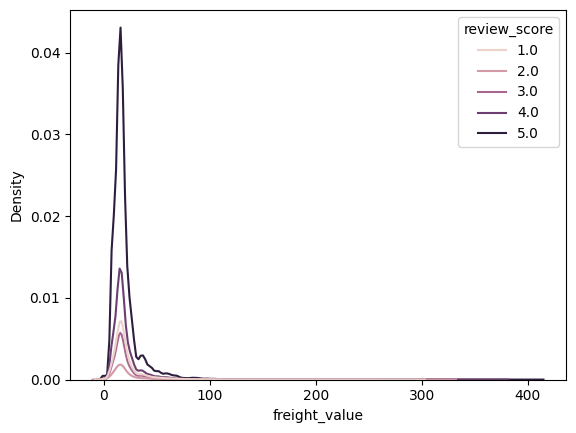

In [ ]:
#creating KDE plot
stats['freight_value'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='freight_value', hue='review_score')

In [ ]:
#it seems the higher the freight value the lower the review score
df_no_duplicate_reviews_merged.groupby('review_score')[['freight_value']].describe()

freight_value                                             \
                     count       mean        std  min     25%     50%   
review_score                                                            
1.0                14131.0  21.234136  17.960397  0.0  13.710  16.810   
2.0                 3842.0  20.953743  17.360180  0.0  13.255  16.485   
3.0                 9373.0  20.285831  15.109924  0.0  13.450  16.530   
4.0                21186.0  20.071009  15.166779  0.0  13.370  16.365   
5.0                63138.0  19.581064  15.483220  0.0  12.820  16.110   

                               
                  75%     max  
review_score                   
1.0           22.3150  294.76  
2.0           22.4125  321.88  
3.0           21.5800  255.92  
4.0           21.4500  375.28  
5.0           20.6400  409.68

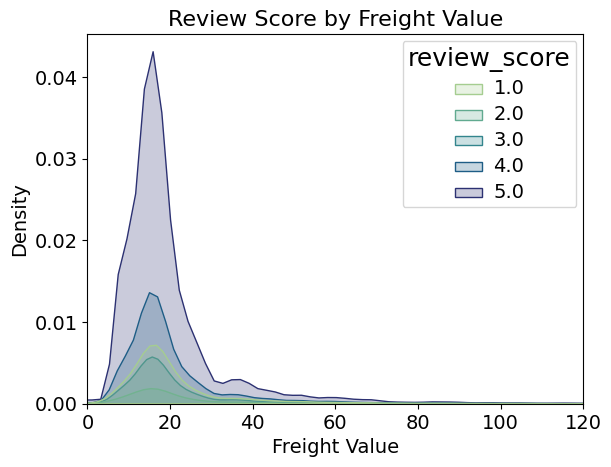

In [ ]:
ax=sns.kdeplot(stats, x="freight_value", hue='review_score',palette="crest", fill=True)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Freight Value", fontsize=14)
plt.ylabel('Density',fontsize=14)
ax.grid(False)
plt.xlim(0,120)

# for legend text
plt.setp(ax.get_legend().get_texts(), fontsize='14')
plt.title("Review Score by Freight Value", fontsize='16')
# for legend title
plt.setp(ax.get_legend().get_title(), fontsize='18')
plt.show()

## Linear regression

In [ ]:
stats_freight=stats_freight.groupby('review_score')['freight_value'].agg(['mean','count','median','std','min','max']).reset_index()
stats_freight

,review_score,mean,count,median,std,min,max
0,1.0,27.538507,10896,18.350,29.890902,0.0,1002.29
1,2.0,26.078484,3087,17.970,26.290204,0.0,456.47
2,3.0,23.485560,8096,17.615,22.270550,0.0,626.64
3,4.0,22.362576,19015,17.180,19.423334,0.0,479.28
4,5.0,21.706772,56955,16.790,19.853149,0.0,1794.96


Text(0.5, 0, 'Mean freight')

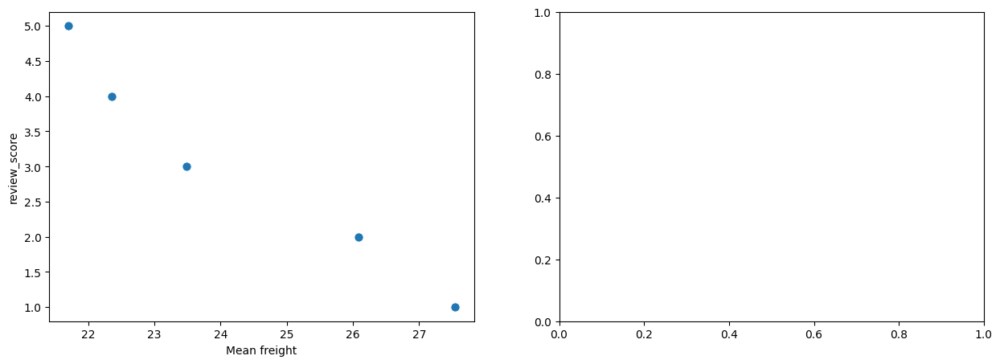

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_freight, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean freight")

In [ ]:
# independent variable
X = stats_freight['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_freight['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean freight', ylabel='review_score'>

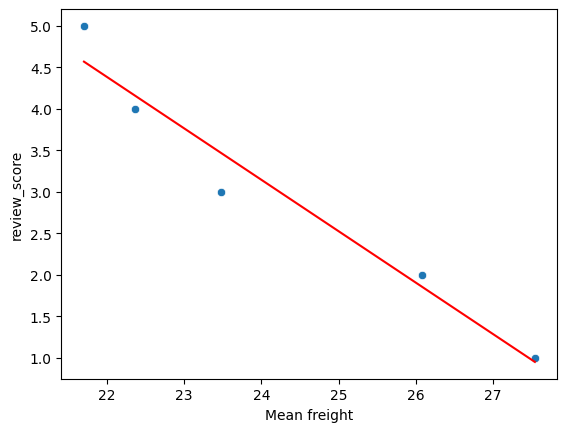

In [ ]:
sns.scatterplot(data=stats_freight, x='mean', y='review_score')
plt.xlabel("Mean freight")

sns.lineplot(data=stats_freight,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_freight['mean'].values.reshape(-1, 1)
y = stats_freight['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     63.43
Date:                Sun, 07 Jul 2024   Prob (F-statistic):            0.00413
Time:                        20:08:21   Log-Likelihood:                -1.0836
No. Observations:                   5   AIC:                             6.167
Df Residuals:                       3   BIC:                             5.386
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         18.0461      1.897      9.512      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


## Logistics regression

<Axes: xlabel='freight_value_log', ylabel='Probability'>

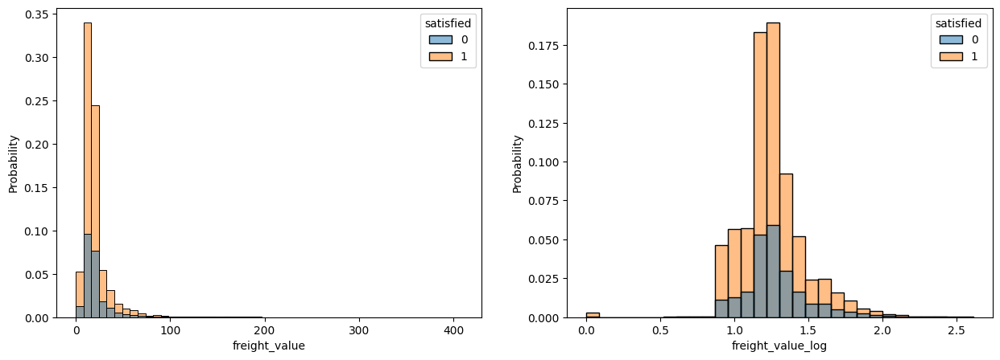

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats,
             x='freight_value',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats['freight_value_log'] = np.log10(stats['freight_value']+1)

sns.histplot(data=stats,
             x='freight_value_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats['freight_value_log'].isna()

X = stats.loc[no_nans_mask]['freight_value'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

Intercept logistics regression: [1.29731956]
Coefficients logistics regression: [[-0.00441387]]


True

<Axes: xlabel='freight_value', ylabel='satisfied'>

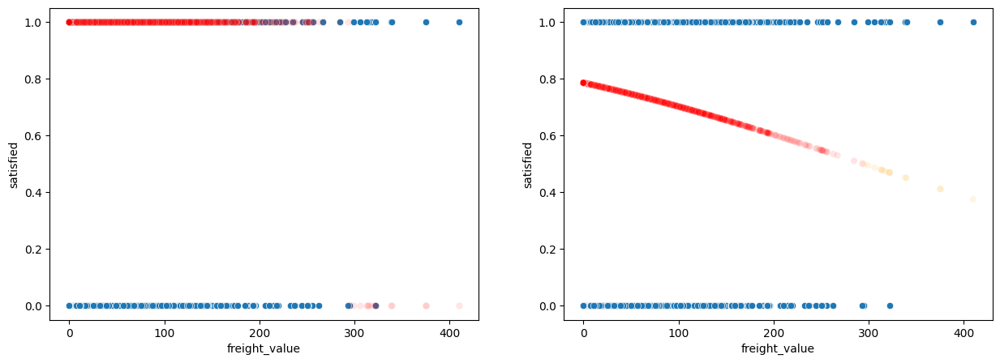

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='freight_value',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='freight_value',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='freight_value',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats.loc[no_nans_mask],
                x='freight_value',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

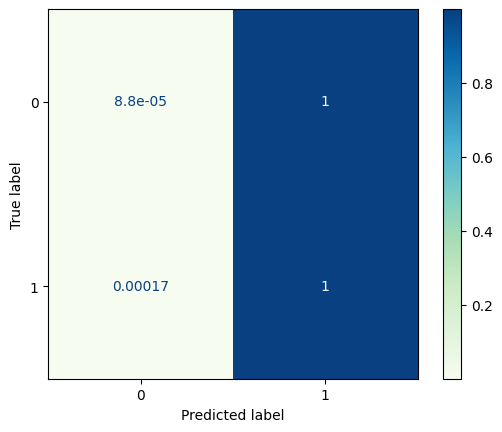

In [ ]:
accuracy_score(stats.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(stats.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats.loc[no_nans_mask]['freight_value'].values.reshape(-1, 1)
y = stats.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.539085
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                98631
Model:                          Logit   Df Residuals:                    98629
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0008962
Time:                        20:12:45   Log-Likelihood:                -53170.
converged:                       True   LL-Null:                       -53218.
Covariance Type:            nonrobust   LLR p-value:                 1.565e-22
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2973      0.012    108.995      0.000       1.274       1.321
x1            -0.0044      0.

# Payment

In [ ]:
db_path = '/content/gdrive/MyDrive/Colab Notebooks/SQLite/online_transactions.sqlite'
con = sqlite3.connect(db_path)

In [ ]:
payments_dataset = pd.read_sql(sql="SELECT * FROM olist_order_payments_dataset", con=con)
payments_dataset.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [ ]:
reviews_dataset = pd.read_sql(sql="SELECT * FROM olist_order_reviews_dataset", con=con)
reviews_dataset.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,None,None,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,None,None,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,None,None,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,None,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,None,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [ ]:
#mergin the payment table with reviews
payments_merged = pd.merge(
    left=payments_dataset,
    right=reviews_dataset,
    left_on='order_id',
    right_on='order_id',
    indicator=True
)

In [ ]:
payments_merged.shape

(103677, 12)

In [ ]:
#analysis by payment type - no clear connection found
payments_merged.groupby('payment_type')['review_score'].mean()

payment_type
boleto         4.086631
credit_card    4.087637
debit_card     4.168084
not_defined    1.666667
voucher        4.003804
Name: review_score, dtype: float64

In [ ]:
payments_merged.groupby('payment_type').describe()

payment_sequential                                                \
                          count      mean       std  min  25%  50%  75%   max   
payment_type                                                                    
boleto                  19762.0  1.000051  0.007114  1.0  1.0  1.0  1.0   2.0   
credit_card             76600.0  1.004112  0.063995  1.0  1.0  1.0  1.0   2.0   
debit_card               1529.0  1.034009  0.184886  1.0  1.0  1.0  1.0   3.0   
not_defined                 3.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0   
voucher                  5783.0  2.615943  2.561253  1.0  1.0  2.0  3.0  29.0   

             payment_installments            ... payment_value            \
                            count      mean  ...           75%       max   
payment_type                                 ...                           
boleto                    19762.0  1.000000  ...      160.3700   7274.88   
credit_card               76600.0  3.509478  ...      180.8125  13664.08   
debit_card                 1529.0  1.000000  ...      154.3200   4445.50   
not_defined                   3.0  1.000000  ...        0.0000      0.00   
voucher                    5783.0  1.000000  ...       79.1650   3184.34   

             review_score                                               
                    count      mean       std  min  25%  50%  75%  max  
payment_type                                                            
boleto            19762.0  4.086631  1.339223  1.0  4.0  5.0  5.0  5.0  
credit_card       76600.0  4.087637  1.348525  1.0  4.0  5.0  5.0  5.0  
debit_card         1529.0  4.168084  1.294825  1.0  4.0  5.0  5.0  5.0  
not_defined           3.0  1.666667  1.154701  1.0  1.0  1.0  2.0  3.0  
voucher            5783.0  4.003804  1.401185  1.0  3.0  5.0  5.0  5.0  

[5 rows x 32 columns]

In [ ]:
#analysis by payment installemnt
#it seems that the higher the installments the lower the review
payments_merged.groupby('payment_installments')['review_score'].describe()

,count,mean,std,min,25%,50%,75%,max
payment_installments,,,,,,,,
0,2.0,5.000000,0.000000,5.0,5.0,5.0,5.00,5.0
1,52456.0,4.109749,1.327701,1.0,4.0,5.0,5.00,5.0
2,12354.0,4.109357,1.319797,1.0,4.0,5.0,5.00,5.0
3,10436.0,4.058452,1.360767,1.0,4.0,5.0,5.00,5.0
4,7095.0,4.054686,1.358534,1.0,4.0,5.0,5.00,5.0
5,5225.0,4.063732,1.366982,1.0,4.0,5.0,5.00,5.0
6,3919.0,4.075274,1.368984,1.0,4.0,5.0,5.00,5.0
7,1619.0,4.040148,1.383817,1.0,4.0,5.0,5.00,5.0
8,4270.0,4.020375,1.418285,1.0,4.0,5.0,5.00,5.0


##  Payment installments Linear regression

In [ ]:
stats_payments=payments_merged.groupby('review_score')['payment_installments'].agg(['mean','count','median','std','min','max']).reset_index()
stats_payments

,review_score,mean,count,median,std,min,max
0,1,3.093118,11974,2.0,2.901069,1,24
1,2,2.963363,3330,2.0,2.749015,1,24
2,3,2.865504,8543,2.0,2.665643,1,24
3,4,2.750400,20008,1.0,2.598636,1,24
4,5,2.833205,59822,1.0,2.669586,0,24


Text(0.5, 0, 'Mean days approval-delivery')

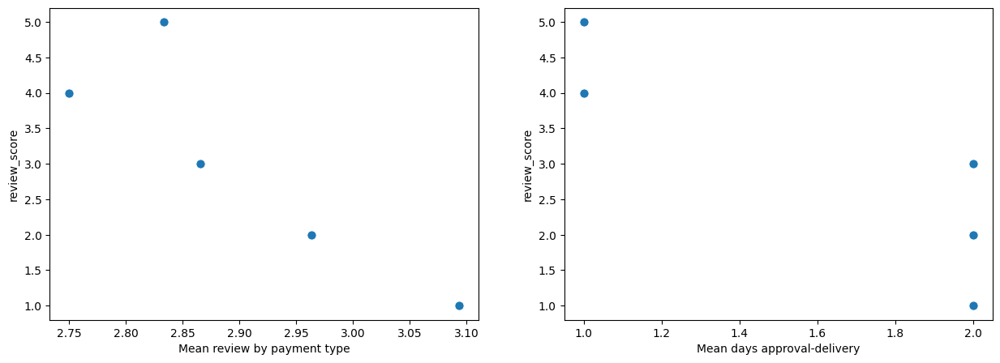

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_payments, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean review by payment type")

sns.scatterplot(data=stats_payments, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Mean days approval-delivery")

In [ ]:
# independent variable
X = stats_payments['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_payments['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean days approval-delivery', ylabel='review_score'>

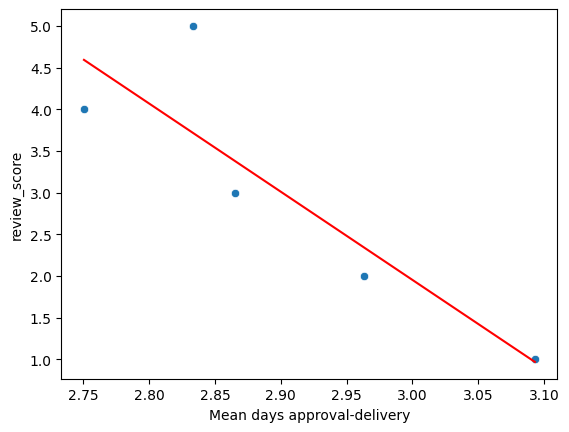

In [ ]:
sns.scatterplot(data=stats_payments, x='mean', y='review_score')
plt.xlabel("Mean days approval-delivery")

sns.lineplot(data=stats_payments,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_payments['mean'].values.reshape(-1, 1)
y = stats_payments['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.774
Model:                            OLS   Adj. R-squared:                  0.699
Method:                 Least Squares   F-statistic:                     10.30
Date:                Sun, 07 Jul 2024   Prob (F-statistic):             0.0490
Time:                        20:14:58   Log-Likelihood:                -5.1043
No. Observations:                   5   AIC:                             14.21
Df Residuals:                       3   BIC:                             13.43
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         33.6614      9.561      3.521      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


##  Payment installments Logistics regression

In [ ]:
stats_payments_2=payments_merged.groupby('order_id')[['payment_installments','review_score']].mean()
stats_payments_2

,payment_installments,review_score
order_id,,
00010242fe8c5a6d1ba2dd792cb16214,2.0,5.0
00018f77f2f0320c557190d7a144bdd3,3.0,4.0
000229ec398224ef6ca0657da4fc703e,5.0,5.0
00024acbcdf0a6daa1e931b038114c75,2.0,4.0
00042b26cf59d7ce69dfabb4e55b4fd9,3.0,5.0
...,...,...
fffc94f6ce00a00581880bf54a75a037,1.0,5.0
fffcd46ef2263f404302a634eb57f7eb,1.0,5.0
fffce4705a9662cd70adb13d4a31832d,3.0,5.0


In [ ]:
stats_payments_2['satisfied']=0
stats_payments_2.loc[stats_payments_2['review_score']>=4,'satisfied']=1
stats_payments_2.head()

,payment_installments,review_score,satisfied
order_id,,,
00010242fe8c5a6d1ba2dd792cb16214,2.0,5.0,1
00018f77f2f0320c557190d7a144bdd3,3.0,4.0,1
000229ec398224ef6ca0657da4fc703e,5.0,5.0,1
00024acbcdf0a6daa1e931b038114c75,2.0,4.0,1
00042b26cf59d7ce69dfabb4e55b4fd9,3.0,5.0,1


<Axes: xlabel='payment_installments_log', ylabel='Probability'>

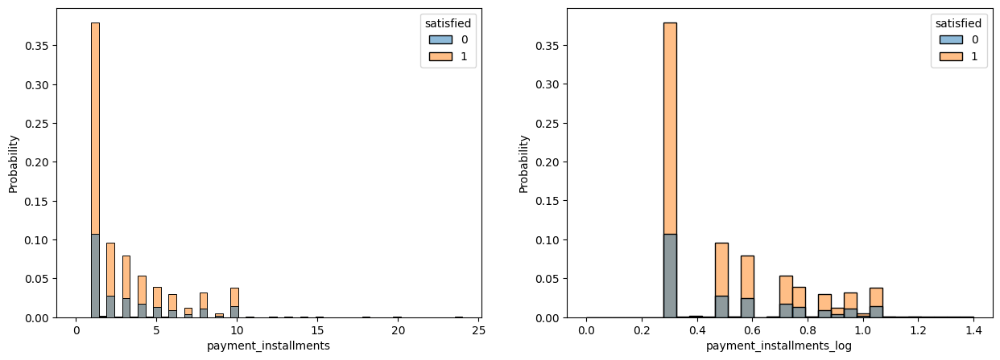

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_payments_2,
             x='payment_installments',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_payments_2['payment_installments_log'] = np.log10(stats_payments_2['payment_installments']+1)

sns.histplot(data=stats_payments_2,
             x='payment_installments_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_payments_2['payment_installments_log'].isna()

X = stats_payments_2.loc[no_nans_mask]['payment_installments'].values.reshape(-1, 1)
y = stats_payments_2.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

Intercept logistics regression: [1.28901892]
Coefficients logistics regression: [[-0.02625402]]


True

<Axes: xlabel='payment_installments', ylabel='satisfied'>

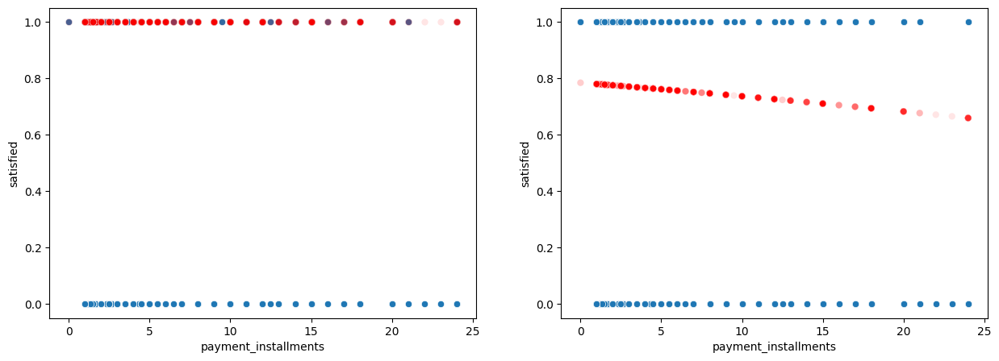

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_payments_2.loc[no_nans_mask],
                x='payment_installments',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_payments_2.loc[no_nans_mask],
                x='payment_installments',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_payments_2.loc[no_nans_mask],
                x='payment_installments',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_payments_2.loc[no_nans_mask],
                x='payment_installments',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

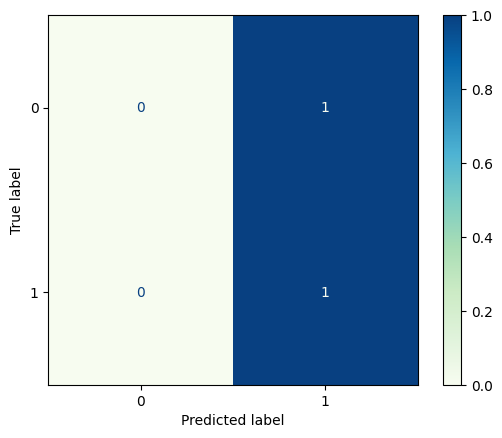

In [ ]:
accuracy_score(stats_payments_2.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(stats_payments_2.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_payments_2.loc[no_nans_mask]['payment_installments'].values.reshape(-1, 1)
y = stats_payments_2.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.538195
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                98672
Model:                          Logit   Df Residuals:                    98670
Method:                           MLE   Df Model:                            1
Date:                Sun, 07 Jul 2024   Pseudo R-squ.:               0.0008560
Time:                        20:15:35   Log-Likelihood:                -53105.
converged:                       True   LL-Null:                       -53150.
Covariance Type:            nonrobust   LLR p-value:                 1.439e-21
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2890      0.011    115.292      0.000       1.267       1.311
x1            -0.0263      0.

# Price

<Axes: xlabel='price', ylabel='Density'>

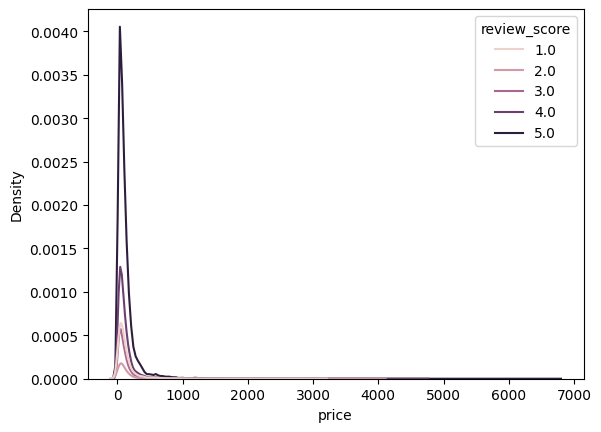

In [ ]:
#creating KDE plot
stats['price'].value_counts()
stats['review_score'].value_counts()
sns.kdeplot(data=stats, x='price', hue='review_score')


In [ ]:
#it seems the higher the freight value the lower the review score
#not clear connectio between the price and review score
df_no_duplicate_reviews_merged.groupby('review_score')[['price']].describe()

price                                                       \
                count        mean         std   min   25%    50%       75%   
review_score                                                                 
1.0           14131.0  127.484097  202.491062  0.85  39.9  75.00  138.0000   
2.0            3842.0  116.000617  178.916062  5.31  39.9  72.90  133.0000   
3.0            9373.0  110.010653  141.389926  3.06  39.0  69.99  129.2000   
4.0           21186.0  118.801025  178.047611  0.85  39.9  75.00  131.9975   
5.0           63138.0  121.416453  184.795919  0.85  39.9  74.99  135.0000   

                       
                  max  
review_score           
1.0           3109.99  
2.0           3999.00  
3.0           2899.00  
4.0           4690.00  
5.0           6735.00

## Linear regression

In [ ]:
stats_price=df_no_duplicate_reviews_merged.groupby('order_id').agg({'review_score':'mean','price':'sum'}).reset_index()
stats_price

,order_id,review_score,price
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,58.90
1,00018f77f2f0320c557190d7a144bdd3,4.0,239.90
2,000229ec398224ef6ca0657da4fc703e,5.0,199.00
3,00024acbcdf0a6daa1e931b038114c75,4.0,12.99
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,199.90
...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,299.99
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,350.00
98800,fffce4705a9662cd70adb13d4a31832d,5.0,99.90
98801,fffe18544ffabc95dfada21779c9644f,5.0,55.99


In [ ]:
stats_price_2=stats_price.groupby('review_score')['price'].agg(['mean','count','median','std','min','max']).reset_index()
stats_price_2

,review_score,mean,count,median,std,min,max
0,1.0,165.333863,10896,98.90,286.371463,0.0,13440.0
1,2.0,144.371354,3087,89.90,219.495639,0.0,3999.0
2,3.0,127.362877,8096,82.65,168.060377,0.0,2919.4
3,4.0,132.364897,19015,84.00,195.479641,0.0,4690.0
4,5.0,134.597349,56955,84.99,200.554776,0.0,6735.0


Text(0.5, 0, 'Median order price')

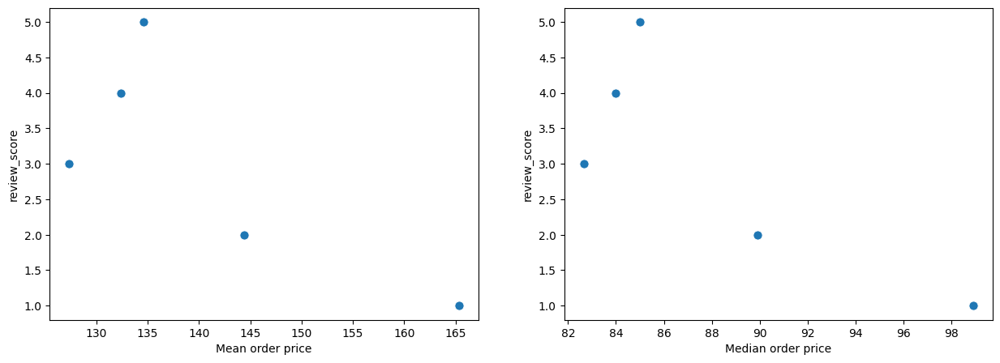

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_price_2, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean order price")

sns.scatterplot(data=stats_price_2, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median order price")

In [ ]:
# independent variable
X = stats_price_2['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_price_2['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean order price', ylabel='review_score'>

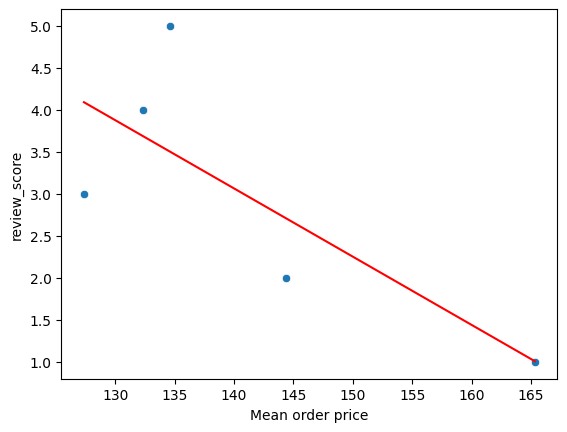

In [ ]:
sns.scatterplot(data=stats_price_2, x='mean', y='review_score')
plt.xlabel("Mean order price")

sns.lineplot(data=stats_price_2,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_price_2['mean'].values.reshape(-1, 1)
y = stats_price_2['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.462
Method:                 Least Squares   F-statistic:                     4.439
Date:                Sun, 07 Jul 2024   Prob (F-statistic):              0.126
Time:                        20:18:35   Log-Likelihood:                -6.5574
No. Observations:                   5   AIC:                             17.11
Df Residuals:                       3   BIC:                             16.33
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         14.4344      5.452      2.648      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


In [ ]:
stats_price['satisfied']=0
stats_price.loc[stats_price['review_score']>=4,'satisfied']=1
stats_price.head()

,order_id,review_score,price,satisfied
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,58.90,1
1,00018f77f2f0320c557190d7a144bdd3,4.0,239.90,1
2,000229ec398224ef6ca0657da4fc703e,5.0,199.00,1
3,00024acbcdf0a6daa1e931b038114c75,4.0,12.99,1
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,199.90,1


<Axes: xlabel='price_log', ylabel='Probability'>

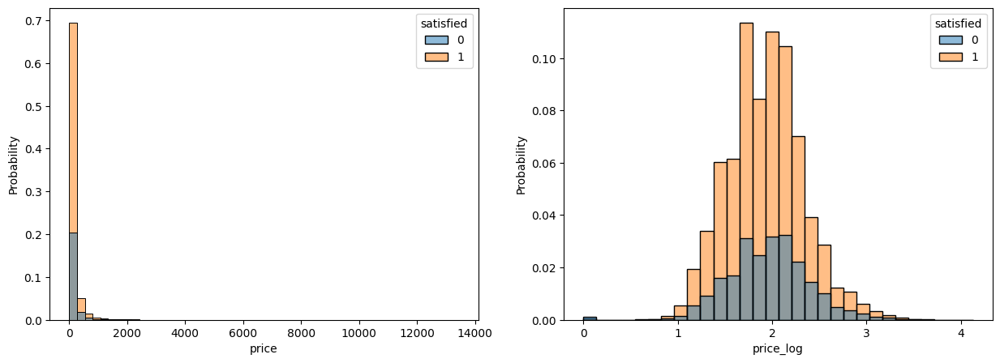

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_price,
             x='price',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_price['price_log'] = np.log10(stats_price['price']+1)

sns.histplot(data=stats_price,
             x='price_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

# Graph by time

In [ ]:
df_set_for_graph=df_no_duplicate_reviews_merged
df_set_for_graph['order_purchase_timestamp']=pd.to_datetime(df_no_duplicate_reviews_merged['order_purchase_timestamp'])
df_set_for_graph['order_purchase_timestamp']=df_set_for_graph['order_purchase_timestamp'].dt.date
df_set_for_graph_2=df_set_for_graph.groupby('order_purchase_timestamp')['review_score'].mean().reset_index()
df_time= df_set_for_graph_2.rename(columns={'order_purchase_timestamp': 'ds', 'review_score': 'y'})
df_time.head()

,ds,y
0,2016-09-04,1.0
1,2016-09-05,1.0
2,2016-09-13,1.0
3,2016-09-15,1.0
4,2016-10-02,1.0


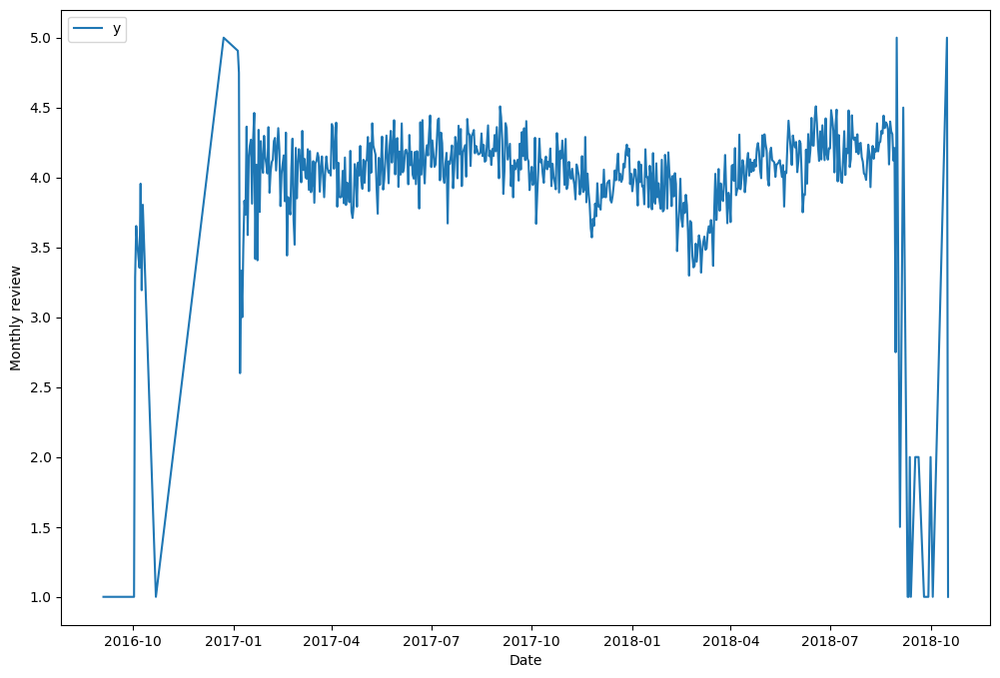

In [ ]:
import matplotlib.pyplot as plt

ax = df_time.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Monthly review')
ax.set_xlabel('Date')

plt.show()

# Top sellers

In [ ]:
seller_cat_stat=df_no_duplicate_reviews_merged.groupby('seller_id').agg({'review_score':'mean','seller_total_score':'max','seller_cat_type':'max'}).reset_index()
seller_cat_stat=seller_cat_stat.dropna()
seller_cat_stat

,seller_id,review_score,seller_total_score,seller_cat_type
0,0015a82c2db000af6aaaf3ae2ecb0532,3.666667,3.00,B. Standard
1,001cca7ae9ae17fb1caed9dfb1094831,3.902542,4.00,D. Premium
3,002100f778ceb8431b7a1020ff7ab48f,3.981818,2.75,B. Standard
4,003554e2dce176b5555353e4f3555ac8,5.000000,2.50,B. Standard
5,004c9cd9d87a3c30c522c48c4fc07416,4.132530,3.75,D. Premium
...,...,...,...,...
3086,ffc470761de7d0232558ba5e786e57b7,4.300000,3.50,C. Above Standard
3088,ffdd9f82b9a447f6f8d4b91554cc7dd3,4.250000,4.00,D. Premium
3089,ffeee66ac5d5a62fe688b9d26f83f534,4.214286,3.25,C. Above Standard
3090,fffd5413c0700ac820c7069d66d98c89,3.866667,4.00,D. Premium


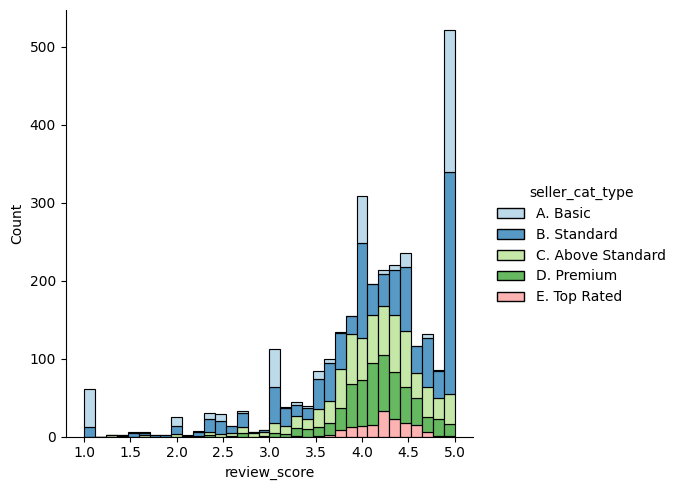

In [ ]:
sns.displot(seller_cat_stat, x="review_score", hue="seller_cat_type", multiple="stack",palette="Paired")

## Linear regression

In [ ]:
df_seller=df_no_duplicate_reviews_merged.dropna()

In [ ]:
seller_with_review=df_seller.groupby('seller_id').agg({'review_score':'mean','seller_total_score':'mean'}).reset_index()
seller_with_review

,seller_id,review_score,seller_total_score
0,001cca7ae9ae17fb1caed9dfb1094831,5.000000,4.00
1,004c9cd9d87a3c30c522c48c4fc07416,2.333333,3.75
2,00720abe85ba0859807595bbf045a33b,2.714286,3.25
3,00ee68308b45bc5e2660cd833c3f81cc,3.571429,4.00
4,00fc707aaaad2d31347cf883cd2dfe10,3.000000,3.00
...,...,...,...
1505,ffad1e7127fb622cb64a900751590acd,5.000000,3.25
1506,ffc470761de7d0232558ba5e786e57b7,3.333333,3.50
1507,ffdd9f82b9a447f6f8d4b91554cc7dd3,5.000000,4.00
1508,ffeee66ac5d5a62fe688b9d26f83f534,1.000000,3.25


In [ ]:
stats_seller=seller_with_review.groupby('review_score')['seller_total_score'].agg(['mean','count','median','std','min','max']).reset_index()
stats_seller

,review_score,mean,count,median,std,min,max
0,1.000000,2.890777,103,3.000,0.682116,1.25,4.25
1,1.285714,3.250000,1,3.250,NaN,3.25,3.25
2,1.333333,3.625000,2,3.625,0.530330,3.25,4.00
3,1.500000,3.300000,5,3.500,0.325960,2.75,3.50
4,1.555556,3.750000,1,3.750,NaN,3.75,3.75
...,...,...,...,...,...,...,...
221,4.833333,3.600000,5,3.500,0.454148,3.00,4.25
222,4.846154,4.250000,1,4.250,NaN,4.25,4.25
223,4.857143,3.937500,4,3.750,0.375000,3.75,4.50
224,4.875000,3.750000,1,3.750,NaN,3.75,3.75


In [ ]:
#Regression using the final seller score
stats_seller=seller_with_review.groupby('review_score')['seller_total_score'].agg(['mean','count','median','std','min','max']).reset_index()
stats_seller

,review_score,mean,count,median,std,min,max
0,1.000000,2.890777,103,3.000,0.682116,1.25,4.25
1,1.285714,3.250000,1,3.250,NaN,3.25,3.25
2,1.333333,3.625000,2,3.625,0.530330,3.25,4.00
3,1.500000,3.300000,5,3.500,0.325960,2.75,3.50
4,1.555556,3.750000,1,3.750,NaN,3.75,3.75
...,...,...,...,...,...,...,...
221,4.833333,3.600000,5,3.500,0.454148,3.00,4.25
222,4.846154,4.250000,1,4.250,NaN,4.25,4.25
223,4.857143,3.937500,4,3.750,0.375000,3.75,4.50
224,4.875000,3.750000,1,3.750,NaN,3.75,3.75


Text(0.5, 0, 'Median top seller')

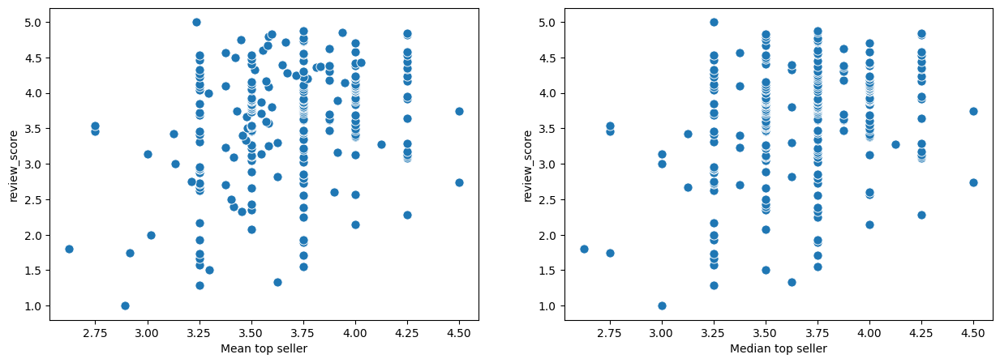

In [ ]:
#plotting mean and median top sellers related to the review score
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_seller, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean top seller")

sns.scatterplot(data=stats_seller, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median top seller")

In [ ]:
# independent variable
X = stats_seller['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_seller['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean top seller', ylabel='review_score'>

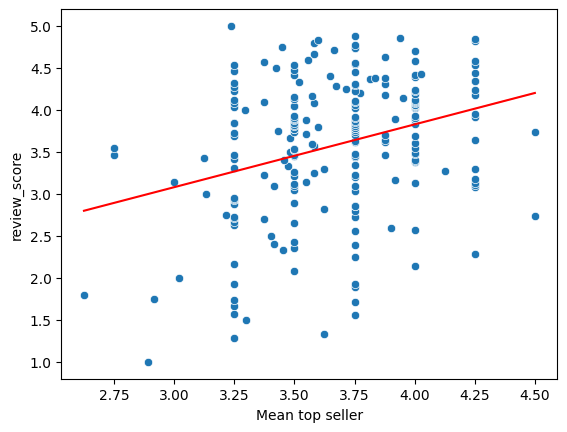

In [ ]:
sns.scatterplot(data=stats_seller, x='mean', y='review_score')
plt.xlabel("Mean top seller")

sns.lineplot(data=stats_seller,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_seller['mean'].values.reshape(-1, 1)
y = stats_seller['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.093
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     23.09
Date:                Tue, 09 Jul 2024   Prob (F-statistic):           2.83e-06
Time:                        13:51:55   Log-Likelihood:                -265.05
No. Observations:                 226   AIC:                             534.1
Df Residuals:                     224   BIC:                             540.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8366      0.573      1.460      0.1

## Linear regression categorical

In [ ]:
#Regression using the final seller categorical score
seller_cat_stat=df_no_duplicate_reviews_merged.groupby('seller_id').agg({'review_score':'mean','seller_total_score':'max','seller_cat_type':'max'}).reset_index()
seller_cat_stat=seller_cat_stat.dropna()
seller_cat_stat

,seller_id,review_score,seller_total_score,seller_cat_type
0,0015a82c2db000af6aaaf3ae2ecb0532,3.666667,3.00,B. Standard
1,001cca7ae9ae17fb1caed9dfb1094831,3.902542,4.00,D. Premium
3,002100f778ceb8431b7a1020ff7ab48f,3.981818,2.75,B. Standard
4,003554e2dce176b5555353e4f3555ac8,5.000000,2.50,B. Standard
5,004c9cd9d87a3c30c522c48c4fc07416,4.132530,3.75,D. Premium
...,...,...,...,...
3086,ffc470761de7d0232558ba5e786e57b7,4.300000,3.50,C. Above Standard
3088,ffdd9f82b9a447f6f8d4b91554cc7dd3,4.250000,4.00,D. Premium
3089,ffeee66ac5d5a62fe688b9d26f83f534,4.214286,3.25,C. Above Standard
3090,fffd5413c0700ac820c7069d66d98c89,3.866667,4.00,D. Premium


In [ ]:
seller_cat_stat=seller_cat_stat.dropna()

In [ ]:
reg_sm = smf.ols(formula=("review_score ~ C(seller_cat_type)"),
                 data=seller_cat_stat).fit()

In [ ]:
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     12.01
Date:                Tue, 09 Jul 2024   Prob (F-statistic):           1.10e-09
Time:                        13:54:53   Log-Likelihood:                -3610.8
No. Observations:                2967   AIC:                             7232.
Df Residuals:                    2962   BIC:                             7262.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------

## Logistics regression

In [ ]:
df_seller_log=df_no_duplicate_reviews_merged.dropna()

In [ ]:
df_seller_log=df_seller_log[['seller_id','review_score','seller_cat_type']]
df_seller_log

,seller_id,review_score,seller_cat_type
5876,955fee9216a65b617aa5c0531780ce60,4.0,D. Premium
5877,da8622b14eb17ae2831f4ac5b9dab84a,5.0,D. Premium
5879,0df3984f9dfb3d49ac6366acbd3bbb85,5.0,E. Top Rated
5881,ececbfcff9804a2d6b40f589df8eef2b,5.0,C. Above Standard
5883,ececbfcff9804a2d6b40f589df8eef2b,5.0,C. Above Standard
...,...,...,...
112743,6bbcb8924baf70b7fe2fe2097e8cd407,5.0,D. Premium
112745,f88adb15807168d3c43d71021090ce4a,2.0,C. Above Standard
112747,c3aad7dc65449ae90a5e9c3c6c1e78e0,3.0,C. Above Standard
112750,c3aad7dc65449ae90a5e9c3c6c1e78e0,5.0,C. Above Standard


In [ ]:
#logistics regression using the categorical seller score which is encoded with label encoder
df_seller_log['seller_rank']=label_encoder.fit_transform(df_seller_log['seller_cat_type'])

In [ ]:
df_seller_log['satisfied']=0
df_seller_log.loc[df_seller_log['review_score']>=4,'satisfied']=1
df_seller_log.head()

,seller_id,review_score,seller_cat_type,seller_rank,satisfied
5876,955fee9216a65b617aa5c0531780ce60,4.0,D. Premium,3,1
5877,da8622b14eb17ae2831f4ac5b9dab84a,5.0,D. Premium,3,1
5879,0df3984f9dfb3d49ac6366acbd3bbb85,5.0,E. Top Rated,4,1
5881,ececbfcff9804a2d6b40f589df8eef2b,5.0,C. Above Standard,2,1
5883,ececbfcff9804a2d6b40f589df8eef2b,5.0,C. Above Standard,2,1


In [ ]:
no_nans_mask = ~df_seller_log['seller_rank'].isna()

X = df_seller_log.loc[no_nans_mask]['seller_rank'].values.reshape(-1, 1)
y = df_seller_log.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

Intercept logistics regression: [0.4551713]
Coefficients logistics regression: [[0.12233172]]


True

<Axes: xlabel='seller_rank', ylabel='satisfied'>

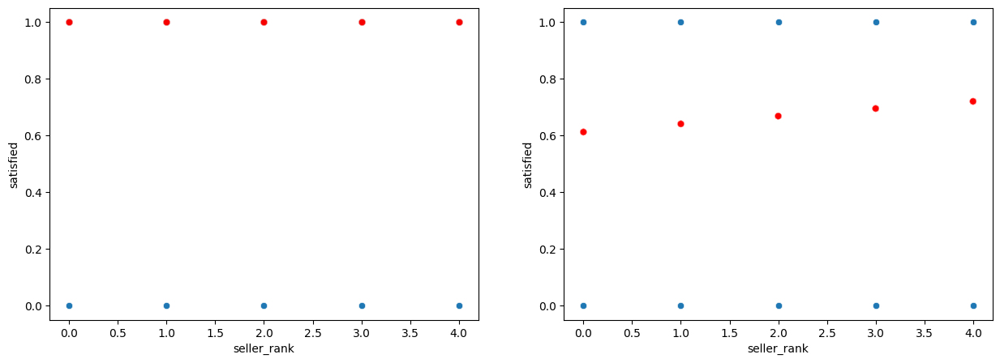

In [ ]:
#plotting logistics regression
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=df_seller_log.loc[no_nans_mask],
                x='seller_rank',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=df_seller_log.loc[no_nans_mask],
                x='seller_rank',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=df_seller_log.loc[no_nans_mask],
                x='seller_rank',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=df_seller_log.loc[no_nans_mask],
                x='seller_rank',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

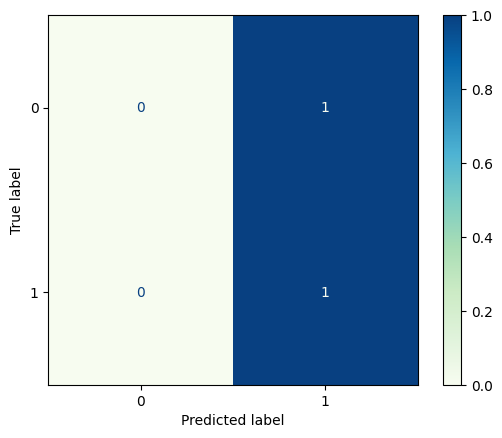

In [ ]:
#plottnig confusion matrix
accuracy_score(df_seller_log.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(df_seller_log.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = df_seller_log.loc[no_nans_mask]['seller_rank'].values.reshape(-1, 1)
y = df_seller_log.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.623780
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                11158
Model:                          Logit   Df Residuals:                    11156
Method:                           MLE   Df Model:                            1
Date:                Tue, 09 Jul 2024   Pseudo R-squ.:                0.001722
Time:                        13:55:55   Log-Likelihood:                -6960.1
converged:                       True   LL-Null:                       -6972.1
Covariance Type:            nonrobust   LLR p-value:                 9.545e-07
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4550      0.066      6.866      0.000       0.325       0.585
x1             0.1224      0.

# Top product category

## Linear regression

In [ ]:
df_prod_cat=df_no_duplicate_reviews_merged.dropna()

In [ ]:
product_cat_with_review=df_prod_cat.groupby('product_category_name_english_clean').agg({'review_score':'mean','product_category_total_score':'mean'}).reset_index()
product_cat_with_review

,product_category_name_english_clean,review_score,product_category_total_score
0,agro_industry_and_commerce,3.600000,2.6
1,air_conditioning,3.138889,3.0
2,art,3.647059,2.2
3,arts_and_craftmanship,3.000000,2.2
4,audio,3.722222,2.2
...,...,...,...
60,stationery,4.261538,2.4
61,tablets_printing_image,5.000000,1.6
62,telephony,3.714953,2.8
63,toys,3.988327,3.0


In [ ]:
#Regression using the final product category score
stats_top_products=product_cat_with_review.groupby('review_score')['product_category_total_score'].agg(['mean','count','median','std','min','max']).reset_index()
stats_top_products

,review_score,mean,count,median,std,min,max
0,2.000000,1.600000,1,1.6,NaN,1.6,1.6
1,2.916667,2.600000,1,2.6,NaN,2.6,2.6
2,3.000000,1.600000,3,1.8,0.721110,0.8,2.2
3,3.055000,3.000000,1,3.0,NaN,3.0,3.0
4,3.138889,3.000000,1,3.0,NaN,3.0,3.0
5,3.166667,1.600000,1,1.6,NaN,1.6,1.6
6,3.305556,3.200000,1,3.2,NaN,3.2,3.2
7,3.352941,3.400000,1,3.4,NaN,3.4,3.4
8,3.438596,2.200000,1,2.2,NaN,2.2,2.2
9,3.444444,3.200000,1,3.2,NaN,3.2,3.2


Text(0.5, 0, 'Median top product')

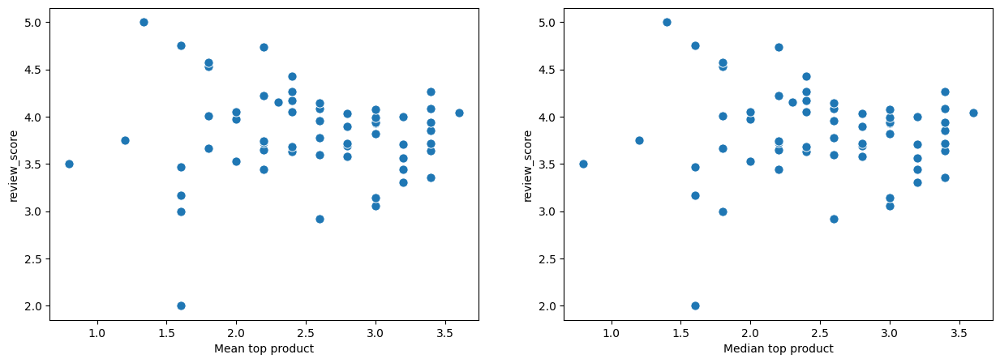

In [ ]:
#plotting mean and median top product category related to the review score
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))


sns.scatterplot(data=stats_top_products, x='mean', y='review_score',
                ax=axes[0], s=65)
axes[0].set_xlabel("Mean top product")

sns.scatterplot(data=stats_top_products, x='median', y='review_score',
                ax=axes[1], s=65)
axes[1].set_xlabel("Median top product")

In [ ]:
# independent variable
X = stats_top_products['mean'].values.reshape(-1, 1)

# dependent variable
y = stats_top_products['review_score']

reg = LinearRegression().fit(X, y)

In [ ]:
review_score_predicted = reg.predict(X)

<Axes: xlabel='Mean top product cat', ylabel='review_score'>

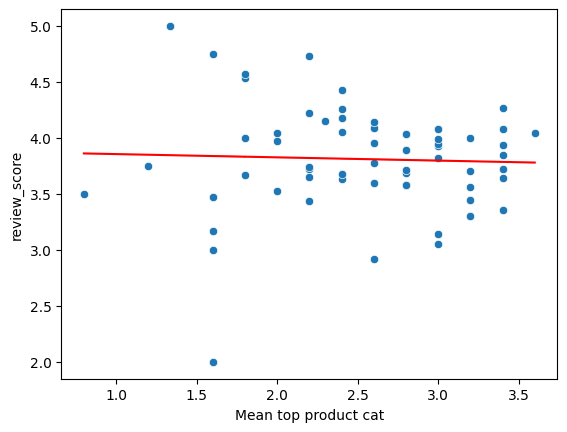

In [ ]:
sns.scatterplot(data=stats_top_products, x='mean', y='review_score')
plt.xlabel("Mean top product cat")

sns.lineplot(data=stats_top_products,
             x='mean',
             y=review_score_predicted,
             color='red')

In [ ]:
X = stats_top_products['mean'].values.reshape(-1, 1)
y = stats_top_products['review_score']
X_with_constant = sm.add_constant(X)
reg_sm = sm.OLS(y, X_with_constant).fit()
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.016
Method:                 Least Squares   F-statistic:                   0.08880
Date:                Tue, 09 Jul 2024   Prob (F-statistic):              0.767
Time:                        14:40:44   Log-Likelihood:                -41.047
No. Observations:                  60   AIC:                             86.09
Df Residuals:                      58   BIC:                             90.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.8847      0.254     15.303      0.0

## Linear regression categorical

In [ ]:
#Regression using the final product category categorical score
product_cat_stat=df_no_duplicate_reviews_merged.groupby('product_id').agg({'review_score':'mean','product_cat_type':'max'}).reset_index()
product_cat_stat

,product_id,review_score,product_cat_type
0,00066f42aeeb9f3007548bb9d3f33c38,5.0,C. Above Standard
1,00088930e925c41fd95ebfe695fd2655,4.0,E. Top Rated
2,0009406fd7479715e4bef61dd91f2462,1.0,B. Standard
3,000b8f95fcb9e0096488278317764d19,5.0,C. Above Standard
4,000d9be29b5207b54e86aa1b1ac54872,5.0,E. Top Rated
...,...,...,...
32934,fff6177642830a9a94a0f2cba5e476d1,4.5,E. Top Rated
32935,fff81cc3158d2725c0655ab9ba0f712c,4.0,D. Premium
32936,fff9553ac224cec9d15d49f5a263411f,5.0,C. Above Standard
32937,fffdb2d0ec8d6a61f0a0a0db3f25b441,5.0,C. Above Standard


In [ ]:
reg_sm = smf.ols(formula=("review_score ~ C(product_cat_type)"),
                 data=product_cat_stat).fit()

In [ ]:
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     18.97
Date:                Tue, 09 Jul 2024   Prob (F-statistic):           1.35e-15
Time:                        14:40:49   Log-Likelihood:                -52833.
No. Observations:               32777   AIC:                         1.057e+05
Df Residuals:                   32772   BIC:                         1.057e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

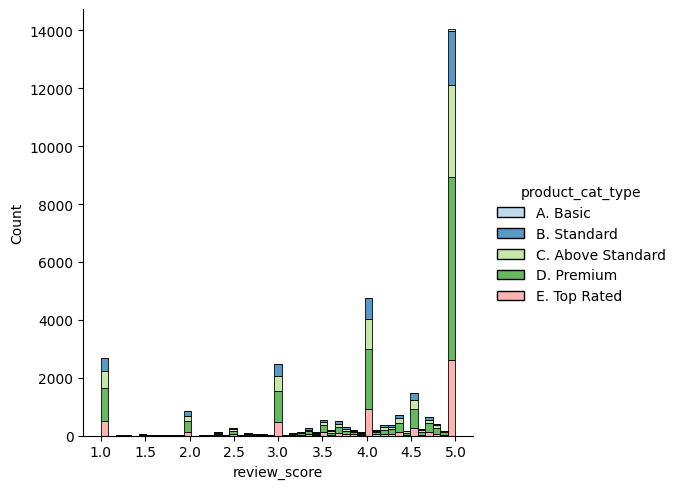

In [ ]:
sns.displot(product_cat_stat, x="review_score", hue="product_cat_type", multiple="stack",palette="Paired")

## Logistics regression

In [ ]:
df_prodcat_log=df_no_duplicate_reviews_merged.groupby('product_category_name_english_clean').agg({'review_score':'mean','order_id':'count','product_description_lenght_2':'mean','product_photos_qty_2':'mean','payment_value':'mean','product_cat_type':'max'}).reset_index()
df_prodcat_log

,product_category_name_english_clean,review_score,order_id,product_description_lenght_2,product_photos_qty_2,payment_value,product_cat_type
0,agro_industry_and_commerce,4.000000,212,865.518868,2.349057,369.689009,D. Premium
1,air_conditioning,3.969178,297,1050.919192,2.356902,207.993906,D. Premium
2,art,3.937198,209,953.913876,1.889952,135.156986,C. Above Standard
3,arts_and_craftmanship,4.125000,24,792.208333,3.708333,91.005833,C. Above Standard
4,audio,3.833333,364,782.939560,1.870879,154.942143,C. Above Standard
...,...,...,...,...,...,...,...
65,stationery,4.196078,2517,405.096941,2.890743,110.346329,C. Above Standard
66,tablets_printing_image,4.123457,83,535.975904,1.867470,105.477229,B. Standard
67,telephony,3.945898,4543,759.923179,2.903588,86.893304,D. Premium
68,toys,4.159520,4115,659.649332,2.785176,136.344279,D. Premium


In [ ]:
#logistics regression using the categorical product category score which is encoded with label encoder
stats_product_cat=df_prodcat_log.groupby('product_category_name_english_clean').agg({'product_cat_type':'max','review_score':'mean'}).reset_index()
stats_product_cat

,product_category_name_english_clean,product_cat_type,review_score
0,agro_industry_and_commerce,D. Premium,4.000000
1,air_conditioning,D. Premium,3.969178
2,art,C. Above Standard,3.937198
3,arts_and_craftmanship,C. Above Standard,4.125000
4,audio,C. Above Standard,3.833333
...,...,...,...
65,stationery,C. Above Standard,4.196078
66,tablets_printing_image,B. Standard,4.123457
67,telephony,D. Premium,3.945898
68,toys,D. Premium,4.159520


In [ ]:
stats_product_cat['product_cat_rank']=label_encoder.fit_transform(stats_product_cat['product_cat_type'])

In [ ]:
stats_product_cat['satisfied']=0
stats_product_cat.loc[stats_product_cat['review_score']>=4,'satisfied']=1
stats_product_cat.head()

,product_category_name_english_clean,product_cat_type,review_score,product_cat_rank,satisfied
0,agro_industry_and_commerce,D. Premium,4.000000,3,1
1,air_conditioning,D. Premium,3.969178,3,0
2,art,C. Above Standard,3.937198,2,0
3,arts_and_craftmanship,C. Above Standard,4.125000,2,1
4,audio,C. Above Standard,3.833333,2,0


<Axes: xlabel='product_cat_rank_log', ylabel='Probability'>

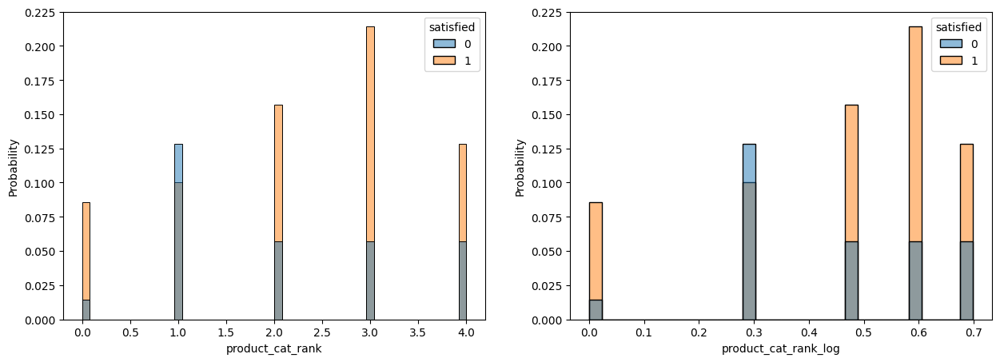

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(data=stats_product_cat,
             x='product_cat_rank',
             hue='satisfied', # hue tells us to color two different histograms based on the value of 'satisfied'
             bins=50,
             ax=axes[0],
             stat='probability')

# add +1 to deal with 0s
stats_product_cat['product_cat_rank_log'] = np.log10(stats_product_cat['product_cat_rank']+1)

sns.histplot(data=stats_product_cat,
             x='product_cat_rank_log',
             hue='satisfied',
             bins=30,
             ax=axes[1],
             stat='probability')

In [ ]:
no_nans_mask = ~stats_product_cat['product_cat_rank_log'].isna()

X = stats_product_cat.loc[no_nans_mask]['product_cat_rank'].values.reshape(-1, 1)
y = stats_product_cat.loc[no_nans_mask]['satisfied']

logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

Intercept logistics regression: [0.45913181]
Coefficients logistics regression: [[0.14788992]]


True

<Axes: xlabel='product_cat_rank', ylabel='satisfied'>

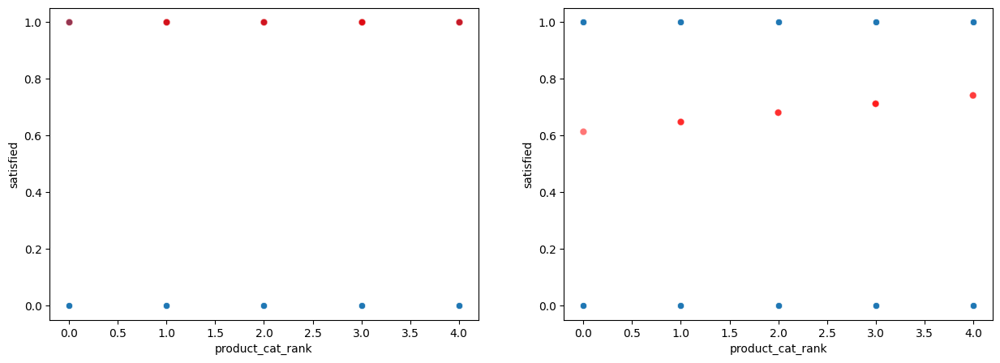

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_product_cat.loc[no_nans_mask],
                x='product_cat_rank',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_product_cat.loc[no_nans_mask],
                x='product_cat_rank',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_product_cat.loc[no_nans_mask],
                x='product_cat_rank',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_product_cat.loc[no_nans_mask],
                x='product_cat_rank',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

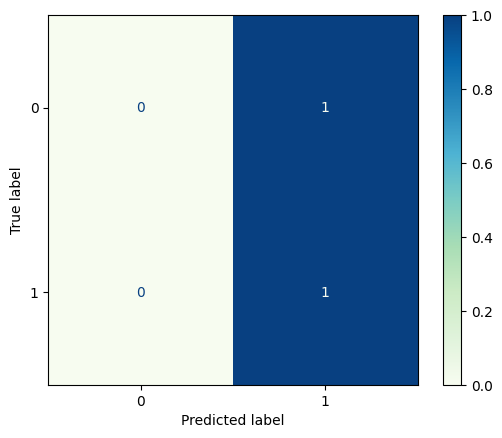

In [ ]:
accuracy_score(stats_product_cat.loc[no_nans_mask]['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(stats_product_cat.loc[no_nans_mask]['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X = stats_product_cat.loc[no_nans_mask]['product_cat_rank'].values.reshape(-1, 1)
y = stats_product_cat.loc[no_nans_mask]['satisfied']
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.618399
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                   70
Model:                          Logit   Df Residuals:                       68
Method:                           MLE   Df Model:                            1
Date:                Tue, 09 Jul 2024   Pseudo R-squ.:                0.006567
Time:                        14:40:57   Log-Likelihood:                -43.288
converged:                       True   LL-Null:                       -43.574
Covariance Type:            nonrobust   LLR p-value:                    0.4493
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4455      0.506      0.881      0.378      -0.545       1.436
x1             0.1543      0.

# Y-data profiling - html report

In [ ]:
#Ydata profiling extracted as html as iframe doesn't show results
#profile = ProfileReport(df_no_duplicate_reviews_merged, title="Profiling Report")
#profile

import ydata_profiling

profile = ydata_profiling.ProfileReport(df_no_duplicate_reviews_merged)
profile.to_file("report.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Multilinear regression

In [ ]:
#Setting database with the factors that will be analysed
stats_multiple_reg=df_no_duplicate_reviews_merged.groupby('order_id')[['review_score','total_delivery','order_delay','order_size','product_weight_g','product_length_cm','product_width_cm','product_description_lenght_2','product_photos_qty_2','freight_value','price','payment_value','same_state','seller_total_score','product_category_total_score']].mean()
stats_multiple_reg

,review_score,total_delivery,order_delay,order_size,product_weight_g,product_length_cm,product_width_cm,product_description_lenght_2,product_photos_qty_2,freight_value,price,payment_value,same_state,seller_total_score,product_category_total_score
order_id,,,,,,,,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,5.0,7.0,-9.0,1.0,650.0,28.0,14.0,598.0,4.0,13.29,58.90,72.19,0.0,3.75,3.4
00018f77f2f0320c557190d7a144bdd3,4.0,16.0,-3.0,1.0,30000.0,50.0,40.0,239.0,2.0,19.93,239.90,259.83,1.0,3.50,3.0
000229ec398224ef6ca0657da4fc703e,5.0,7.0,-14.0,1.0,3050.0,33.0,33.0,695.0,2.0,17.87,199.00,216.87,1.0,4.00,2.8
00024acbcdf0a6daa1e931b038114c75,4.0,6.0,-6.0,1.0,200.0,16.0,15.0,480.0,1.0,12.79,12.99,25.78,1.0,3.25,2.4
00042b26cf59d7ce69dfabb4e55b4fd9,5.0,25.0,-16.0,1.0,3750.0,35.0,30.0,409.0,1.0,18.14,199.90,218.04,0.0,3.50,2.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,5.0,17.0,-8.0,1.0,10150.0,89.0,40.0,1002.0,3.0,43.41,299.99,343.40,0.0,4.25,2.4
fffcd46ef2263f404302a634eb57f7eb,5.0,9.0,-9.0,1.0,8950.0,45.0,38.0,232.0,1.0,36.53,350.00,386.53,0.0,3.50,2.4
fffce4705a9662cd70adb13d4a31832d,5.0,4.0,-13.0,1.0,967.0,21.0,19.0,869.0,1.0,16.95,99.90,116.85,0.0,4.50,3.0


In [ ]:
from scipy import stats

independent_variables = ['product_weight_g',
                         'freight_value',
                         'seller_total_score',
                         'product_category_total_score',
                         'price','order_size']


df_review_stats_extended = stats_multiple_reg.groupby('review_score')[independent_variables]\
                      .agg(mean_product_weight=('product_weight_g', 'mean'),
                           mean_freight=('freight_value', 'mean'),
                           mean_seller_score=('seller_total_score', 'mean'),
                           mean_product_category_score=('product_category_total_score', 'mean'),
                           mean_price=('price', 'mean'),
                           mean_order_size=('order_size', 'mean')
                           )\
                      .reset_index()

In [ ]:
df_review_stats_extended

,review_score,mean_product_weight,mean_freight,mean_seller_score,mean_product_category_score,mean_price,mean_order_size
0,1.0,2345.359764,21.695952,3.618517,2.672847,138.626251,1.306732
1,2.0,2298.100258,21.195460,3.660723,2.659403,123.398858,1.252282
2,3.0,2173.273868,20.354321,3.661621,2.679776,114.033128,1.160312
3,4.0,2119.819023,20.251511,3.681211,2.692917,122.845798,1.114935
4,5.0,2019.826453,19.801224,3.694305,2.704604,126.024254,1.109241


Text(0.5, 0, 'Mean size')

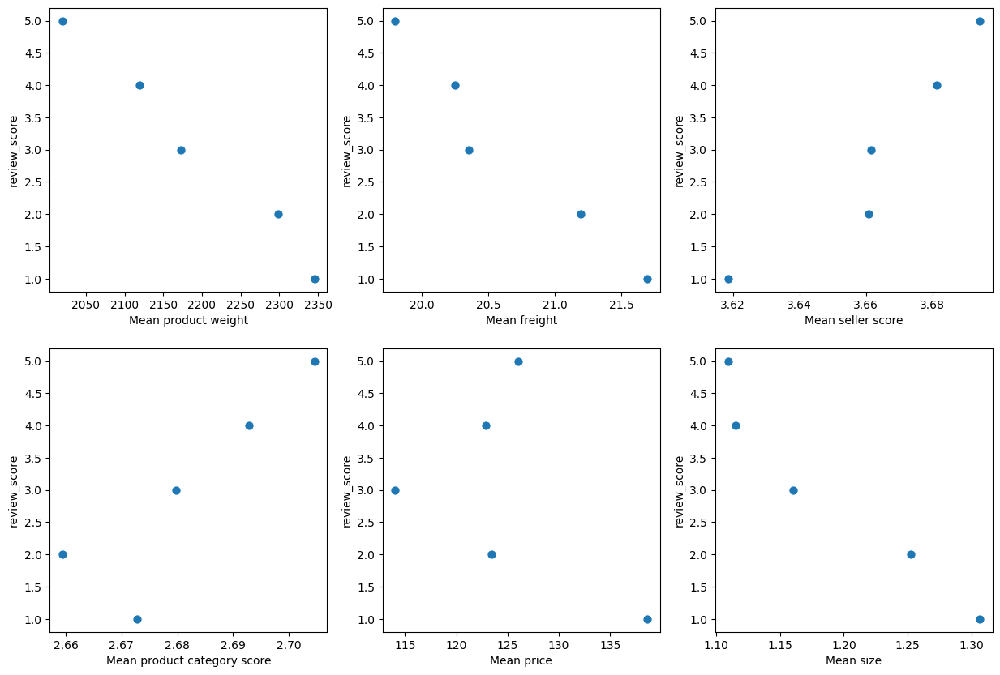

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))


sns.scatterplot(data=df_review_stats_extended,
                x='mean_product_weight',
                y='review_score',
                ax=axes[0][0], s=65
                )

axes[0][0].set_xlabel("Mean product weight")

sns.scatterplot(data=df_review_stats_extended,
                x='mean_freight',
                y='review_score',
                ax=axes[0][1], s=65)

axes[0][1].set_xlabel("Mean freight")


sns.scatterplot(data=df_review_stats_extended,
                x='mean_seller_score',
                y='review_score',
                ax=axes[0][2], s=65)

axes[0][2].set_xlabel("Mean seller score")

sns.scatterplot(data=df_review_stats_extended,
                x='mean_product_category_score',
                y='review_score',
                ax=axes[1][0], s=65)

axes[1][0].set_xlabel("Mean product category score")

sns.scatterplot(data=df_review_stats_extended,
                x='mean_price',
                y='review_score',
                ax=axes[1][1], s=65)

axes[1][1].set_xlabel("Mean price")

sns.scatterplot(data=df_review_stats_extended,
                x='mean_order_size',
                y='review_score',
                ax=axes[1][2], s=65)

axes[1][2].set_xlabel("Mean size")


<Axes: xlabel='Mean product weight', ylabel='review_score'>

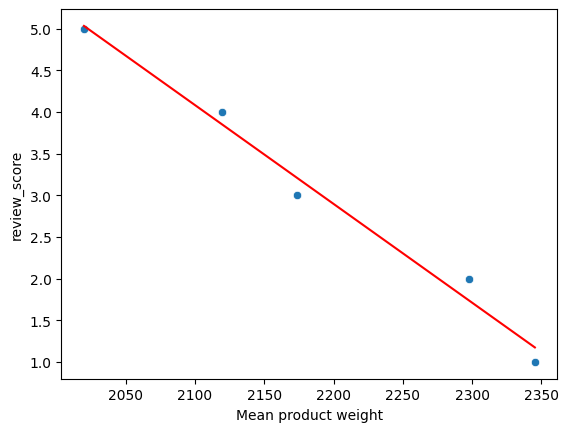

In [ ]:
# independent variable
X = df_review_stats_extended['mean_product_weight'].values.reshape(-1, 1)

# dependent variable
y = df_review_stats_extended['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=df_review_stats_extended, x='mean_product_weight', y='review_score')
plt.xlabel("Mean product weight")

sns.lineplot(data=df_review_stats_extended,
             x='mean_product_weight',
             y=review_score_predicted,
             color='red')

<Axes: xlabel='Mean freight', ylabel='review_score'>

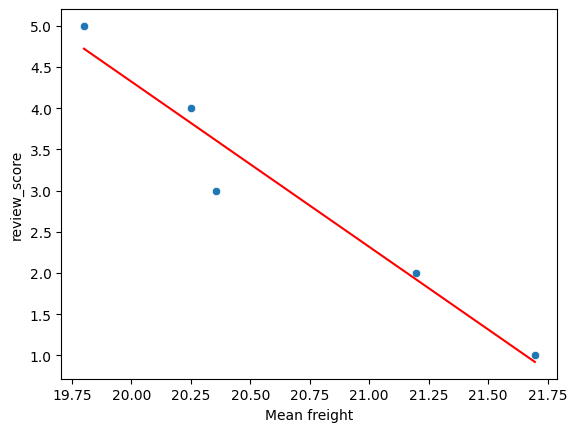

In [ ]:
# independent variable
X = df_review_stats_extended['mean_freight'].values.reshape(-1, 1)

# dependent variable
y = df_review_stats_extended['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=df_review_stats_extended, x='mean_freight', y='review_score')
plt.xlabel("Mean freight")

sns.lineplot(data=df_review_stats_extended,
             x='mean_freight',
             y=review_score_predicted,
             color='red')

<Axes: xlabel='Mean seller score', ylabel='review_score'>

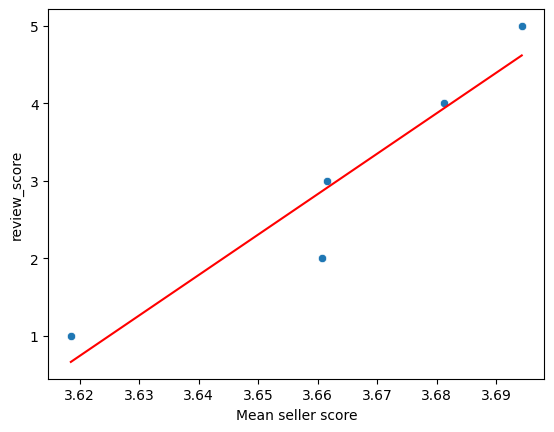

In [ ]:
# independent variable
X = df_review_stats_extended['mean_seller_score'].values.reshape(-1, 1)

# dependent variable
y = df_review_stats_extended['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=df_review_stats_extended, x='mean_seller_score', y='review_score')
plt.xlabel("Mean seller score")

sns.lineplot(data=df_review_stats_extended,
             x='mean_seller_score',
             y=review_score_predicted,
             color='red')

<Axes: xlabel='Mean product category score', ylabel='review_score'>

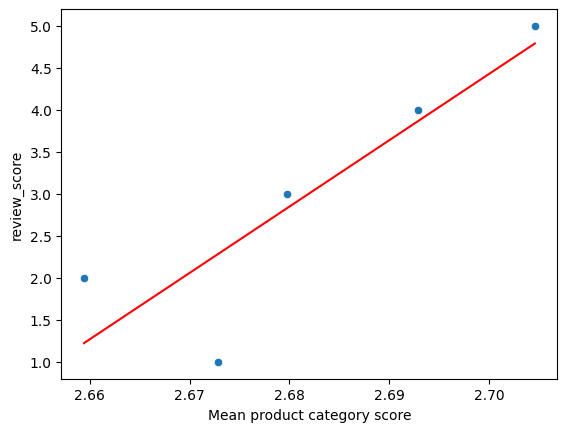

In [ ]:
# independent variable
X = df_review_stats_extended['mean_product_category_score'].values.reshape(-1, 1)

# dependent variable
y = df_review_stats_extended['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=df_review_stats_extended, x='mean_product_category_score', y='review_score')
plt.xlabel("Mean product category score")

sns.lineplot(data=df_review_stats_extended,
             x='mean_product_category_score',
             y=review_score_predicted,
             color='red')

<Axes: xlabel='Mean price', ylabel='review_score'>

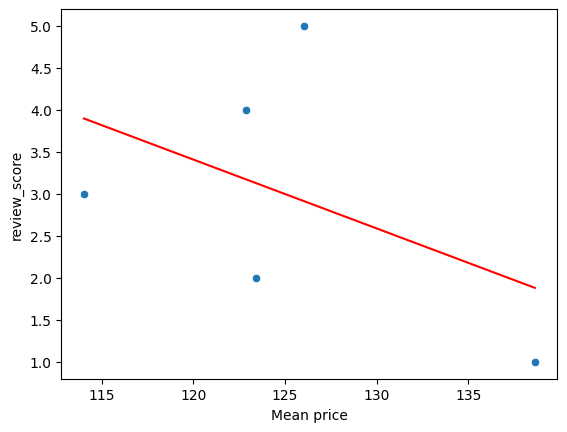

In [ ]:
# independent variable
X = df_review_stats_extended['mean_price'].values.reshape(-1, 1)

# dependent variable
y = df_review_stats_extended['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=df_review_stats_extended, x='mean_price', y='review_score')
plt.xlabel("Mean price")

sns.lineplot(data=df_review_stats_extended,
             x='mean_price',
             y=review_score_predicted,
             color='red')

<Axes: xlabel='Mean order size', ylabel='review_score'>

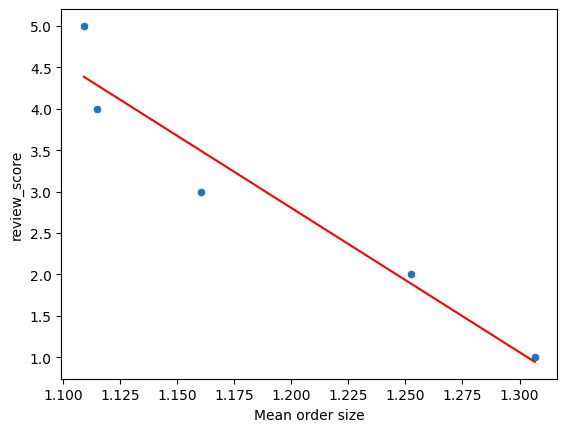

In [ ]:
# independent variable
X = df_review_stats_extended['mean_order_size'].values.reshape(-1, 1)

# dependent variable
y = df_review_stats_extended['review_score']

reg = LinearRegression().fit(X, y)

review_score_predicted = reg.predict(X)

sns.scatterplot(data=df_review_stats_extended, x='mean_order_size', y='review_score')
plt.xlabel("Mean order size")

sns.lineplot(data=df_review_stats_extended,
             x='mean_order_size',
             y=review_score_predicted,
             color='red')

In [ ]:
import statsmodels.formula.api as smf

In [ ]:
reg_sm = smf.ols(formula=("review_score ~ mean_product_weight + "
                          "               mean_freight+ "
                          "               mean_seller_score+ "
                          "               mean_product_category_score+"
                          "               mean_price+"
                          "               mean_order_size"),
                 data=df_review_stats_extended).fit()

In [ ]:
print(reg_sm.summary())

                            OLS Regression Results                            
Dep. Variable:           review_score   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Tue, 09 Jul 2024   Prob (F-statistic):                nan
Time:                        14:05:57   Log-Likelihood:                 131.30
No. Observations:                   5   AIC:                            -252.6
Df Residuals:                       0   BIC:                            -254.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1796: RuntimeWarning: divide by zero encountered in divide
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1796: RuntimeWarning: invalid value encountered in scalar multiply
  return 1 - (np.divide(self.nobs - self.k_constant, self.df_resid)
/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1718: RuntimeWarning: divide by zero encountered in scalar divide
  return np.dot(wresid, wresid) / self.df_resid


# Multilogistics regression

In [ ]:
stats.isnull().sum()

total_time_from_approval_to_delivery    2348
total_delivery                          2348
review_score                             754
order_delay                             2348
order_approval_time                      146
order_approval_time_sec                  146
to_carrier_delivery_time                1172
carrier_customer_delivery_time          2348
order_size                               172
product_weight_g                           0
product_length_cm                        188
product_width_cm                         188
product_description_lenght_2               0
product_photos_qty_2                       0
freight_value                            172
seller_total_score                       337
product_category_total_score               0
same_state                                 0
payment_value                            172
price                                    172
satisfied                                  0
dtype: int64

In [ ]:
stats.shape

(98803, 22)

In [ ]:
#creating new dataframe for the multiple logistics regression wuth no NA
stats_multiple=stats.dropna().copy()

In [ ]:
stats_multiple.isnull().sum()

total_time_from_approval_to_delivery    0
total_delivery                          0
review_score                            0
order_delay                             0
order_approval_time                     0
order_approval_time_sec                 0
to_carrier_delivery_time                0
carrier_customer_delivery_time          0
order_size                              0
product_weight_g                        0
product_length_cm                       0
product_width_cm                        0
product_description_lenght_2            0
product_photos_qty_2                    0
freight_value                           0
seller_total_score                      0
product_category_total_score            0
same_state                              0
payment_value                           0
price                                   0
satisfied                               0
dtype: int64

In [ ]:
stats_multiple.shape

(95793, 22)

## Multilogistics - price, weight, freight

In [ ]:
X=stats_multiple[['total_delivery','price','product_weight_g','freight_value']]
X

,total_delivery,price,product_weight_g,freight_value
order_id,,,,
00010242fe8c5a6d1ba2dd792cb16214,7.0,58.90,650.0,13.29
00018f77f2f0320c557190d7a144bdd3,16.0,239.90,30000.0,19.93
000229ec398224ef6ca0657da4fc703e,7.0,199.00,3050.0,17.87
00024acbcdf0a6daa1e931b038114c75,6.0,12.99,200.0,12.79
00042b26cf59d7ce69dfabb4e55b4fd9,25.0,199.90,3750.0,18.14
...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,17.0,299.99,10150.0,43.41
fffcd46ef2263f404302a634eb57f7eb,9.0,350.00,8950.0,36.53
fffce4705a9662cd70adb13d4a31832d,4.0,99.90,967.0,16.95


In [ ]:
y=stats_multiple['satisfied']
y

order_id
00010242fe8c5a6d1ba2dd792cb16214    1
00018f77f2f0320c557190d7a144bdd3    1
000229ec398224ef6ca0657da4fc703e    1
00024acbcdf0a6daa1e931b038114c75    1
00042b26cf59d7ce69dfabb4e55b4fd9    1
                                   ..
fffc94f6ce00a00581880bf54a75a037    1
fffcd46ef2263f404302a634eb57f7eb    1
fffce4705a9662cd70adb13d4a31832d    1
fffe18544ffabc95dfada21779c9644f    1
fffe41c64501cc87c801fd61db3f6244    1
Name: satisfied, Length: 95793, dtype: int64

In [ ]:
logistics_reg = LogisticRegression(random_state=42).fit(X, y)

In [ ]:
print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [2.18320982]
Coefficients logistics regression: [[-7.74791318e-02  1.43733825e-04 -2.68306900e-05  9.91301617e-03]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='freight_value', ylabel='satisfied'>

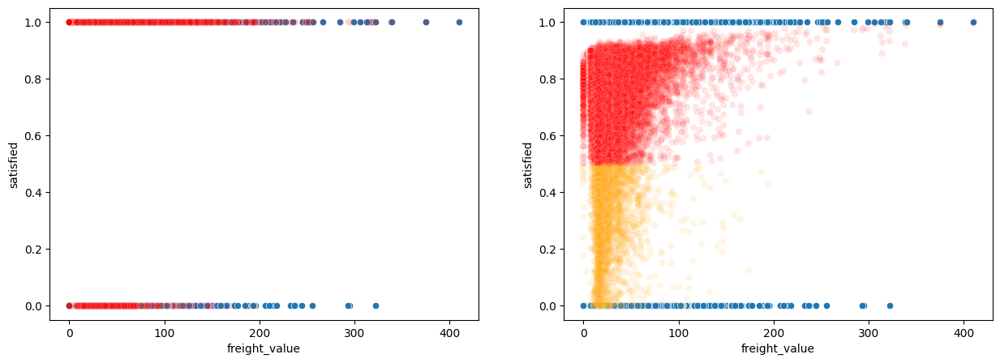

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_multiple,
                x='freight_value',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_multiple,
                x='freight_value',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_multiple,
                x='freight_value',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_multiple,
                x='freight_value',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

<Axes: xlabel='product_weight_g', ylabel='satisfied'>

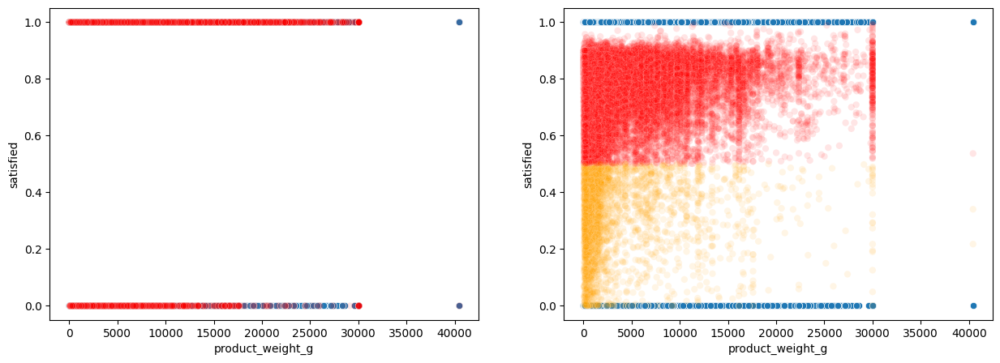

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_multiple,
                x='product_weight_g',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_multiple,
                x='product_weight_g',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_multiple,
                x='product_weight_g',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_multiple,
                x='product_weight_g',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

<Axes: xlabel='price', ylabel='satisfied'>

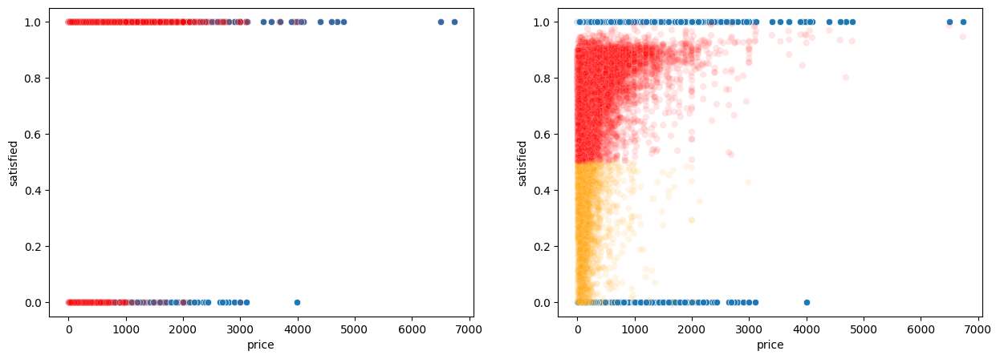

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_multiple,
                x='price',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_multiple,
                x='price',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_multiple,
                x='price',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_multiple,
                x='price',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

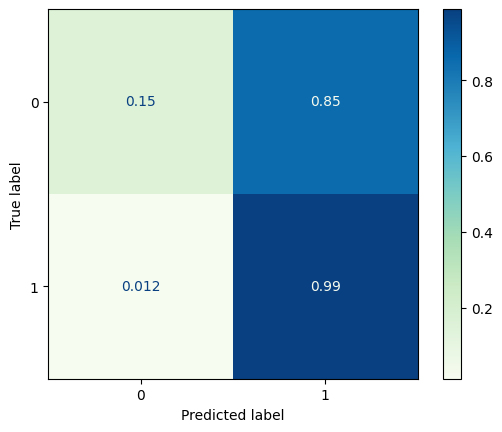

In [ ]:
accuracy_score(stats_multiple['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(stats_multiple['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.473912
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                95793
Model:                          Logit   Df Residuals:                    95788
Method:                           MLE   Df Model:                            4
Date:                Tue, 09 Jul 2024   Pseudo R-squ.:                 0.07956
Time:                        14:07:12   Log-Likelihood:                -45397.
converged:                       True   LL-Null:                       -49321.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                2.1832      0.018    121.987      0.000       2.148       2.218
total_deliv

Running multiple with the other 4 factors

## Multilogistics - size, seller, cat

In [ ]:
X=stats_multiple[['order_delay','order_size','seller_total_score','product_category_total_score']]
X

,order_delay,order_size,seller_total_score,product_category_total_score
order_id,,,,
00010242fe8c5a6d1ba2dd792cb16214,-9.0,1.0,3.75,3.4
00018f77f2f0320c557190d7a144bdd3,-3.0,1.0,3.50,3.0
000229ec398224ef6ca0657da4fc703e,-14.0,1.0,4.00,2.8
00024acbcdf0a6daa1e931b038114c75,-6.0,1.0,3.25,2.4
00042b26cf59d7ce69dfabb4e55b4fd9,-16.0,1.0,3.50,2.8
...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,-8.0,1.0,4.25,2.4
fffcd46ef2263f404302a634eb57f7eb,-9.0,1.0,3.50,2.4
fffce4705a9662cd70adb13d4a31832d,-13.0,1.0,4.50,3.0


In [ ]:
y=stats_multiple['satisfied']
y

order_id
00010242fe8c5a6d1ba2dd792cb16214    1
00018f77f2f0320c557190d7a144bdd3    1
000229ec398224ef6ca0657da4fc703e    1
00024acbcdf0a6daa1e931b038114c75    1
00042b26cf59d7ce69dfabb4e55b4fd9    1
                                   ..
fffc94f6ce00a00581880bf54a75a037    1
fffcd46ef2263f404302a634eb57f7eb    1
fffce4705a9662cd70adb13d4a31832d    1
fffe18544ffabc95dfada21779c9644f    1
fffe41c64501cc87c801fd61db3f6244    1
Name: satisfied, Length: 95793, dtype: int64

In [ ]:
y.to_excel("y.xlsx")

In [ ]:
logistics_reg = LogisticRegression(random_state=42).fit(X, y)

In [ ]:
print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")

Intercept logistics regression: [0.66339098]
Coefficients logistics regression: [[-0.06290364 -0.49170522  0.10412674  0.06817142]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='order_size', ylabel='satisfied'>

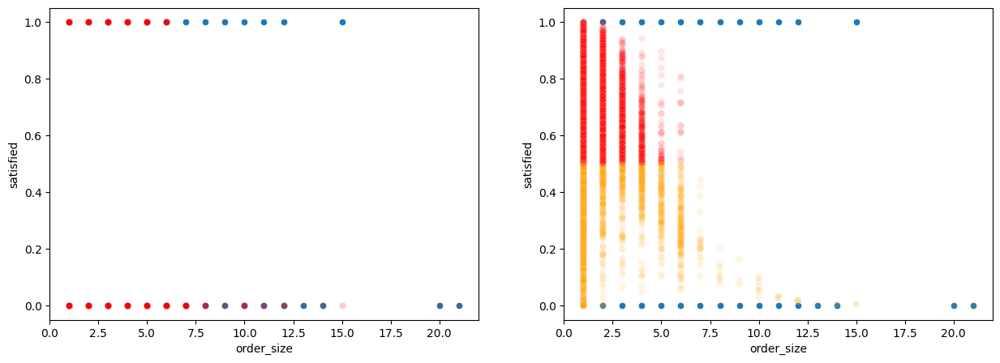

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_multiple,
                x='order_size',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_multiple,
                x='order_size',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_multiple,
                x='order_size',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_multiple,
                x='order_size',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

<Axes: xlabel='seller_total_score', ylabel='satisfied'>

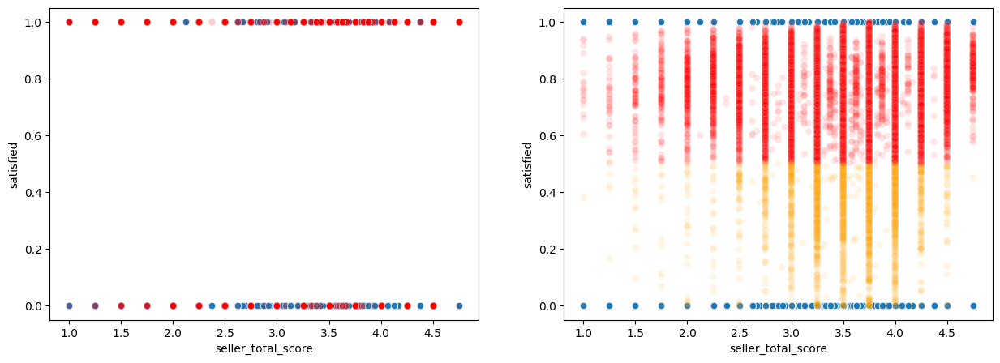

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_multiple,
                x='seller_total_score',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_multiple,
                x='seller_total_score',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_multiple,
                x='seller_total_score',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_multiple,
                x='seller_total_score',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

<Axes: xlabel='product_category_total_score', ylabel='satisfied'>

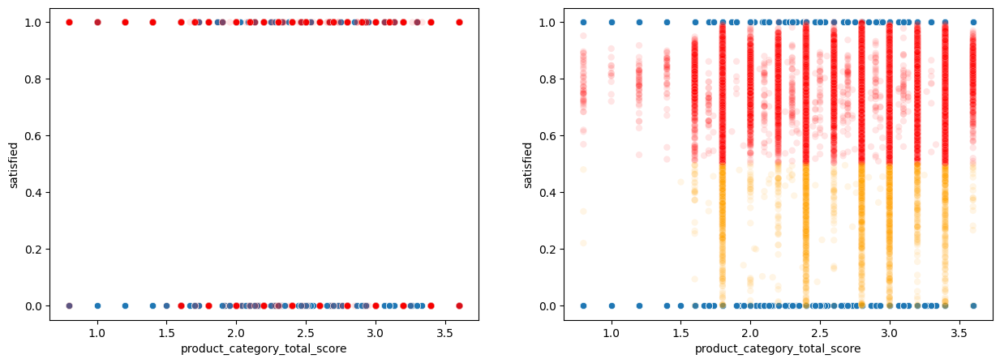

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=stats_multiple,
                x='product_category_total_score',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=stats_multiple,
                x='product_category_total_score',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=stats_multiple,
                x='product_category_total_score',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=stats_multiple,
                x='product_category_total_score',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

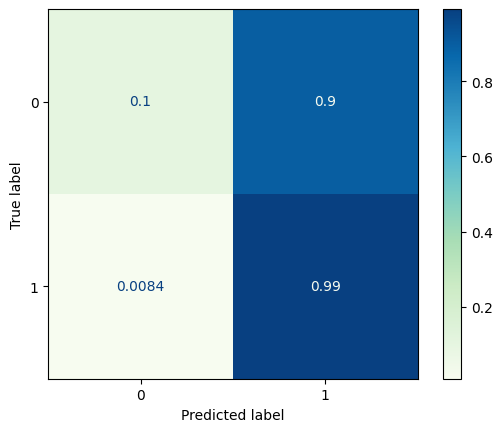

In [ ]:
accuracy_score(stats_multiple['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(stats_multiple['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

Optimization terminated successfully.
         Current function value: 0.480408
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                95793
Model:                          Logit   Df Residuals:                    95788
Method:                           MLE   Df Model:                            4
Date:                Tue, 09 Jul 2024   Pseudo R-squ.:                 0.06694
Time:                        14:39:33   Log-Likelihood:                -46020.
converged:                       True   LL-Null:                       -49321.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                            0.6631      0.079      8.379      0.000

## Multilogistics with scales

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [ ]:
#dataset with scaled data
X=stats_multiple[['total_delivery','order_delay','order_size','product_weight_g','freight_value','seller_total_score','product_category_total_score','same_state','payment_value','review_score']]
X

,total_delivery,order_delay,order_size,product_weight_g,freight_value,seller_total_score,product_category_total_score,product_category_total_score,same_state,payment_value,review_score
order_id,,,,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,7.0,-9.0,1.0,650.0,13.29,3.75,3.4,3.4,0.0,72.19,5.0
00018f77f2f0320c557190d7a144bdd3,16.0,-3.0,1.0,30000.0,19.93,3.50,3.0,3.0,1.0,259.83,4.0
000229ec398224ef6ca0657da4fc703e,7.0,-14.0,1.0,3050.0,17.87,4.00,2.8,2.8,1.0,216.87,5.0
00024acbcdf0a6daa1e931b038114c75,6.0,-6.0,1.0,200.0,12.79,3.25,2.4,2.4,1.0,25.78,4.0
00042b26cf59d7ce69dfabb4e55b4fd9,25.0,-16.0,1.0,3750.0,18.14,3.50,2.8,2.8,0.0,218.04,5.0
...,...,...,...,...,...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,17.0,-8.0,1.0,10150.0,43.41,4.25,2.4,2.4,0.0,343.40,5.0
fffcd46ef2263f404302a634eb57f7eb,9.0,-9.0,1.0,8950.0,36.53,3.50,2.4,2.4,0.0,386.53,5.0
fffce4705a9662cd70adb13d4a31832d,4.0,-13.0,1.0,967.0,16.95,4.50,3.0,3.0,0.0,116.85,5.0


In [ ]:
X_scaler = scaler.fit_transform(X)

In [ ]:
X_scaler_with_column_names = pd.DataFrame(data=X_scaler, columns=X.columns)

In [ ]:
X_scaler_with_column_names

,total_delivery,order_delay,order_size,product_weight_g,freight_value,seller_total_score,product_category_total_score,product_category_total_score,same_state,payment_value,review_score
0,-0.533675,0.287879,-0.264515,-0.386284,-0.437120,0.153629,1.397889,1.397889,-0.750909,-0.373591,0.657034
1,0.417089,0.881259,-0.264515,7.459514,-0.013569,-0.411862,0.603086,0.603086,1.335254,0.586809,-0.121281
2,-0.533675,-0.206604,-0.264515,0.255280,-0.144972,0.719121,0.205685,0.205685,1.335254,0.366926,0.657034
3,-0.639316,0.584569,-0.264515,-0.506577,-0.469014,-0.977354,-0.589118,-0.589118,1.335254,-0.611132,-0.121281
4,1.367852,-0.404397,-0.264515,0.442403,-0.127749,-0.411862,0.205685,0.205685,-0.750909,0.372915,0.657034
...,...,...,...,...,...,...,...,...,...,...,...
95788,0.522729,0.386776,-0.264515,2.153242,1.484171,1.284613,-0.589118,-0.589118,-0.750909,1.014547,0.657034
95789,-0.322394,0.287879,-0.264515,1.832459,1.045310,-0.411862,-0.589118,-0.589118,-0.750909,1.235299,0.657034
95790,-0.850597,-0.107707,-0.264515,-0.301544,-0.203657,1.850104,0.603086,0.603086,-0.750909,-0.145008,0.657034
95791,-1.167518,0.287879,-0.264515,-0.533309,-0.728631,2.415596,-0.589118,-0.589118,1.335254,-0.411876,0.657034


In [ ]:
X_scaler_with_column_names['satisfied']=0
X_scaler_with_column_names.loc[X_scaler_with_column_names['review_score']>=-0.15,'satisfied']=1
X_scaler_with_column_names.head()

,total_delivery,order_delay,order_size,product_weight_g,freight_value,seller_total_score,product_category_total_score,product_category_total_score,same_state,payment_value,review_score,satisfied
0,-0.533675,0.287879,-0.264515,-0.386284,-0.437120,0.153629,1.397889,1.397889,-0.750909,-0.373591,0.657034,1
1,0.417089,0.881259,-0.264515,7.459514,-0.013569,-0.411862,0.603086,0.603086,1.335254,0.586809,-0.121281,1
2,-0.533675,-0.206604,-0.264515,0.255280,-0.144972,0.719121,0.205685,0.205685,1.335254,0.366926,0.657034,1
3,-0.639316,0.584569,-0.264515,-0.506577,-0.469014,-0.977354,-0.589118,-0.589118,1.335254,-0.611132,-0.121281,1
4,1.367852,-0.404397,-0.264515,0.442403,-0.127749,-0.411862,0.205685,0.205685,-0.750909,0.372915,0.657034,1


In [ ]:
X_scaler_with_column_names

,total_delivery,order_delay,order_size,product_weight_g,freight_value,seller_total_score,product_category_total_score,product_category_total_score,same_state,payment_value,review_score,satisfied
0,-0.533675,0.287879,-0.264515,-0.386284,-0.437120,0.153629,1.397889,1.397889,-0.750909,-0.373591,0.657034,1
1,0.417089,0.881259,-0.264515,7.459514,-0.013569,-0.411862,0.603086,0.603086,1.335254,0.586809,-0.121281,1
2,-0.533675,-0.206604,-0.264515,0.255280,-0.144972,0.719121,0.205685,0.205685,1.335254,0.366926,0.657034,1
3,-0.639316,0.584569,-0.264515,-0.506577,-0.469014,-0.977354,-0.589118,-0.589118,1.335254,-0.611132,-0.121281,1
4,1.367852,-0.404397,-0.264515,0.442403,-0.127749,-0.411862,0.205685,0.205685,-0.750909,0.372915,0.657034,1
...,...,...,...,...,...,...,...,...,...,...,...,...
95788,0.522729,0.386776,-0.264515,2.153242,1.484171,1.284613,-0.589118,-0.589118,-0.750909,1.014547,0.657034,1
95789,-0.322394,0.287879,-0.264515,1.832459,1.045310,-0.411862,-0.589118,-0.589118,-0.750909,1.235299,0.657034,1
95790,-0.850597,-0.107707,-0.264515,-0.301544,-0.203657,1.850104,0.603086,0.603086,-0.750909,-0.145008,0.657034,1
95791,-1.167518,0.287879,-0.264515,-0.533309,-0.728631,2.415596,-0.589118,-0.589118,1.335254,-0.411876,0.657034,1


In [ ]:
X_scaler

array([[-0.53367531,  0.28787938, -0.26451545, ..., -0.75090887,
        -0.37359143,  0.65703398],
       [ 0.4170885 ,  0.88125914, -0.26451545, ...,  1.33525389,
         0.58680901, -0.12128146],
       [-0.53367531, -0.20660375, -0.26451545, ...,  1.33525389,
         0.36692624,  0.65703398],
       ...,
       [-0.85059657, -0.10770712, -0.26451545, ..., -0.75090887,
        -0.14500753,  0.65703398],
       [-1.16751784,  0.28787938, -0.26451545, ...,  1.33525389,
        -0.41187642,  0.65703398],
       [-0.74495615, -0.20660375, -0.26451545, ...,  1.33525389,
        -0.45753178,  0.65703398]])

In [ ]:
X=X_scaler

In [ ]:
X

array([[-0.53367531,  0.28787938, -0.26451545, ..., -0.75090887,
        -0.37359143,  0.65703398],
       [ 0.4170885 ,  0.88125914, -0.26451545, ...,  1.33525389,
         0.58680901, -0.12128146],
       [-0.53367531, -0.20660375, -0.26451545, ...,  1.33525389,
         0.36692624,  0.65703398],
       ...,
       [-0.85059657, -0.10770712, -0.26451545, ..., -0.75090887,
        -0.14500753,  0.65703398],
       [-1.16751784,  0.28787938, -0.26451545, ...,  1.33525389,
        -0.41187642,  0.65703398],
       [-0.74495615, -0.20660375, -0.26451545, ...,  1.33525389,
        -0.45753178,  0.65703398]])

In [ ]:
y=X_scaler_with_column_names['satisfied']
y

0        1
1        1
2        1
3        1
4        1
        ..
95788    1
95789    1
95790    1
95791    1
95792    1
Name: satisfied, Length: 95793, dtype: int64

In [ ]:
logistics_reg = LogisticRegression(random_state=42).fit(X, y)

print(f"Intercept logistics regression: {logistics_reg.intercept_}")
print(f"Coefficients logistics regression: {logistics_reg.coef_}")


Intercept logistics regression: [8.78386688]
Coefficients logistics regression: [[-8.87764374e-02 -2.38899786e-02 -4.55437008e-02 -1.39802744e-02
   5.88336977e-03  7.25817605e-03  3.32071883e-03  3.32071883e-03
  -5.70132616e-03  3.44073896e-02  1.63373687e+01]]


In [ ]:
satisfied_probability_predicted = logistics_reg.predict_proba(X)
probs_0, probs_1 = satisfied_probability_predicted[:, 0], satisfied_probability_predicted[:, 1]
satisfied_predicted = logistics_reg.predict(X)
satisfied_predicted_manual = np.where(probs_1 >= 0.5, 1, 0)
satisfied_predicted
np.array_equal(satisfied_predicted_manual, satisfied_predicted)

True

<Axes: xlabel='total_delivery', ylabel='satisfied'>

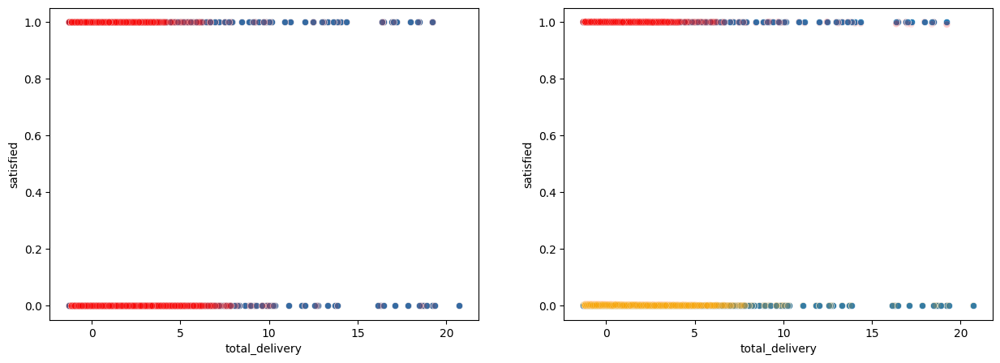

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# plot the original data on the left hand side
sns.scatterplot(data=X_scaler_with_column_names,
                x='total_delivery',
                y='satisfied', ax=axes[0])

# plot the binary predictions on the left hand side
sns.scatterplot(data=X_scaler_with_column_names,
                x='total_delivery',
                y=satisfied_predicted,
                ax=axes[0], color='red', alpha=0.1)

# plot original data again on the right hand side
sns.scatterplot(data=X_scaler_with_column_names,
                x='total_delivery',
                y='satisfied', ax=axes[1])

# color predictions 1 in red, predictions 0 in orange
predicted_colors = np.where(probs_1 >= 0.5, 'red', 'orange')

# plot the raw probabilities on the right hand side
sns.scatterplot(data=X_scaler_with_column_names,
                x='total_delivery',
                y=probs_1,
                ax=axes[1], color=predicted_colors, alpha=0.1)

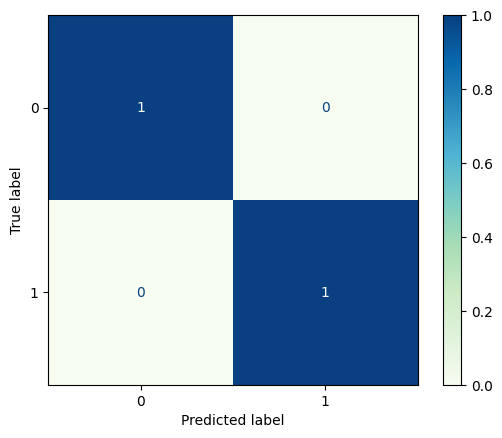

In [ ]:
accuracy_score(X_scaler_with_column_names['satisfied'], # true
               satisfied_predicted # predicted
               )

cm = confusion_matrix(X_scaler_with_column_names['satisfied'], # true
                      satisfied_predicted, # predicted
                      normalize='true'
                      )

disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=logistics_reg.classes_)
disp.plot(cmap=plt.cm.GnBu)

In [ ]:
X_with_constant = sm.add_constant(X)


logistics_reg_sm = sm.Logit(y, X_with_constant).fit()
print(logistics_reg_sm.summary())

         Current function value: inf
         Iterations: 35


/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:2385: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/usr/local/lib/python3.10/dist-packages/statsmodels/discrete/discrete_model.py:2443: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q * linpred)))


LinAlgError: Singular matrix

## Train test

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X=stats_multiple[['order_delay','order_size','seller_total_score','product_category_total_score','total_delivery','price','product_weight_g','freight_value']]
X

,order_delay,order_size,seller_total_score,product_category_total_score,product_category_total_score,total_delivery,price,product_weight_g,freight_value
order_id,,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,-9.0,1.0,3.75,3.4,3.4,7.0,58.90,650.0,13.29
00018f77f2f0320c557190d7a144bdd3,-3.0,1.0,3.50,3.0,3.0,16.0,239.90,30000.0,19.93
000229ec398224ef6ca0657da4fc703e,-14.0,1.0,4.00,2.8,2.8,7.0,199.00,3050.0,17.87
00024acbcdf0a6daa1e931b038114c75,-6.0,1.0,3.25,2.4,2.4,6.0,12.99,200.0,12.79
00042b26cf59d7ce69dfabb4e55b4fd9,-16.0,1.0,3.50,2.8,2.8,25.0,199.90,3750.0,18.14
...,...,...,...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,-8.0,1.0,4.25,2.4,2.4,17.0,299.99,10150.0,43.41
fffcd46ef2263f404302a634eb57f7eb,-9.0,1.0,3.50,2.4,2.4,9.0,350.00,8950.0,36.53
fffce4705a9662cd70adb13d4a31832d,-13.0,1.0,4.50,3.0,3.0,4.0,99.90,967.0,16.95


In [ ]:
X_train, X_test, y_train, y_test=train_test_split(X,y,test_size=0.3, random_state=21)

In [ ]:
X_train

,order_delay,order_size,seller_total_score,product_category_total_score,product_category_total_score,total_delivery,price,product_weight_g,freight_value
order_id,,,,,,,,,
a13562e9c4b0eb8e6ae0946073b213f8,-20.0,2.0,4.25,2.4,2.4,8.0,792.915,1112.5,28.605
5c2630d9eb5757718ef5a12b09368935,-13.0,1.0,3.25,3.4,3.4,14.0,24.990,237.0,18.280
cf2b1a6921421d6455c8be0a1e2677d4,-7.0,1.0,3.25,3.0,3.0,8.0,141.610,625.0,20.180
d1906aaa99334bb372ca6bb31b8ae5d5,-18.0,1.0,3.75,3.0,3.0,5.0,50.900,250.0,8.720
583d26399c28234b68343e4ec352842a,-38.0,1.0,4.00,3.0,3.0,7.0,40.500,400.0,19.320
...,...,...,...,...,...,...,...,...,...
dac5565e9e4cc5f3bd66470ed608c95c,-17.0,1.0,3.25,3.0,3.0,13.0,119.990,350.0,62.870
17fed53ba6dfef9b594ee2268642e2aa,-28.0,1.0,2.50,2.4,2.4,11.0,9.900,200.0,8.720
bf1956dea4fd9c8118a6553cf6dd375a,-7.0,1.0,3.00,3.4,3.4,14.0,79.000,600.0,15.430


In [ ]:
X_test

,order_delay,order_size,seller_total_score,product_category_total_score,product_category_total_score,total_delivery,price,product_weight_g,freight_value
order_id,,,,,,,,,
05c30545ba4331e04ae0de1523bb41f4,-11.0,1.0,3.25,2.4,2.4,11.0,28.30,850.0,16.11
96245f4488be31192a246b608e6deec4,-17.0,1.0,4.00,3.0,3.0,9.0,99.90,1250.0,16.29
a1211febecce5b1f8faf9f5e533bd627,-11.0,1.0,3.50,2.4,2.4,7.0,84.99,2200.0,14.36
77ea41cd71582db7c8dc337bbe28b561,-13.0,1.0,3.75,1.8,1.8,8.0,98.99,2100.0,15.80
22473977c12e562a85b3713c75e36120,-8.0,1.0,3.50,3.4,3.4,20.0,118.80,1525.0,53.18
...,...,...,...,...,...,...,...,...,...
68b4f0f2635234fcc9cbcd65b082e5b7,-7.0,1.0,3.75,3.0,3.0,22.0,119.99,10475.0,36.50
9f47e04f95b2bba1442d5bbf0611733e,-8.0,1.0,3.25,3.0,3.0,7.0,49.90,400.0,11.85
e5a111e770d6ac9f8f3ee2a37bd23f47,-15.0,1.0,3.50,2.8,2.8,14.0,73.35,1000.0,16.27


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler=StandardScaler()

In [ ]:
X_train_scaled=scaler.fit_transform(X_train)

In [ ]:
X_test_scaled=scaler.transform(X_test)

In [ ]:
X_train_scaled

array([[-0.80780179,  1.6346027 ,  1.28117206, ...,  3.58695905,
        -0.25955817,  0.55599766],
       [-0.10824672, -0.26676743, -0.98281232, ..., -0.53549514,
        -0.49557102, -0.11498875],
       [ 0.49137192, -0.26676743, -0.98281232, ...,  0.09055638,
        -0.39097595,  0.00848575],
       ...,
       [ 0.49137192, -0.26676743, -1.54880841, ..., -0.24555308,
        -0.39771532, -0.30020049],
       [-0.20818315, -0.26676743,  0.14917987, ..., -0.18703858,
        -0.18663815, -0.24171257],
       [-0.60792891, -0.26676743, -0.41681622, ..., -0.63743921,
        -0.51902404, -0.11823808]])

In [ ]:
X_test_scaled

array([[ 0.09162616, -0.26676743, -0.98281232, ..., -0.51772605,
        -0.33032159, -0.25600962],
       [-0.50799247, -0.26676743,  0.71517596, ..., -0.13335555,
        -0.22249162, -0.24431204],
       [ 0.09162616, -0.26676743, -0.41681622, ..., -0.21339695,
         0.03360456, -0.36973613],
       ...,
       [-0.30811959, -0.26676743, -0.41681622, ..., -0.275884  ,
        -0.28988535, -0.24561177],
       [ 0.59130836, -0.26676743,  0.14917987, ..., -0.4229755 ,
        -0.49206654, -0.81034512],
       [ 2.49010069,  1.6346027 , -0.98281232, ..., -0.34808767,
        -0.06074666, -0.15463056]])

In [ ]:
log_reg=LogisticRegression(random_state=0).fit(X_train_scaled,y_train)

In [ ]:
log_reg.predict(X_train_scaled)

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
log_reg.score(X_train_scaled,y_train)

0.8142718663783461

In [ ]:
log_reg.score(X_test_scaled,y_test)

0.8151228338784884

In [ ]:
X_with_constant = sm.add_constant(X_train_scaled)
logistics_reg_sm = sm.Logit(y_train, X_with_constant).fit()

Optimization terminated successfully.
         Current function value: 0.464368
         Iterations 6


In [ ]:
print(logistics_reg_sm.summary())

                           Logit Regression Results                           
Dep. Variable:              satisfied   No. Observations:                67055
Model:                          Logit   Df Residuals:                    67046
Method:                           MLE   Df Model:                            8
Date:                Tue, 09 Jul 2024   Pseudo R-squ.:                 0.09899
Time:                        14:31:25   Log-Likelihood:                -31138.
converged:                       True   LL-Null:                       -34559.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.4289      0.010    138.419      0.000       1.409       1.449
x1            -0.2388      0.014    -17.454      0.000      -0.266      -0.212
x2            -0.2728      0.009    -29.531      0.0

# Machine learning

In [ ]:
#import necessary packages
!pip uninstall scikit-learn -y
!pip install -U scikit-learn

Found existing installation: scikit-learn 1.5.1
Uninstalling scikit-learn-1.5.1:
  Successfully uninstalled scikit-learn-1.5.1
  Using cached scikit_learn-1.5.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.4 MB)


## Random Forest Regressor

In [ ]:
#denormalised data, defining features
interesting_features_temporal = ["order_delay", "total_delivery"]

interesting_features_numeric = [
        "price", "freight_value",
        "product_weight_g",
        "order_size",
        "product_category_total_score",'seller_total_score']


interesting_features_categorical = ["customer_city","customer_state","seller_id","seller_city","seller_state",
                                    "product_category_name_english_new"]


target = ["review_score"]

df_order_stats=df_no_duplicate_reviews_merged[["order_id", "customer_id", "order_item_id", "product_id"] + interesting_features_numeric + interesting_features_categorical+ interesting_features_temporal+target]
df_order_stats

,order_id,customer_id,order_item_id,product_id,price,freight_value,product_weight_g,order_size,product_category_total_score,seller_total_score,customer_city,customer_state,seller_id,seller_city,seller_state,product_category_name_english_new,order_delay,total_delivery,review_score
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,1000.0,3.0,3.0,2.25,sao joaquim da barra,SP,ecccfa2bb93b34a3bf033cc5d1dcdc69,curitiba,PR,health_beauty,36.0,54.0,1.0
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,1000.0,3.0,3.0,2.25,sao joaquim da barra,SP,ecccfa2bb93b34a3bf033cc5d1dcdc69,curitiba,PR,health_beauty,36.0,54.0,1.0
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,1000.0,3.0,3.0,2.25,sao joaquim da barra,SP,ecccfa2bb93b34a3bf033cc5d1dcdc69,curitiba,PR,health_beauty,36.0,54.0,1.0
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,1.0,d5f4f441812a9a67cf8fa6d6019192c8,174.90,17.65,1700.0,1.0,3.0,3.75,sao paulo,SP,b1fecf4da1fa2689bccffa0121953643,campo grande,MS,health_beauty,-48.0,10.0,5.0
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,1.0,2636a9812d151c718b53387171ce08be,30.97,14.52,443.0,1.0,3.0,3.25,coronel fabriciano,MG,b17b679f4f5ce2e03ce6968c62648246,ribeirao preto,SP,health_beauty,-44.0,10.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,1.0,065554bfe0244b9f5f6414f332106a21,54.00,16.35,800.0,2.0,0.8,3.25,niteroi,RJ,e62b2d6ac10570a035a30bafcf01d263,sao paulo,SP,flowers,-17.0,7.0,5.0
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,17.99,18.23,200.0,1.0,0.8,3.50,colatina,ES,8bb48dc19fccaa8613b6229bf7f452a2,assis,SP,flowers,-8.0,7.0,5.0
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,1.0,e0714d4d2e52b1fbc8e851dac210333a,30.00,17.14,550.0,1.0,0.8,1.25,porto alegre,RS,d7f1cfc638473be93baedbfd02208016,belford roxo,RJ,flowers,-10.0,12.0,5.0
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,1.0,065554bfe0244b9f5f6414f332106a21,54.90,17.66,800.0,2.0,0.8,3.25,recife,PE,e62b2d6ac10570a035a30bafcf01d263,sao paulo,SP,flowers,-10.0,15.0,NaN


In [ ]:
df_order_stats=df_order_stats.groupby('order_id').agg({'review_score':'mean','order_delay':'mean','total_delivery':'mean','product_weight_g':'mean','price':'mean','freight_value':'mean','order_size':'mean','product_category_total_score':'mean','seller_total_score':'mean'}).reset_index()
df_order_stats

,order_id,review_score,order_delay,total_delivery,product_weight_g,price,freight_value,order_size,product_category_total_score,seller_total_score
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,-9.0,7.0,650.0,58.90,13.29,1.0,3.4,3.75
1,00018f77f2f0320c557190d7a144bdd3,4.0,-3.0,16.0,30000.0,239.90,19.93,1.0,3.0,3.50
2,000229ec398224ef6ca0657da4fc703e,5.0,-14.0,7.0,3050.0,199.00,17.87,1.0,2.8,4.00
3,00024acbcdf0a6daa1e931b038114c75,4.0,-6.0,6.0,200.0,12.99,12.79,1.0,2.4,3.25
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,-16.0,25.0,3750.0,199.90,18.14,1.0,2.8,3.50
...,...,...,...,...,...,...,...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,-8.0,17.0,10150.0,299.99,43.41,1.0,2.4,4.25
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,-9.0,9.0,8950.0,350.00,36.53,1.0,2.4,3.50
98800,fffce4705a9662cd70adb13d4a31832d,5.0,-13.0,4.0,967.0,99.90,16.95,1.0,3.0,4.50
98801,fffe18544ffabc95dfada21779c9644f,5.0,-9.0,1.0,100.0,55.99,8.72,1.0,2.4,4.75


In [ ]:
df_order_stats['product_weight_g']=df_order_stats['product_weight_g'].fillna(0)

In [ ]:
#data preprocessing
df_order_stats = df_order_stats[~df_order_stats['total_delivery'].isna()]
df_order_stats = df_order_stats[~df_order_stats['review_score'].isna()]

In [ ]:
df_order_stats

,order_id,review_score,order_delay,total_delivery,product_weight_g,price,freight_value,order_size,product_category_total_score,seller_total_score
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,-9.0,7.0,650.0,58.90,13.29,1.0,3.4,3.75
1,00018f77f2f0320c557190d7a144bdd3,4.0,-3.0,16.0,30000.0,239.90,19.93,1.0,3.0,3.50
2,000229ec398224ef6ca0657da4fc703e,5.0,-14.0,7.0,3050.0,199.00,17.87,1.0,2.8,4.00
3,00024acbcdf0a6daa1e931b038114c75,4.0,-6.0,6.0,200.0,12.99,12.79,1.0,2.4,3.25
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,-16.0,25.0,3750.0,199.90,18.14,1.0,2.8,3.50
...,...,...,...,...,...,...,...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,-8.0,17.0,10150.0,299.99,43.41,1.0,2.4,4.25
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,-9.0,9.0,8950.0,350.00,36.53,1.0,2.4,3.50
98800,fffce4705a9662cd70adb13d4a31832d,5.0,-13.0,4.0,967.0,99.90,16.95,1.0,3.0,4.50
98801,fffe18544ffabc95dfada21779c9644f,5.0,-9.0,1.0,100.0,55.99,8.72,1.0,2.4,4.75


In [ ]:
#random forest regressor
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rfr = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1, oob_score=True,max_features=4)

In [ ]:
X = df_order_stats.drop(columns=['order_id', 'review_score'])
y = df_order_stats['review_score']

In [ ]:
rfr.fit(X, y)

RandomForestRegressor(max_depth=10, max_features=4, n_jobs=-1, oob_score=True,
                      random_state=42)

In [ ]:
rfr.oob_score_

0.2138277789102363

In [ ]:
rfr.oob_prediction_

array([4.42951366, 3.99120422, 4.4950011 , ..., 4.55552753, 4.42268454,
       4.41856866])

In [ ]:
rfr.score(X, y)

0.2633082072318853

In [ ]:
rfr.feature_importances_

array([0.5296206 , 0.23200506, 0.03443084, 0.03724515, 0.04557204,
       0.08403469, 0.0164913 , 0.02060033])

In [ ]:
def plot_feature_importances(rf, include_std: bool = True):
    importances = rf.feature_importances_
    if include_std:
        std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
    forest_importances = pd.Series(importances, index=X.columns)

    fig, ax = plt.subplots()
    forest_importances.plot.bar(yerr=std, ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()

    return forest_importances, std

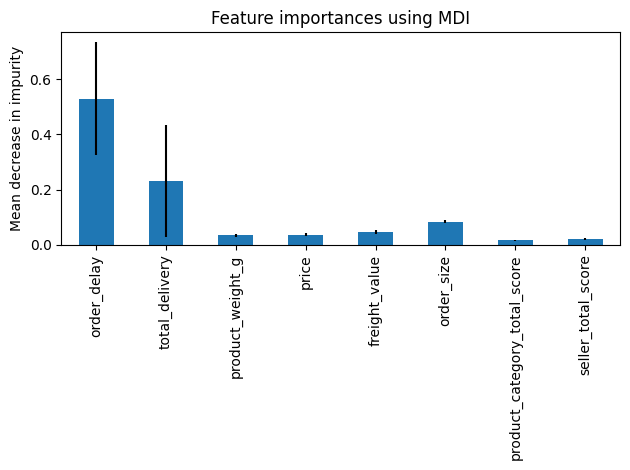

In [ ]:
forest_importances, std = plot_feature_importances(rfr)

In [ ]:
forest_importances.sort_values(ascending=False)

order_delay                     0.529621
total_delivery                  0.232005
order_size                      0.084035
freight_value                   0.045572
price                           0.037245
product_weight_g                0.034431
seller_total_score              0.020600
product_category_total_score    0.016491
dtype: float64

## Random Forest Classifier

In [ ]:
df_order_stats['satisfied'] = np.where(df_order_stats['review_score'] >= 4, 1, 0)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rfc = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1, oob_score=True)

In [ ]:
X = df_order_stats.drop(columns=['order_id', 'review_score', 'satisfied'])
y = df_order_stats['satisfied']

In [ ]:
rfc.fit(X, y)

RandomForestClassifier(max_depth=10, n_jobs=-1, oob_score=True, random_state=42)

In [ ]:
rfc.oob_score_

0.823325574841612

In [ ]:
rfc.score(X, y)

0.8290035382897223

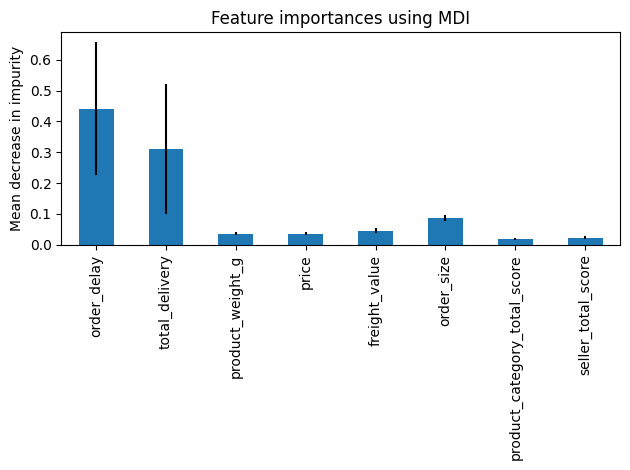

In [ ]:
forest_importances, std = plot_feature_importances(rfc)

In [ ]:
forest_importances.sort_values(ascending=False)

order_delay                     0.441190
total_delivery                  0.310228
order_size                      0.087435
freight_value                   0.045707
price                           0.036479
product_weight_g                0.035987
seller_total_score              0.023528
product_category_total_score    0.019446
dtype: float64

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix

In [ ]:
predictions = rfc.predict(X)

In [ ]:
cm = confusion_matrix(y, predictions, labels=rfc.classes_)
cm_norm = confusion_matrix(y, predictions, labels=rfc.classes_, normalize='true')

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rfc.classes_)
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=rfc.classes_)

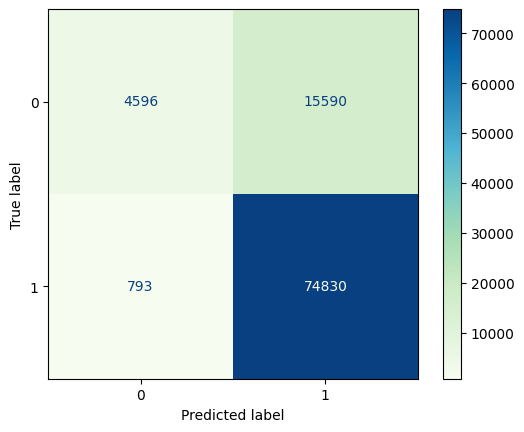

In [ ]:
disp.plot(cmap=plt.cm.GnBu)

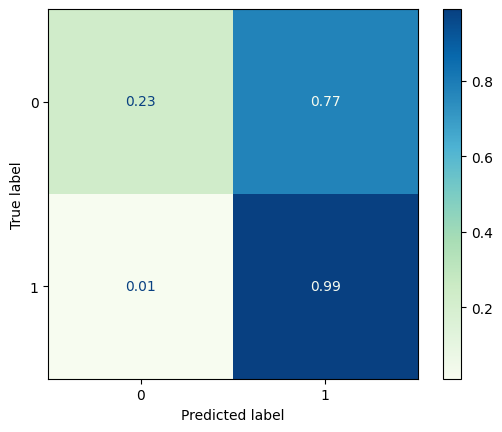

In [ ]:
disp_norm.plot(cmap=plt.cm.GnBu)

# K-means top features

In [ ]:
#denormalised data, defining features
interesting_features_temporal = ["order_delay", "total_delivery"]

interesting_features_numeric = [
        "price", "freight_value",
        "product_category_total_score",
        "product_weight_g",
        "order_size",'seller_total_score']
        #,'same_state']

interesting_features_categorical = ["customer_city","customer_state","seller_id","seller_city","seller_state",
                                    "product_category_name_english_new"]


target = ["review_score"]

df_order_stats_K=df_no_duplicate_reviews_merged[["order_id", "customer_id", "order_item_id", "product_id"] + interesting_features_numeric + interesting_features_categorical+ interesting_features_temporal+target]
df_order_stats_K

,order_id,customer_id,order_item_id,product_id,price,freight_value,product_category_total_score,product_weight_g,order_size,seller_total_score,customer_city,customer_state,seller_id,seller_city,seller_state,product_category_name_english_new,order_delay,total_delivery,review_score
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,3.0,1000.0,3.0,2.25,sao joaquim da barra,SP,ecccfa2bb93b34a3bf033cc5d1dcdc69,curitiba,PR,health_beauty,36.0,54.0,1.0
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,3.0,1000.0,3.0,2.25,sao joaquim da barra,SP,ecccfa2bb93b34a3bf033cc5d1dcdc69,curitiba,PR,health_beauty,36.0,54.0,1.0
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,2.83,3.0,1000.0,3.0,2.25,sao joaquim da barra,SP,ecccfa2bb93b34a3bf033cc5d1dcdc69,curitiba,PR,health_beauty,36.0,54.0,1.0
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,1.0,d5f4f441812a9a67cf8fa6d6019192c8,174.90,17.65,3.0,1700.0,1.0,3.75,sao paulo,SP,b1fecf4da1fa2689bccffa0121953643,campo grande,MS,health_beauty,-48.0,10.0,5.0
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,1.0,2636a9812d151c718b53387171ce08be,30.97,14.52,3.0,443.0,1.0,3.25,coronel fabriciano,MG,b17b679f4f5ce2e03ce6968c62648246,ribeirao preto,SP,health_beauty,-44.0,10.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,1.0,065554bfe0244b9f5f6414f332106a21,54.00,16.35,0.8,800.0,2.0,3.25,niteroi,RJ,e62b2d6ac10570a035a30bafcf01d263,sao paulo,SP,flowers,-17.0,7.0,5.0
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,17.99,18.23,0.8,200.0,1.0,3.50,colatina,ES,8bb48dc19fccaa8613b6229bf7f452a2,assis,SP,flowers,-8.0,7.0,5.0
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,1.0,e0714d4d2e52b1fbc8e851dac210333a,30.00,17.14,0.8,550.0,1.0,1.25,porto alegre,RS,d7f1cfc638473be93baedbfd02208016,belford roxo,RJ,flowers,-10.0,12.0,5.0
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,1.0,065554bfe0244b9f5f6414f332106a21,54.90,17.66,0.8,800.0,2.0,3.25,recife,PE,e62b2d6ac10570a035a30bafcf01d263,sao paulo,SP,flowers,-10.0,15.0,NaN


In [ ]:
df_order_stats_K=df_order_stats_K.groupby('order_id').agg({'review_score':'mean','order_delay':'mean','total_delivery':'mean','product_weight_g':'mean','price':'mean','freight_value':'mean','order_size':'mean','product_category_total_score':'mean','seller_total_score':'mean'}).reset_index()
df_order_stats_K

,order_id,review_score,order_delay,total_delivery,product_weight_g,price,freight_value,order_size,product_category_total_score,seller_total_score
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,-9.0,7.0,650.0,58.90,13.29,1.0,3.4,3.75
1,00018f77f2f0320c557190d7a144bdd3,4.0,-3.0,16.0,30000.0,239.90,19.93,1.0,3.0,3.50
2,000229ec398224ef6ca0657da4fc703e,5.0,-14.0,7.0,3050.0,199.00,17.87,1.0,2.8,4.00
3,00024acbcdf0a6daa1e931b038114c75,4.0,-6.0,6.0,200.0,12.99,12.79,1.0,2.4,3.25
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,-16.0,25.0,3750.0,199.90,18.14,1.0,2.8,3.50
...,...,...,...,...,...,...,...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,-8.0,17.0,10150.0,299.99,43.41,1.0,2.4,4.25
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,-9.0,9.0,8950.0,350.00,36.53,1.0,2.4,3.50
98800,fffce4705a9662cd70adb13d4a31832d,5.0,-13.0,4.0,967.0,99.90,16.95,1.0,3.0,4.50
98801,fffe18544ffabc95dfada21779c9644f,5.0,-9.0,1.0,100.0,55.99,8.72,1.0,2.4,4.75


In [ ]:
#data preprocessing
df_order_stats_K = df_order_stats_K[~df_order_stats_K['total_delivery'].isna()]
df_order_stats_K = df_order_stats_K[~df_order_stats_K['review_score'].isna()]

In [ ]:
df_order_stats_K

,order_id,review_score,order_delay,total_delivery,product_weight_g,price,freight_value,order_size,product_category_total_score,seller_total_score
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,-9.0,7.0,650.0,58.90,13.29,1.0,3.4,3.75
1,00018f77f2f0320c557190d7a144bdd3,4.0,-3.0,16.0,30000.0,239.90,19.93,1.0,3.0,3.50
2,000229ec398224ef6ca0657da4fc703e,5.0,-14.0,7.0,3050.0,199.00,17.87,1.0,2.8,4.00
3,00024acbcdf0a6daa1e931b038114c75,4.0,-6.0,6.0,200.0,12.99,12.79,1.0,2.4,3.25
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,-16.0,25.0,3750.0,199.90,18.14,1.0,2.8,3.50
...,...,...,...,...,...,...,...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,-8.0,17.0,10150.0,299.99,43.41,1.0,2.4,4.25
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,-9.0,9.0,8950.0,350.00,36.53,1.0,2.4,3.50
98800,fffce4705a9662cd70adb13d4a31832d,5.0,-13.0,4.0,967.0,99.90,16.95,1.0,3.0,4.50
98801,fffe18544ffabc95dfada21779c9644f,5.0,-9.0,1.0,100.0,55.99,8.72,1.0,2.4,4.75


In [ ]:
X = df_order_stats_K[[
    'total_delivery',
    'order_size',
    'freight_value'
    ]]

In [ ]:
X

,total_delivery,order_size,freight_value
0,7.0,1.0,13.29
1,16.0,1.0,19.93
2,7.0,1.0,17.87
3,6.0,1.0,12.79
4,25.0,1.0,18.14
...,...,...,...
98798,17.0,1.0,43.41
98799,9.0,1.0,36.53
98800,4.0,1.0,16.95
98801,1.0,1.0,8.72


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [ ]:
X_scaler = scaler.fit_transform(X)

In [ ]:
X_scaler_with_column_names = pd.DataFrame(data=X_scaler, columns=X.columns)

In [ ]:
X_scaler_with_column_names

,total_delivery,order_size,freight_value
0,-0.533685,-0.264524,-0.437099
1,0.417106,-0.264524,-0.013519
2,-0.533685,-0.264524,-0.144931
3,-0.639328,-0.264524,-0.468995
4,1.367896,-0.264524,-0.127707
...,...,...,...
95804,0.522749,-0.264524,1.484324
95805,-0.322398,-0.264524,1.045433
95806,-0.850615,-0.264524,-0.203620
95807,-1.167545,-0.264524,-0.728630


In [ ]:
from sklearn.cluster import KMeans

In [ ]:
k_vector = list(range(1, 10))
error = []

for k in k_vector:
    k_means = KMeans(n_clusters=k, random_state=42)
    k_means.fit(X_scaler_with_column_names)
    error.append(k_means.inertia_)

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x79cffd65b490>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: dlopen() error


<Axes: >

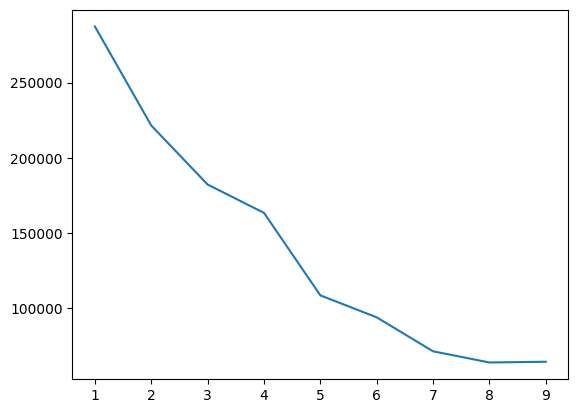

In [ ]:
sns.lineplot(x=k_vector, y=error)

In [ ]:
k_means_best = KMeans(n_clusters=3, random_state=42)

predicted_clusters = k_means_best.fit_predict(X_scaler_with_column_names)
predicted_clusters

array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

<Axes: >

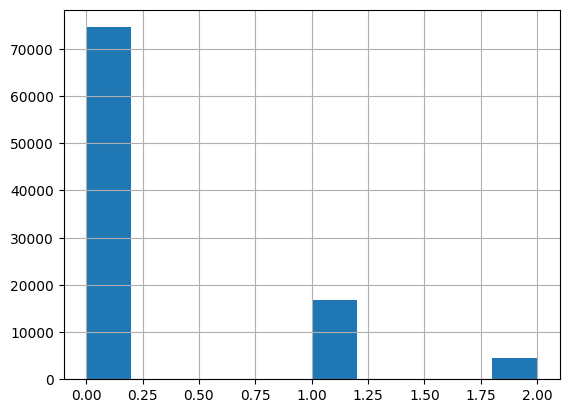

In [ ]:
pd.Series(predicted_clusters).hist()

In [ ]:
X_scaler_with_column_names["cluster"] = predicted_clusters

<Axes: xlabel='total_delivery', ylabel='Density'>

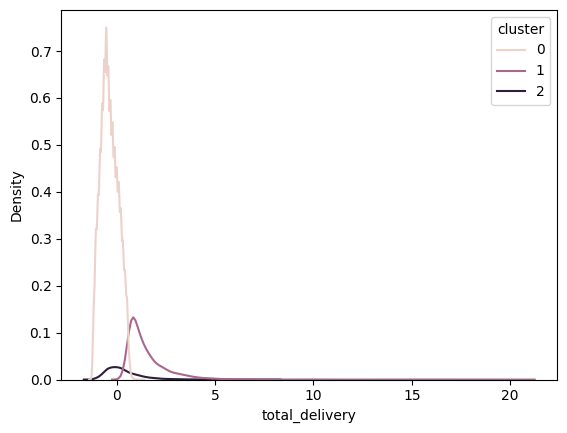

In [ ]:
sns.kdeplot(data=X_scaler_with_column_names, x="total_delivery", hue="cluster")

<Axes: xlabel='order_size', ylabel='Density'>

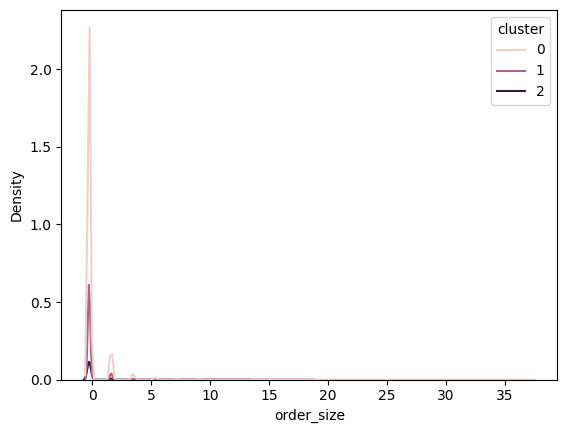

In [ ]:
sns.kdeplot(data=X_scaler_with_column_names, x="order_size", hue="cluster")

<Axes: xlabel='freight_value', ylabel='Density'>

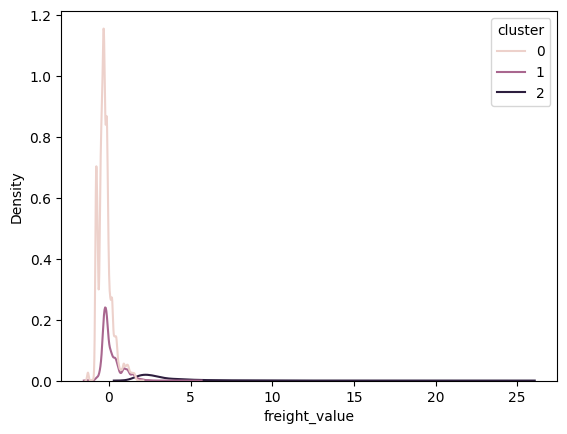

In [ ]:
sns.kdeplot(data=X_scaler_with_column_names, x="freight_value", hue="cluster")

In [ ]:
df_order_stats_K['cluster']=predicted_clusters

In [ ]:
df_order_stats_K.groupby('cluster')[['total_delivery', 'order_size','freight_value','review_score']].mean()

,total_delivery,order_size,freight_value,review_score
cluster,,,,
0,8.589384,1.155156,16.490503,4.321105
1,26.627899,1.093174,22.446229,3.422167
2,15.022005,1.090290,73.131769,4.158802


# K-means customer segmentation

In [ ]:
#denormalised data, defining features
interesting_features_temporal = ["order_delay", "total_delivery"]

interesting_features_numeric = [
        "payment_value"]
      #  "order_size"]

interesting_features_categorical = ["customer_state",
                                    "product_category_name_english_clean"]


target = ["review_score"]

df_order_stats_customer_seg=df_no_duplicate_reviews_merged[["order_id", "customer_id", "order_item_id", "product_id"] + interesting_features_numeric + interesting_features_categorical+target]
df_order_stats_customer_seg

,order_id,customer_id,order_item_id,product_id,payment_value,customer_state,product_category_name_english_clean,review_score
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,1.0,5a6b04657a4c5ee34285d1e4619a96b4,47.82,SP,health_beauty,1.0
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,2.0,5a6b04657a4c5ee34285d1e4619a96b4,47.82,SP,health_beauty,1.0
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,3.0,5a6b04657a4c5ee34285d1e4619a96b4,47.82,SP,health_beauty,1.0
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,1.0,d5f4f441812a9a67cf8fa6d6019192c8,192.55,SP,health_beauty,5.0
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,1.0,2636a9812d151c718b53387171ce08be,45.49,MG,health_beauty,5.0
...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,1.0,065554bfe0244b9f5f6414f332106a21,70.35,RJ,flowers,5.0
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,36.22,ES,flowers,5.0
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,1.0,e0714d4d2e52b1fbc8e851dac210333a,47.14,RS,flowers,5.0
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,1.0,065554bfe0244b9f5f6414f332106a21,72.56,PE,flowers,NaN


In [ ]:
from sklearn import preprocessing
import sklearn.preprocessing as preprocessing

In [ ]:
label_encoder=preprocessing.LabelEncoder()

In [ ]:
df_order_stats_customer_seg['customer_state_encoded']=label_encoder.fit_transform(df_order_stats_customer_seg['customer_state'])
df_order_stats_customer_seg['product_category']=label_encoder.fit_transform(df_order_stats_customer_seg['product_category_name_english_clean'])
df_order_stats_customer_seg

<ipython-input-121-3d5c45d2b292>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_order_stats_customer_seg['customer_state_encoded']=label_encoder.fit_transform(df_order_stats_customer_seg['customer_state'])
<ipython-input-121-3d5c45d2b292>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_order_stats_customer_seg['product_category']=label_encoder.fit_transform(df_order_stats_customer_seg['product_category_name_english_clean'])


,order_id,customer_id,order_item_id,product_id,payment_value,customer_state,product_category_name_english_clean,review_score,customer_state_encoded,product_category
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,1.0,5a6b04657a4c5ee34285d1e4619a96b4,47.82,SP,health_beauty,1.0,25,43
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,2.0,5a6b04657a4c5ee34285d1e4619a96b4,47.82,SP,health_beauty,1.0,25,43
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,3.0,5a6b04657a4c5ee34285d1e4619a96b4,47.82,SP,health_beauty,1.0,25,43
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,1.0,d5f4f441812a9a67cf8fa6d6019192c8,192.55,SP,health_beauty,5.0,25,43
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,1.0,2636a9812d151c718b53387171ce08be,45.49,MG,health_beauty,5.0,10,43
...,...,...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,1.0,065554bfe0244b9f5f6414f332106a21,70.35,RJ,flowers,5.0,18,35
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,36.22,ES,flowers,5.0,7,35
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,1.0,e0714d4d2e52b1fbc8e851dac210333a,47.14,RS,flowers,5.0,22,35
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,1.0,065554bfe0244b9f5f6414f332106a21,72.56,PE,flowers,NaN,15,35


In [ ]:
#customer states with encoded codes
names_state=df_order_stats_customer_seg.groupby('customer_state')['customer_state_encoded'].max()
names_state

customer_state
AC     0
AL     1
AM     2
AP     3
BA     4
CE     5
DF     6
ES     7
GO     8
MA     9
MG    10
MS    11
MT    12
PA    13
PB    14
PE    15
PI    16
PR    17
RJ    18
RN    19
RO    20
RR    21
RS    22
SC    23
SE    24
SP    25
TO    26
Name: customer_state_encoded, dtype: int64

In [ ]:
#product categories with encoded codes
names_product_cat=df_order_stats_customer_seg.groupby('product_category_name_english_clean')['product_category'].max()
names_product_cat[30:]

product_category_name_english_clean
fashion_male_clothing                      30
fashion_shoes                              31
fashion_sport                              32
fashion_underwear_beach                    33
fixed_telephony                            34
flowers                                    35
food                                       36
food_drink                                 37
furniture_bedroom                          38
furniture_decor                            39
furniture_living_room                      40
furniture_mattress_and_upholstery          41
garden_tools                               42
health_beauty                              43
home_appliances                            44
home_comfort                               45
home_construction                          46
housewares                                 47
industry_commerce_and_business             48
kitchen_dining_laundry_garden_furniture    49
la_cuisine                                 5

In [ ]:
df_order_stats_customer_seg_agg=df_order_stats_customer_seg.groupby('order_id').agg({'review_score':'mean','payment_value':'mean','customer_state_encoded':'max'}).reset_index()

In [ ]:
#calculating the mode product category per order
df_order_stats_customer_seg_agg['mode_product']=df_order_stats_customer_seg.groupby('order_id')['product_category'].transform(lambda x: x.value_counts().index[0])

In [ ]:
df_order_stats_customer_seg_agg

,order_id,review_score,payment_value,customer_state_encoded,mode_product
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,72.19,18,43
1,00018f77f2f0320c557190d7a144bdd3,4.0,259.83,25,43
2,000229ec398224ef6ca0657da4fc703e,5.0,216.87,10,43
3,00024acbcdf0a6daa1e931b038114c75,4.0,25.78,25,43
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,218.04,25,43
...,...,...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,343.40,9,55
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,386.53,17,55
98800,fffce4705a9662cd70adb13d4a31832d,5.0,116.85,25,55
98801,fffe18544ffabc95dfada21779c9644f,5.0,64.71,25,55


In [ ]:
df_order_stats_customer_segmentation=df_order_stats_customer_seg_agg
df_order_stats_customer_segmentation

,order_id,review_score,payment_value,customer_state_encoded,mode_product
0,00010242fe8c5a6d1ba2dd792cb16214,5.0,72.19,18,43
1,00018f77f2f0320c557190d7a144bdd3,4.0,259.83,25,43
2,000229ec398224ef6ca0657da4fc703e,5.0,216.87,10,43
3,00024acbcdf0a6daa1e931b038114c75,4.0,25.78,25,43
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0,218.04,25,43
...,...,...,...,...,...
98798,fffc94f6ce00a00581880bf54a75a037,5.0,343.40,9,55
98799,fffcd46ef2263f404302a634eb57f7eb,5.0,386.53,17,55
98800,fffce4705a9662cd70adb13d4a31832d,5.0,116.85,25,55
98801,fffe18544ffabc95dfada21779c9644f,5.0,64.71,25,55


In [ ]:
df_order_stats_customer_segmentation.to_csv("df_order_stats_customer_segmentation_only_codes.csv")

In [ ]:
df_order_stats_customer_segmentation = df_order_stats_customer_segmentation[~df_order_stats_customer_segmentation['review_score'].isna()]
df_order_stats_customer_segmentation = df_order_stats_customer_segmentation[~df_order_stats_customer_segmentation['payment_value'].isna()]
#df_order_stats_customer_segmentation = df_order_stats_customer_segmentation[~df_order_stats_customer_segmentation['order_size'].isna()]
#df_order_stats_customer_seg_agg = df_order_stats_customer_seg_agg[~df_order_stats_customer_seg_agg['mode_product'].isna()]

In [ ]:
X = df_order_stats_customer_segmentation[[
    'payment_value',
    #'order_size',
    'customer_state_encoded'
    ]]

In [ ]:
X

,payment_value,customer_state_encoded
0,72.19,18
1,259.83,25
2,216.87,10
3,25.78,25
4,218.04,25
...,...,...
98798,343.40,9
98799,386.53,17
98800,116.85,25
98801,64.71,25


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [ ]:
X_scaler = scaler.fit_transform(X)

In [ ]:
X_scaler_with_column_names = pd.DataFrame(data=X_scaler, columns=X.columns)

In [ ]:
X_scaler_with_column_names

,payment_value,customer_state_encoded
0,-0.374468,-0.091818
1,0.578604,0.896621
2,0.360399,-1.221462
3,-0.610196,0.896621
4,0.366342,0.896621
...,...,...
97877,1.003078,-1.362667
97878,1.222146,-0.233023
97879,-0.147628,0.896621
97880,-0.412461,0.896621


In [ ]:
from sklearn.cluster import KMeans

In [ ]:
k_vector = list(range(1, 10))
error = []

for k in k_vector:
    k_means = KMeans(n_clusters=k, random_state=42)
    k_means.fit(X_scaler_with_column_names)
    error.append(k_means.inertia_)

<Axes: >

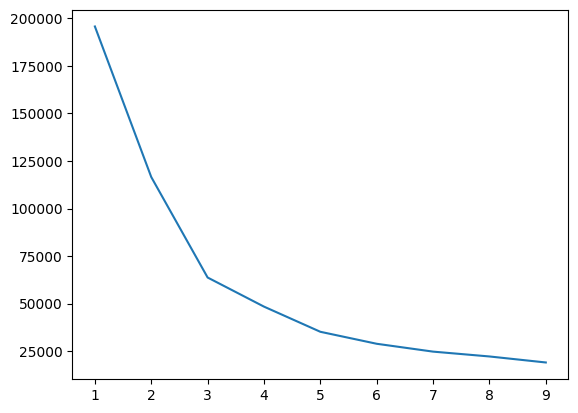

In [ ]:
sns.lineplot(x=k_vector, y=error)

In [ ]:
k_means_best = KMeans(n_clusters=3, random_state=42)

predicted_clusters = k_means_best.fit_predict(X_scaler_with_column_names)
predicted_clusters

array([0, 0, 1, ..., 0, 0, 0], dtype=int32)

<Axes: >

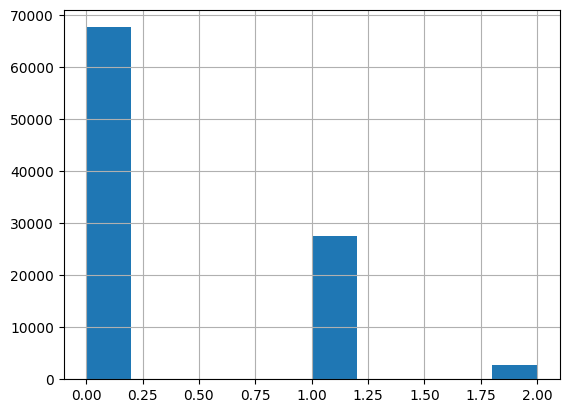

In [ ]:
pd.Series(predicted_clusters).hist()

In [ ]:
X_scaler_with_column_names["cluster"] = predicted_clusters

In [ ]:
df_plot=X_scaler_with_column_names.set_index('cluster')
df_plot

,payment_value,customer_state_encoded
cluster,,
0,-0.374468,-0.091818
0,0.578604,0.896621
1,0.360399,-1.221462
0,-0.610196,0.896621
0,0.366342,0.896621
...,...,...
1,1.003078,-1.362667
0,1.222146,-0.233023
0,-0.147628,0.896621


In [ ]:
df_plot_names=df_plot.rename({0:'Low spenders from Santa Catarina',
                                   1:'Mid spenders from Goiás',
                                   2:'High spenders from Rid De Janeiro'})
df_plot_names

,payment_value,customer_state_encoded
cluster,,
Low spenders from Santa Catarina,-0.374468,-0.091818
Low spenders from Santa Catarina,0.578604,0.896621
Mid spenders from Goiás,0.360399,-1.221462
Low spenders from Santa Catarina,-0.610196,0.896621
Low spenders from Santa Catarina,0.366342,0.896621
...,...,...
Mid spenders from Goiás,1.003078,-1.362667
Low spenders from Santa Catarina,1.222146,-0.233023
Low spenders from Santa Catarina,-0.147628,0.896621


(-1.0, 10.0)

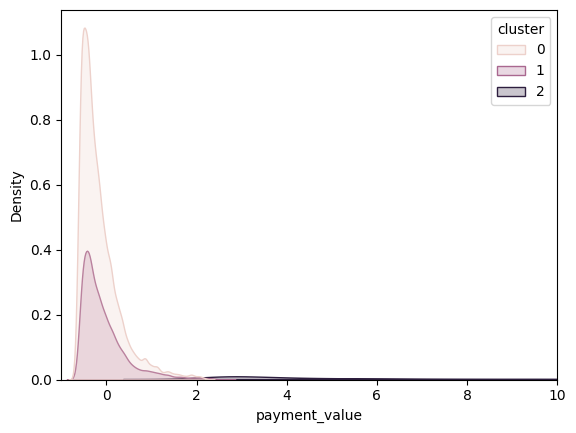

In [ ]:
sns.kdeplot(data=X_scaler_with_column_names, x="payment_value", hue="cluster",fill=True)
plt.xlim(-1,10)

(-1.0, 10.0)

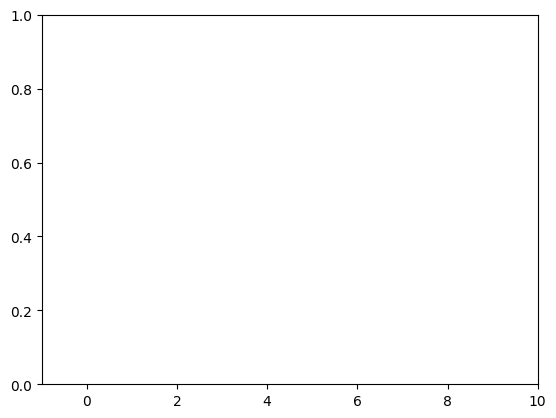

In [ ]:
#sns.kdeplot(data=X_scaler_with_column_names, x="order_size", hue="cluster",fill=True)
plt.xlim(-1,10)

<Axes: xlabel='customer_state_encoded', ylabel='Density'>

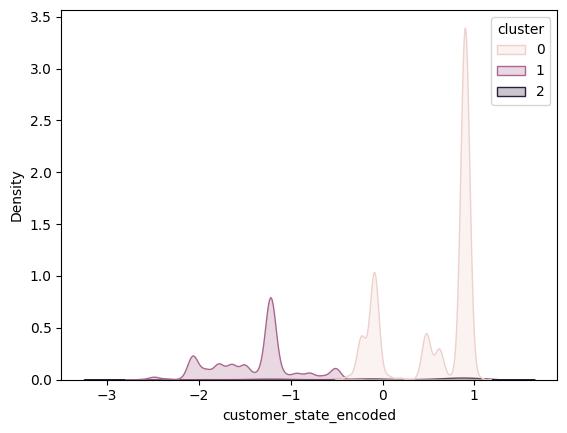

In [ ]:
sns.kdeplot(data=X_scaler_with_column_names, x="customer_state_encoded", hue="cluster",fill=True)

In [ ]:
#sns.kdeplot(data=X_scaler_with_column_names, x="mode_product", hue="cluster",fill=True)

In [ ]:
df_order_stats_customer_segmentation['cluster']=predicted_clusters

In [ ]:
df_plot_grouped=df_order_stats_customer_segmentation.groupby('cluster')[['payment_value','customer_state_encoded','review_score']].mean()
df_plot_grouped

,payment_value,customer_state_encoded,review_score
cluster,,,
0,116.189262,22.714064,4.128043
1,132.431642,8.723179,4.055372
2,1025.544524,17.745663,4.027316


Text(0, 0.5, 'Customer State')

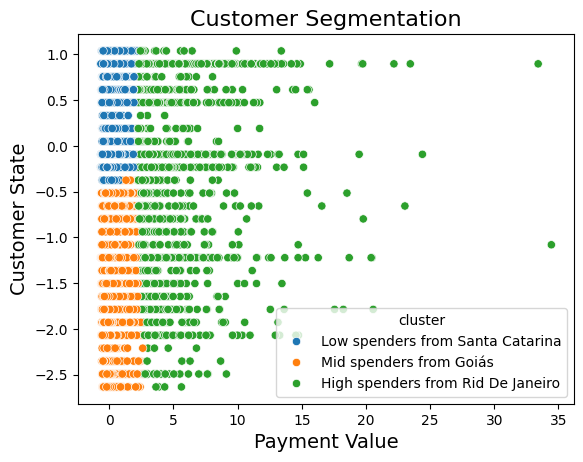

In [ ]:
sns.scatterplot(data=df_plot_names, x="payment_value", y="customer_state_encoded", hue="cluster")
plt.title("Customer Segmentation",fontsize=16)
plt.xlabel("Payment Value", fontsize=14)
plt.ylabel("Customer State",fontsize=14)

## One hot encoder

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
#denormalised data, defining features
interesting_features_temporal = ["order_delay", "total_delivery"]

interesting_features_numeric = [
        "price",
        "order_size"]

interesting_features_categorical = ["customer_state",
                                    "product_category_name_english_clean"]


target = ["review_score"]

df_order_stats_customer_seg_OH=df_no_duplicate_reviews_merged[["order_id", "customer_id", "order_item_id", "product_id"] + interesting_features_numeric + interesting_features_categorical+target]
df_order_stats_customer_seg_OH

,order_id,customer_id,order_item_id,product_id,price,order_size,customer_state,product_category_name_english_clean,review_score
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,3.0,SP,health_beauty,1.0
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,3.0,SP,health_beauty,1.0
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,3.0,SP,health_beauty,1.0
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,1.0,d5f4f441812a9a67cf8fa6d6019192c8,174.90,1.0,SP,health_beauty,5.0
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,1.0,2636a9812d151c718b53387171ce08be,30.97,1.0,MG,health_beauty,5.0
...,...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,1.0,065554bfe0244b9f5f6414f332106a21,54.00,2.0,RJ,flowers,5.0
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,17.99,1.0,ES,flowers,5.0
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,1.0,e0714d4d2e52b1fbc8e851dac210333a,30.00,1.0,RS,flowers,5.0
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,1.0,065554bfe0244b9f5f6414f332106a21,54.90,2.0,PE,flowers,NaN


In [ ]:
categorical_columns = ['product_category_name_english_clean','customer_state']

In [ ]:
encoder = OneHotEncoder(sparse_output=False)

In [ ]:
one_hot_encoded = encoder.fit_transform(df_order_stats_customer_seg_OH[categorical_columns])

In [ ]:
one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_columns))
one_hot_df

,product_category_name_english_clean_agro_industry_and_commerce,product_category_name_english_clean_air_conditioning,product_category_name_english_clean_art,product_category_name_english_clean_arts_and_craftmanship,product_category_name_english_clean_audio,product_category_name_english_clean_auto,product_category_name_english_clean_baby,product_category_name_english_clean_bed_bath_table,product_category_name_english_clean_books_general_interest,product_category_name_english_clean_books_imported,...,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112780,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112781,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
112782,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_encoded = pd.concat([df_order_stats_customer_seg_OH, one_hot_df], axis=1)

In [ ]:
df_encoded = df_encoded.drop(categorical_columns, axis=1)
df_encoded

,order_id,customer_id,order_item_id,product_id,price,order_size,review_score,product_category_name_english_clean_agro_industry_and_commerce,product_category_name_english_clean_air_conditioning,product_category_name_english_clean_art,...,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO
0,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,1.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,3.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,2.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,3.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,bfbd0f9bdef84302105ad712db648a6c,86dc2ffce2dfff336de2f386a786e574,3.0,5a6b04657a4c5ee34285d1e4619a96b4,44.99,3.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,95d31d53ccc53bca2c13fcd535d67526,345243f3e37e32114d9cf17eb7a11c29,1.0,d5f4f441812a9a67cf8fa6d6019192c8,174.90,1.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,389815397a4bcdf3dcf64b90c25b3140,3a47005be3c2748d25859444f49b0048,1.0,2636a9812d151c718b53387171ce08be,30.97,1.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112779,40db427de195f02042ceecb84dfaa2f1,65f71802835e673eb8aacfcbc2d03cea,1.0,065554bfe0244b9f5f6414f332106a21,54.00,2.0,5.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112780,8fabd912f4e4dd0372ada8ca6633a738,887193b0e6d96de4991ec1858cf75220,1.0,4a3ffd5293869f4b85d163eb3b4d0faa,17.99,1.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
112781,df832acdcfc236969ab361d4597e6e0a,773955295ef286f5d3b8fca9caa6bd9e,1.0,e0714d4d2e52b1fbc8e851dac210333a,30.00,1.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
112782,a3b2201d0e95f595df90c26c8dae015f,61b5bd939044332625d8373f774a10b3,1.0,065554bfe0244b9f5f6414f332106a21,54.90,2.0,NaN,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#decided not to preceed with this